In [1]:
import numpy as np
import pandas as pd
import pymysql
import json
import base64
import requests
from requests.exceptions import HTTPError
import datetime
import statistics
from statistics import *
from dateutil.relativedelta import relativedelta
from tqdm import tqdm
import scipy
from scipy.interpolate import BSpline, make_interp_spline
import tensorflow as tf
tf.__version__

'2.4.1'

In [2]:
from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [3]:
class Constants:
    AUTH_SPLIT_CHARACTER = ':'
    CONTENT_TYPE = "application/json"
    MBO_BASE_URL = "https://api.mindbodyonline.com/public/v6/"
    USERTOKEN_URL = "usertoken/issue"
    GET_CLIENTS_URL = "client/clients"
    MBO_API_CREDENTIALS = 'MBO_API_CREDENTIALS'
    MBO_SITE_ID = '152065'
    MBO_TOKEN = None
    MBO_NO_SHOW_API_KEY = 'MBO_NO_SHOW_API_KEY
    MBO_USER_NAME = None
    MBO_PASSWORD = None
    MBO_HEADERS = None

In [152]:
try:
    host = 'host'
    database = 'database'
    user = 'user'
    passw = 'password'
    conn = pymysql.connect(host = host, db=database, user=user, password=passw)


#     query = """SELECT * FROM EnrolmentData"""
#     enrolment_data = pd.read_sql(query, con=conn)

#     query = """SELECT * FROM CancellationData"""
#     cancellation_data = pd.read_sql(query, con=conn)
    
    query = """SELECT * FROM MembershipChangeData"""
    membership_change_data = pd.read_sql(query, con=conn)

    # query = """SELECT * FROM Staff"""


except:
    print('Database Read Error')
finally:
    conn.close()

In [117]:
try:
    host = 'host'
    database = 'database'
    user = 'user'
    passw = 'password'
    conn = pymysql.connect(host = host, db=database, user=user, password=passw)

#     query = f"""SELECT * FROM CancellationSubmissionData"""
#     cxl_data_old = pd.read_sql(query, con=conn)
    
#     query = f"""SELECT * FROM GateEventData"""
#     gate_event_data = pd.read_sql(query, con=conn)

    query = f"""SELECT * FROM PtOngoingMember"""
    pt_ongoing_data = pd.read_sql(query, con=conn)

except:
    print('Database Read Error')
finally:
    conn.close()

In [5]:

six_months = datetime.date.today() + relativedelta(months=-6)
six_months = pd.to_datetime(six_months)

three_months = datetime.date.today() + relativedelta(months=-3)
three_months = pd.to_datetime(three_months)

# gate_events = gate_event_data.copy(deep=True)

# print(f"{len(gate_events)}\n{gate_events.columns}\n{gate_events.dtypes}")


In [6]:
new_cancellations = cancellation_data[(cancellation_data['status'] == 'CANCELLATION_AUTHORISED') & (cancellation_data['cancellationOptions'] == 'Membership')]
COLS = ['createDate','firstName', 'lastName', 'phone', 'email', 'gymName', 'membershipType', 'eligibilityCheck','reasonForCancellation']
new_cancellations = new_cancellations[COLS]
print(len(new_cancellations))
new_cancellations.head()


6193


,createDate,firstName,lastName,phone,email,gymName,membershipType,eligibilityCheck,reasonForCancellation
0,2020-08-26 05:56:32,Clint,Test,61413506306,clint@thefitnessplayground.com.au,The Bunker,Play,Outside of Contract Minimum Term,Lack of Motivation
2,2020-08-29 23:47:43,Emma,Kelly,61402889028,emma3kelly@gmail.com,Surry Hills,Play,Outside of Contract Minimum Term,Relocating
3,2020-08-30 01:43:02,Ben,Whiteley,61432575436,b.whiteley94@hotmail.com,The Bunker,Gym,Within Contract Minimum Term,Relocating
4,2020-08-30 03:05:13,Aslan,Bedak-Stone,61432766123,chicken_death@hotmail.com,Newtown,Gym,Outside of Contract Minimum Term,Medical: Unable to exercise for 6+ Months
8,2020-08-31 01:15:46,Byron,Mackenzie,61468680064,byronmac@me.com,Newtown,Gym,Outside of Contract Minimum Term,Relocating


In [7]:
cxl_data_old.columns = ['id', 'gymName', 'formId', 'uniqueId', 'firstName', 'lastName', 'phone',
       'email', 'reasonForCancellation', 'doYouHaveaPT', 'cxlExplaination',
       'relocationSaveOption', 'motivationSaveOption',
       'poorExperienceSaveOption', 'financeSaveOption', 'ptName',
       'eligibilityCheck', 'companyName', 'illegalCancelCondition',
       'membershipType', 'nps', 'negFeedback', 'lastDD',
       'processCancellationChecklist', 'staffName', 'createDate', 'notes',
       'signature', 'toDate', 'fromDate']

old_cancellations = cxl_data_old[COLS] 
print(len(old_cancellations))
old_cancellations.tail()

28594


,createDate,firstName,lastName,phone,email,gymName,membershipType,eligibilityCheck,reasonForCancellation
28589,2021-09-04 10:36:44,Dallen,Worden,0456 626 802,dallenworden_09@hotmail.com,Gateway,Gym,Outside of Contract Minimum Term,Relocating
28590,2021-09-06 11:29:47,Marso,De Leon,0400 824 561,marso.deleon3@gmail.com,Gateway,Gym,Cooling Off Period (7 Day Cancellation),Relocating
28591,2021-09-06 11:59:10,Laura,Brooks,0414 915 245,lk.brooks28@gmail.com,Gateway,Play,Outside of Contract Minimum Term,Relocating
28592,2021-09-06 17:21:36,Kiara,Pritchard,0400 296 663,kiarapritchard101@icloud.co,Gateway,Play,Within Contract Minimum Term,Relocating
28593,2021-09-06 17:23:42,Sophie,Schaftenaar,0477 937 027,sophie.schaftenaar@outlook.com,Gateway,Play,Outside of Contract Minimum Term,Relocating


In [8]:
cancellations = pd.concat([new_cancellations, old_cancellations], ignore_index=True, sort=False)
len(cancellations)

34787

In [122]:
pt_ongoing_data.head()
pt_ongoing_data['externalClient'].unique()
EXTERNAL_PT_IDS = []
for index, row in pt_ongoing_data.iterrows():
    if row['externalClient'] is not None and 'External' in row['externalClient']:
        EXTERNAL_PT_IDS.append(index)

print(len(pt_ongoing_data.iloc[EXTERNAL_PT_IDS]))
external_pt = pt_ongoing_data.iloc[EXTERNAL_PT_IDS]

1068


In [9]:
# Read JSON File
with open(f"/Users/clintsellen/Desktop/Fitness Playground/COVID 21/MBO_CLIENTS_2021_06_27.json") as json_file:
    OG_MBO_CLIENTS = json.load(json_file)

In [123]:
external_pt['mboUniqueId'] = None

for index, row in tqdm(external_pt.iterrows()):
    for c in OG_MBO_CLIENTS:
        if row['email'] == c['Email'] or (row['firstName'] == c['FirstName'] and row['lastName'] == c['LastName']):
            external_pt.loc[index, 'mboUniqueId'] = c['UniqueId']
            
external_pt


/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
1it [00:00,  1.33it/s]/Users/clintsellen/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
1068it [04:15,  4.19it/s]


,id,formId,uniqueId,createDate,firstName,lastName,phone,email,personalTrainerName,externalClient,numberOfSessions,thirtyMinSessions,sessionsPerFortnight,pricePerSession,fnDD,todayDate,firstDebitDate,numProRataSessions,todaysTotal,staffName,proRataPaymentOptions,attachPreExerciseQuestionnaire,payTodayPaymentOptions,personalTrainingPaymentDetails,accountName,financialInstitiution,bsb,accountNumber,accountType,creditCard,expirationDate,cardVerificationCode,agreement,signature,notes,gymName,status,mboUniqueId
5,6,2970869,403937768,2018-04-30 15:23:33,Rafi,Assouline,0404 717 777,rafi@rdapropertygroup.com.au,Jes Murphy,External Client,None,None,6,120.00,720.00,"Apr 30, 2018",03 May 2018,0,0.00,Kris Andre,None,None,None,Credit Card,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40393...,None,Bunker,ACTIVE,None
36,37,2970869,408322733,2018-05-16 19:39:47,Wenjun,Zhang,0430 185 223,louiezhang2013@hotmail.com,Luke Edmunds,External Client,None,None,4,75.00,300.00,"May 16, 2018",17 May 2018,0,0.00,Kris Andre,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40832...,None,Bunker,ACTIVE,100043434
39,40,2970869,408636183,2018-05-17 16:16:51,Khoi,Pham,0411 505 770,kinkhoi@hotmail.com,Luke Edmunds,External Client,None,None,2,80.00,160.00,"May 17, 2018",17 May 2018,0,0.00,Kris Andre,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40863...,None,Bunker,ACTIVE,100015686
42,43,2970869,408919106,2018-05-18 13:30:55,Lee,Simpson,0402 713 988,lee_simpson88@hotmail.com,Jonna Paulina,External Client,None,None,2,100.00,200.00,"May 18, 2018",24 May 2018,0,0.00,Daniel Bowden,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40891...,None,Bunker,ACTIVE,100026188
44,45,2970869,409159550,2018-05-19 11:48:28,Justine,Pogroske,0421 150 172,justine@milliondollarbranders.com,Jes Murphy,External Client,None,None,4,100.00,400.00,"May 19, 2018",24 May 2018,0,0.00,Frank Pop,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40915...,Jes referral,Bunker,ACTIVE,None
46,47,2970869,409331636,2018-05-20 19:55:08,Alberta,Lartey,0417 274 262,Albertalartey@hotmail.com,Quyen My Nguyen,External Client,None,None,1,80.00,80.00,"May 20, 2018",31 May 2018,0,0.00,Frank Pop,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40933...,Jes Murphy external\r\nJes Signed up for quyen...,Bunker,ACTIVE,None
54,55,2970869,411169134,2018-05-28 13:34:02,Matthew,Booth,0406 133 046,mattbooth86@hotmail.com,Ben Connor,External Client,None,None,4,80.00,320.00,"May 28, 2018",31 May 2018,0,0.00,Organised By Trainer,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/41116...,None,Bunker,ACTIVE,None
72,73,2970869,413678518,2018-06-07 10:10:14,Sophia,Li,0402 532 672,lmzsophia1102@gmail.com,Francesco Nisi,External Client,None,None,2,80.00,160.00,"Jun 07, 2018",07 Jun 2018,1,80.00,Organised By Trainer,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/41367...,Sophia will be away from 21-6- 2018 please hol...,Bunker,ACTIVE,100043622
77,78,2970869,415154289,2018-06-13 09:33:24,Alfred,Nocum,(02) 9557 6290,dead1cated2012@gmail.com,Quyen My Nguyen,External Client,None,None,4,80.00,320.00,"Jun 13, 2018",14 Jun 20

In [124]:
CNT = 0
for index, row in external_pt.iterrows():
    if row['mboUniqueId'] is not None:
        CNT += 1
        
CNT/len(external_pt)

0.7509363295880149

In [126]:
print(len(external_pt))
# enrolment_data.head()
external_pt = external_pt[pd.to_datetime(external_pt['createDate']) <= six_months]

# enrolments = enrolment_data[pd.to_datetime(enrolment_data['createDate']) <= three_months]
# enrolments.drop([0,1,2,3,4,5,6], inplace=True)
external_pt['free time visits'] = None
external_pt['7 day visits'] = None
external_pt['14 day visits'] = None
external_pt['21 day visits'] = None
external_pt['28 day visits'] = None
external_pt['35 day visits'] = None
external_pt['42 day visits'] = None
external_pt['49 day visits'] = None
external_pt['56 day visits'] = None
external_pt['63 day visits'] = None
external_pt['70 day visits'] = None
external_pt['77 day visits'] = None
external_pt['84 day visits'] = None
external_pt['3 mt visits'] = None
external_pt['6 mt visits'] = None
external_pt['>6 mt visits'] = None
external_pt['total visits'] = None

# enrolments.drop(enrolment_drop_columns, axis=1, inplace=True)
print(len(external_pt))
external_pt.head()

1068
923


/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

,id,formId,uniqueId,createDate,firstName,lastName,phone,email,personalTrainerName,externalClient,numberOfSessions,thirtyMinSessions,sessionsPerFortnight,pricePerSession,fnDD,todayDate,firstDebitDate,numProRataSessions,todaysTotal,staffName,proRataPaymentOptions,attachPreExerciseQuestionnaire,payTodayPaymentOptions,personalTrainingPaymentDetails,accountName,financialInstitiution,bsb,accountNumber,accountType,creditCard,expirationDate,cardVerificationCode,agreement,signature,notes,gymName,status,mboUniqueId,free time visits,7 day visits,14 day visits,21 day visits,28 day visits,35 day visits,42 day visits,49 day visits,56 day visits,63 day visits,70 day visits,77 day visits,84 day visits,3 mt visits,6 mt visits,>6 mt visits,total visits
5,6,2970869,403937768,2018-04-30 15:23:33,Rafi,Assouline,0404 717 777,rafi@rdapropertygroup.com.au,Jes Murphy,External Client,None,None,6,120.00,720.00,"Apr 30, 2018",03 May 2018,0,0.00,Kris Andre,None,None,None,Credit Card,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40393...,None,Bunker,ACTIVE,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
36,37,2970869,408322733,2018-05-16 19:39:47,Wenjun,Zhang,0430 185 223,louiezhang2013@hotmail.com,Luke Edmunds,External Client,None,None,4,75.00,300.00,"May 16, 2018",17 May 2018,0,0.00,Kris Andre,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40832...,None,Bunker,ACTIVE,100043434,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
39,40,2970869,408636183,2018-05-17 16:16:51,Khoi,Pham,0411 505 770,kinkhoi@hotmail.com,Luke Edmunds,External Client,None,None,2,80.00,160.00,"May 17, 2018",17 May 2018,0,0.00,Kris Andre,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40863...,None,Bunker,ACTIVE,100015686,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
42,43,2970869,408919106,2018-05-18 13:30:55,Lee,Simpson,0402 713 988,lee_simpson88@hotmail.com,Jonna Paulina,External Client,None,None,2,100.00,200.00,"May 18, 2018",24 May 2018,0,0.00,Daniel Bowden,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40891...,None,Bunker,ACTIVE,100026188,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
44,45,2970869,409159550,2018-05-19 11:48:28,Justine,Pogroske,0421 150 172,justine@milliondollarbranders.com,Jes Murphy,External Client,None,None,4,100.00,400.00,"May 19, 2018",24 May 2018,0,0.00,Frank Pop,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40915...,Jes referral,Bunker,ACTIVE,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [127]:
for e_index, e_row in tqdm(external_pt.iterrows()):
#     mbo_unique_id = None
#     has_mbo_unique_id = False
    total_count = 0
    count_free_time_days = 0
    count_7_days = 0
    count_14_days = 0
    count_21_days = 0
    count_28_days = 0
    count_35_days = 0
    count_42_days = 0
    count_49_days = 0
    count_56_days = 0
    count_63_days = 0
    count_70_days = 0
    count_77_days = 0
    count_84_days = 0
    count_3_mt = 0
    count_6_mt = 0
    count_greater_6_mt = 0
    
#     start_date = pd.to_datetime(e_row['startDate'])
    create_date = pd.to_datetime(e_row['createDate'])
    
#     print(e_row['mboUniqueId'])
#     g = gate_events[(gate_events['m_cardid'] == e_row['accessKeyNumber']) | ((gate_events['m_firstname'] == e_row['firstName']) & (gate_events['m_lastname'] == e_row['lastName']))]
    
    if e_row['mboUniqueId'] is not None:
        g = gate_events[gate_events['m_tpuniqueid'] == str(e_row['mboUniqueId'])]

        date = None
        for g_index, g_row in g.iterrows():

#             if not has_mbo_unique_id:
#                 mbo_unique_ids.append(g_row['m_tpuniqueid'])
#                 mbo_unique_id = g_row['m_tpuniqueid']
#                 has_mbo_unique_id = True

            if date is None or pd.to_datetime(g_row['a_timestamp']).date() != date:
                date = pd.to_datetime(g_row['a_timestamp']).date()
        #         print(date)
                total_count += 1

#                 if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) < start_date:
#                     count_free_time_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=7):
                    count_7_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=14):
                    count_14_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=21):
                    count_21_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=28):
                    count_28_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=35):
                    count_35_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=42):
                    count_42_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=49):
                    count_49_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=56):
                    count_56_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=63):
                    count_63_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=70):
                    count_70_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=77):
                    count_77_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + datetime.timedelta(days=84):
                    count_84_days += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date + relativedelta(months=+3):
                    count_3_mt += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) <= create_date  + relativedelta(months=+6):
                    count_6_mt += 1

                if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) >= create_date  + relativedelta(months=+6):
                    count_greater_6_mt += 1

    #     print(f"age: {age} | count_7_days: {count_7_days} | count_30_days: {count_30_days} | total_count: {total_count}")
#         external_pt.loc[e_index,'free time visits'] = count_free_time_days
        external_pt.loc[e_index,'7 day visits'] = count_7_days
        external_pt.loc[e_index,'14 day visits'] = count_14_days
        external_pt.loc[e_index,'21 day visits'] = count_21_days
        external_pt.loc[e_index,'28 day visits'] = count_28_days
        external_pt.loc[e_index,'35 day visits'] = count_35_days
        external_pt.loc[e_index,'42 day visits'] = count_42_days
        external_pt.loc[e_index,'49 day visits'] = count_49_days
        external_pt.loc[e_index,'56 day visits'] = count_56_days
        external_pt.loc[e_index,'63 day visits'] = count_63_days
        external_pt.loc[e_index,'70 day visits'] = count_70_days
        external_pt.loc[e_index,'77 day visits'] = count_77_days
        external_pt.loc[e_index,'84 day visits'] = count_84_days
        external_pt.loc[e_index,'3 mt visits'] = count_3_mt
        external_pt.loc[e_index,'6 mt visits'] = count_6_mt
        external_pt.loc[e_index,'>6 mt visits'] = count_greater_6_mt
        external_pt.loc[e_index,'total visits'] = total_count

    
# mbo_unique_ids
# external_pt.head()

_IDS = []

external_pt.reset_index(inplace=True, drop=True)
for index, row in external_pt.iterrows():
    if row['mboUniqueId'] is not None:
        _IDS.append(index)

external_pt = external_pt.iloc[_IDS]
external_pt.reset_index(inplace=True, drop=True)

external_pt = external_pt[pd.to_datetime(external_pt['createDate']) >= pd.to_datetime('2018-10-26 12:08:58')]
external_pt = external_pt.astype({"createDate": str})
print(external_pt.dtypes)
external_pt.head(20)

# # Save as json file
# external_pt_data = external_pt.to_dict('records')
# external_pt_data.head()

0it [00:00, ?it/s]/Users/clintsellen/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
923it [08:05,  1.90it/s]


id                                 int64
formId                            object
uniqueId                          object
createDate                        object
firstName                         object
lastName                          object
phone                             object
email                             object
personalTrainerName               object
externalClient                    object
numberOfSessions                  object
thirtyMinSessions                 object
sessionsPerFortnight              object
pricePerSession                   object
fnDD                              object
todayDate                         object
firstDebitDate                    object
numProRataSessions                object
todaysTotal                       object
staffName                         object
proRataPaymentOptions             object
attachPreExerciseQuestionnaire    object
payTodayPaymentOptions            object
personalTrainingPaymentDetails    object
accountName     

,id,formId,uniqueId,createDate,firstName,lastName,phone,email,personalTrainerName,externalClient,numberOfSessions,thirtyMinSessions,sessionsPerFortnight,pricePerSession,fnDD,todayDate,firstDebitDate,numProRataSessions,todaysTotal,staffName,proRataPaymentOptions,attachPreExerciseQuestionnaire,payTodayPaymentOptions,personalTrainingPaymentDetails,accountName,financialInstitiution,bsb,accountNumber,accountType,creditCard,expirationDate,cardVerificationCode,agreement,signature,notes,gymName,status,mboUniqueId,free time visits,7 day visits,14 day visits,21 day visits,28 day visits,35 day visits,42 day visits,49 day visits,56 day visits,63 day visits,70 day visits,77 day visits,84 day visits,3 mt visits,6 mt visits,>6 mt visits,total visits
5,6,2970869,403937768,2018-04-30 15:23:33,Rafi,Assouline,0404 717 777,rafi@rdapropertygroup.com.au,Jes Murphy,External Client,None,None,6,120.00,720.00,"Apr 30, 2018",03 May 2018,0,0.00,Kris Andre,None,None,None,Credit Card,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40393...,None,Bunker,ACTIVE,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
36,37,2970869,408322733,2018-05-16 19:39:47,Wenjun,Zhang,0430 185 223,louiezhang2013@hotmail.com,Luke Edmunds,External Client,None,None,4,75.00,300.00,"May 16, 2018",17 May 2018,0,0.00,Kris Andre,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40832...,None,Bunker,ACTIVE,100043434,None,0,0,0,0,0,0,0,0,0,0,0,0,0,5,181,186
39,40,2970869,408636183,2018-05-17 16:16:51,Khoi,Pham,0411 505 770,kinkhoi@hotmail.com,Luke Edmunds,External Client,None,None,2,80.00,160.00,"May 17, 2018",17 May 2018,0,0.00,Kris Andre,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40863...,None,Bunker,ACTIVE,100015686,None,0,0,0,0,0,0,0,0,0,0,0,0,0,1,96,97
42,43,2970869,408919106,2018-05-18 13:30:55,Lee,Simpson,0402 713 988,lee_simpson88@hotmail.com,Jonna Paulina,External Client,None,None,2,100.00,200.00,"May 18, 2018",24 May 2018,0,0.00,Daniel Bowden,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40891...,None,Bunker,ACTIVE,100026188,None,0,0,0,0,0,0,0,0,0,0,0,0,0,4,233,237
44,45,2970869,409159550,2018-05-19 11:48:28,Justine,Pogroske,0421 150 172,justine@milliondollarbranders.com,Jes Murphy,External Client,None,None,4,100.00,400.00,"May 19, 2018",24 May 2018,0,0.00,Frank Pop,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40915...,Jes referral,Bunker,ACTIVE,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
46,47,2970869,409331636,2018-05-20 19:55:08,Alberta,Lartey,0417 274 262,Albertalartey@hotmail.com,Quyen My Nguyen,External Client,None,None,1,80.00,80.00,"May 20, 2018",31 May 2018,0,0.00,Frank Pop,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/40933...,Jes Murphy external\r\nJes Signed up for quyen...,Bunker,ACTIVE,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
54,55,2970869,411169134,2018-05-28 13:34:02,Matthew,Booth,0406 133 046,mattbooth86@hotmail.com,Ben Connor,External Client,None,None,4,80.00,320.00,"May 28, 2018",31 May 2018,0,0.00,Organised By Trainer,None,None,None,Use Existing Details,****,****,****,None,****,****,****,****,"I have read, understand and agree to be bound ...",https://forstackuploads.s3.amazonaws.com/41116...,None,Bunker,ACTIVE,None,None,None,None,None,Non

In [161]:
external_pt_data = external_pt.to_dict('records')
# data[0]
with open('ann_enrolment_churn_data_external_pt.json', 'w', encoding='utf-8') as f:
    json.dump(external_pt_data, f, ensure_ascii=False, indent=4)

In [ ]:
# Membership Change

In [164]:
membership_change_data['mboUniqueId'] = None

for index, row in tqdm(membership_change_data.iterrows()):
    for c in OG_MBO_CLIENTS:
        if row['email'] == c['Email'] or (row['firstName'] == c['FirstName'] and row['lastName'] == c['LastName']):
            membership_change_data.loc[index, 'mboUniqueId'] = c['UniqueId']
            
membership_change_data

CNT = 0
for index, row in membership_change_data.iterrows():
    if row['mboUniqueId'] is not None:
        CNT += 1
        
CNT/len(external_pt)

7002it [26:47,  4.36it/s]


11.201626016260162

In [165]:
membership_change_data.head()

upgrades = membership_change_data[(membership_change_data['status'] == 'MEMBERSHIP_CHANGE_AUTHORISED') & (membership_change_data['changeMembership'] == 'Upgrade My Membership')]
downgrades = membership_change_data[(membership_change_data['status'] == 'MEMBERSHIP_CHANGE_AUTHORISED') & (membership_change_data['changeMembership'] == 'Downgrade My Membership')]

print(f"upgrades: {len(upgrades)}")
print(f"downgrades: {len(downgrades)}")

upgrades: 81
downgrades: 209


In [166]:
membership_change_data.head()

,id,fs_uniqueId,fs_formId,fs_formUrl,createDate,updateDate,communicationStatus,status,submission_datetime,coachGymName,staffMemberGymName,locationId,phone,firstName,lastName,email,changeTypeMembership,changeMembership,toGymName,fromMembership,toMembership,fromGymName,membershipNextDebitDate,membershipSuspensionDuration,hasPreviouslySuspended,membershipSuspensionFromDate,membershipReturnDate,personalTrainer,personalTrainerName,changeCoaching,coachingModality,sessionLength,trainingPackage,coachingNextDebitDate,coachingSuspensionDuration,coachingSuspensionFromDate,coachingReturnDate,changeTypeAddOns,changeCreche,crecheMembership,crecheNextDebitDate,crecheSuspensionFromDate,crecheReturnDate,crecheSuspensionDuration,virtualPlayground,membershipCurrentDebitAmount,membershipDebitAmount,crecheDebitAmount,virtualPlaygroundDebitAmount,coachingDebitAmount,coachingMonthlyDebitAmount,staffMember,staffName,staffChecklist,notes,suspensionFeeAcknowledgement,agreement,agreementDirectDebit,signature,mboUniqueId
0,1,660491329,4040158,https://fitnessplayground.formstack.com/forms/...,2020-09-14 02:02:55,2020-09-14 02:04:17,CLIENT_AUTHORISATION_RECEIVED,MEMBERSHIP_CHANGE_AUTHORISED,2020-09-14 12:03:16,None,Newtown,2,61431652145,Klara,Mungovan,klara.mungovan@gmail.com,Update My Membership,Upgrade My Membership,Newtown,Gym: Membership ($17.95),Play: Membership ($28.95),Newtown,2020-09-25 00:00:00,None,None,NaT,NaT,None,None,None,None,None,None,NaT,None,NaT,NaT,None,None,None,NaT,NaT,NaT,None,None,37.40,59.40,None,None,None,None,100000587::152065,Suvi Veijonen,Settled Outstanding Membership Payments,,None,I can confirm and agree that the above informa...,I authorise Ezidebit acting on behalf of Fitne...,https://fp-formstack-signatures.s3.ap-southeas...,100066813
1,2,661068937,4043402,https://fitnessplayground.formstack.com/forms/...,2020-09-14 02:37:18,2020-09-15 07:33:13,CLIENT_AUTHORISATION_RECEIVED,MEMBERSHIP_CHANGE_AUTHORISED,2020-09-15 17:31:35,Bunker,Bunker,5,61431027532,Lee,Gray,leegray2000@hotmail.co.uk,Update My Coaching,None,None,None,None,None,None,None,None,NaT,NaT,100000499::152065,Frank Pop,Suspend My Coaching,None,None,None,NaT,64 Days,2020-09-13,2020-11-16,None,None,None,NaT,NaT,NaT,None,None,None,None,None,None,0.00,None,100000541::152065,Quintin Venter,Settled Outstanding Membership Payments,8 weeks suspend,None,I can confirm and agree that the above informa...,I authorise Ezidebit acting on behalf of Fitne...,https://fp-formstack-signatures.s3.ap-southeas...,100015390
2,3,660530303,4040158,https://fitnessplayground.formstack.com/forms/...,2020-09-14 03:00:54,2020-09-14 06:06:08,CLIENT_AUTHORISATION_RECEIVED,MEMBERSHIP_CHANGE_AUTHORISED,2020-09-14 16:05:05,None,Newtown,2,61413551955,Josh,Grech,joshua.p.grech@gmail.com,Update My Membership,Downgrade My Membership,Newtown,Play: Membership ($28.95),Gym: Membership ($17.95),Newtown,2020-09-19 00:00:00,None,None,NaT,NaT,None,None,None,None,None,None,NaT,None,NaT,NaT,None,None,None,NaT,NaT,NaT,None,None,59.40,37.40,None,None,None,None,100000587::152065,Suvi Veijonen,Settled Outstanding Membership Payments,,None,I can confirm and agree that the above informa...,I authorise Ezidebit acting on behalf of Fitne...,https://fp-formstack-signatures.s3.ap-southeas...,100054540
3,4,660546199,3931450,https://fitnessplayground.formstack.com/forms/...,2020-09-14 07:53:41,2020-09-14 07:53:41,NO_COMMS_PENDING,MEMBERSHIP_CHANGE_RECEIVED,2020-09-14 17:50:36,None,Surry Hills,1,61438612022,Esther,Shim,esther@shimfamily.com,Update My Membership,Upgrade My Membership,Surry Hills,Gym: Membership (Surry Hills),Gym: Corporate No Commitment (Surry Hills),Surry Hills,2020-09-16 00:00:00,None,None,NaT,NaT,None,None,None,None,None,None,NaT,None,NaT,NaT,None,None,None,NaT,NaT,NaT,None,None,41.40,33.40,None,None,None,None,100000580::152065,Ben Shepherd,Settled Outstanding Membership Payments,,None,I can confirm and agree that the above informa...,I authorise Ezidebit acting on behalf of Fitne...,https://fp-formstack-s

In [12]:
# enrolments.columns

enrolment_drop_columns = ['UID','address1', 'address2', 'city', 'state',
       'emergencyContactName', 'emergencyContactPhone', 'occupation',
       'employer','useExistingDetails','getAuthorisation', 'fpOrBunker','pifOptions',
       'membershipTermsAcknowledgment', 'personalTrainer', 'lifestylePersonalTraining', 
       'sessionLength', 'externalPTSessionPrice', 'personalTrainingStartDate',
       'personalTrainingTermsAcknowledgment', 'couponCode', 'accessKeyPaymentOptions', 
     'agreement', 'contractCommitment',
       'notes', 'medicalClearance', 'primarySignatureURL',
       'paymentAuthSignatureURL', 'under18SignatureURL', 'creditCardId',
       'bankDetailId', 'activeCampaignId', 'status', 'communicationsStatus', 'creche',
       'pt6SessionCommitment', 'fs_formId', 'fs_uniqueId', 'gymSalesId',
       'googleClickId', 'facebookCampaignId', 'fs_formUrl', 'isExternalPt',
       'hasCoach', 'staffName', 'personalTrainerName', 'trainingPackageSoldBy',
       'trainingPackageConsultantLocationId', 'trainingPackageConsultantName',
       'trainingPackageConsultantMboId', 'serviceNamesToBeActivated',
       'renewalStatus', 'hasReferral', 'referralName', 'referralPhone',
       'referralEmail', 'dollarValue', 'memberPhotoURL',
       'virtualPlaygroundCommencement', 'accessKeyPaymentMethod','contractNamesToBeActivated',
        'existingClient','firstBillingDate','updateDate']

print(len(enrolment_data))
# enrolment_data.head()
enrolments = enrolment_data[pd.to_datetime(enrolment_data['createDate']) <= six_months]

# enrolments = enrolment_data[pd.to_datetime(enrolment_data['createDate']) <= three_months]
enrolments.drop([0,1,2,3,4,5,6], inplace=True)
enrolments['age'] = None
enrolments['free time visits'] = None
enrolments['7 day visits'] = None
enrolments['14 day visits'] = None
enrolments['21 day visits'] = None
enrolments['28 day visits'] = None
enrolments['35 day visits'] = None
enrolments['42 day visits'] = None
enrolments['49 day visits'] = None
enrolments['56 day visits'] = None
enrolments['63 day visits'] = None
enrolments['70 day visits'] = None
enrolments['77 day visits'] = None
enrolments['84 day visits'] = None
enrolments['3 mt visits'] = None
enrolments['6 mt visits'] = None
enrolments['>6 mt visits'] = None
enrolments['total visits'] = None
enrolments['mboUniqueId'] = None
enrolments['isActive'] = None
enrolments['injuries'] = None
enrolments['medical'] = None
enrolments['staffMember'] = None
enrolments['locationId'] = None
enrolments['postcode'] = None

enrolments.drop(enrolment_drop_columns, axis=1, inplace=True)
print(len(enrolments))
enrolments.head()

11388
8561


/Users/clintsellen/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4164: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

,id,gymName,memberContracts,createDate,locationId,phone,firstName,lastName,email,postcode,dob,gender,howDidYouHearAboutUs,numberOneGoal,paymentType,gymOrPlay,ddOrPif,noCommitment,startDate,trainingStarterPack,numberSessionsPerWeek,daysFree,accessKeyDiscount,freePTPack,staffMember,accessKeyNumber,injuries,medical,trainingAvailability,timeAvailability,mboUniqueId,preExId,age,free time visits,7 day visits,14 day visits,21 day visits,28 day visits,35 day visits,42 day visits,49 day visits,56 day visits,63 day visits,70 day visits,77 day visits,84 day visits,3 mt visits,6 mt visits,>6 mt visits,total visits,isActive
7,14,Marrickville,"187,120",2019-09-23 15:46:10,None,+61410992191,Dylan,Matos,dcmatos02@gmail.com,None,2002-07-07,male,other,buildMuscle,creditCard,gym,dd,12Month,2019-09-24,fitnessGuru,,7DaysFree,Key30,,None,44984,None,None,sun,anytime,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
8,15,Marrickville,"187,120",2019-09-23 17:02:52,None,+61431005023,Joshua,Mohamad,joshmohamad77@gmail.com,None,2000-06-26,male,referredByMember,loseFat,creditCard,gym,dd,12Month,2019-09-23,fitnessGuru,,14DaysFree,Key30,,None,43703,None,None,any,anytime,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
9,16,Marrickville,"170,262,120",2019-09-23 18:29:24,None,+61421936726,Charlotte,Barnes,charlie1992@msn.com,None,1992-02-09,female,facebook,loseFat,bankAccount,play,dd,12Month,2019-09-23,ongoingPersonalTraining,2wk,14DaysFree,Key79,,None,43760,None,None,"tues,wed,thur,fri,sat","beforeWork,afterWork",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
10,17,Marrickville,"172,127,120",2019-09-23 19:19:08,None,+61450622452,Josiane,Berté,josi_berte@hotmail.com,None,1985-10-23,female,google,loseFat,creditCard,play,dd,noCommitment,2019-09-24,ptPack,,14DaysFree,Key79,FreePTPack,None,48848,None,None,any,afterWork,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
11,18,Marrickville,"188,127,120",2019-09-23 19:20:49,None,+61410064396,Celso Lhoichi,Otsuka Junior,celso.otsuka@hotmail.com,None,1979-07-09,male,google,buildMuscle,creditCard,gym,dd,noCommitment,2019-09-24,ptPack,,14DaysFree,Key79,FreePTPack,None,53548,None,None,any,anytime,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
pd.to_datetime('2021-01-01 18:27:10') <= pd.to_datetime('2021-02-01 18:27:10') + relativedelta(months=+6)

In [13]:
print(len(enrolments))
enrolments.head()

8561


,id,gymName,memberContracts,createDate,locationId,phone,firstName,lastName,email,postcode,dob,gender,howDidYouHearAboutUs,numberOneGoal,paymentType,gymOrPlay,ddOrPif,noCommitment,startDate,trainingStarterPack,numberSessionsPerWeek,daysFree,accessKeyDiscount,freePTPack,staffMember,accessKeyNumber,injuries,medical,trainingAvailability,timeAvailability,mboUniqueId,preExId,age,free time visits,7 day visits,14 day visits,21 day visits,28 day visits,35 day visits,42 day visits,49 day visits,56 day visits,63 day visits,70 day visits,77 day visits,84 day visits,3 mt visits,6 mt visits,>6 mt visits,total visits,isActive
7,14,Marrickville,"187,120",2019-09-23 15:46:10,None,+61410992191,Dylan,Matos,dcmatos02@gmail.com,None,2002-07-07,male,other,buildMuscle,creditCard,gym,dd,12Month,2019-09-24,fitnessGuru,,7DaysFree,Key30,,None,44984,None,None,sun,anytime,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
8,15,Marrickville,"187,120",2019-09-23 17:02:52,None,+61431005023,Joshua,Mohamad,joshmohamad77@gmail.com,None,2000-06-26,male,referredByMember,loseFat,creditCard,gym,dd,12Month,2019-09-23,fitnessGuru,,14DaysFree,Key30,,None,43703,None,None,any,anytime,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
9,16,Marrickville,"170,262,120",2019-09-23 18:29:24,None,+61421936726,Charlotte,Barnes,charlie1992@msn.com,None,1992-02-09,female,facebook,loseFat,bankAccount,play,dd,12Month,2019-09-23,ongoingPersonalTraining,2wk,14DaysFree,Key79,,None,43760,None,None,"tues,wed,thur,fri,sat","beforeWork,afterWork",None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
10,17,Marrickville,"172,127,120",2019-09-23 19:19:08,None,+61450622452,Josiane,Berté,josi_berte@hotmail.com,None,1985-10-23,female,google,loseFat,creditCard,play,dd,noCommitment,2019-09-24,ptPack,,14DaysFree,Key79,FreePTPack,None,48848,None,None,any,afterWork,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
11,18,Marrickville,"188,127,120",2019-09-23 19:20:49,None,+61410064396,Celso Lhoichi,Otsuka Junior,celso.otsuka@hotmail.com,None,1979-07-09,male,google,buildMuscle,creditCard,gym,dd,noCommitment,2019-09-24,ptPack,,14DaysFree,Key79,FreePTPack,None,53548,None,None,any,anytime,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [46]:
for index, row in tqdm(enrolments.iterrows()):
    for c in OG_MBO_CLIENTS:
        if row['accessKeyNumber'] == c['Id'] or row['email'] == c['Email'] or (row['firstName'] == c['FirstName'] and row['lastName'] == c['LastName']):
            enrolments.loc[index, 'mboUniqueId'] = c['UniqueId']
enrolments.head()         

8561it [46:54,  3.04it/s]


,id,gymName,memberContracts,createDate,locationId,phone,firstName,lastName,email,postcode,dob,gender,howDidYouHearAboutUs,numberOneGoal,paymentType,gymOrPlay,ddOrPif,noCommitment,startDate,trainingStarterPack,numberSessionsPerWeek,daysFree,accessKeyDiscount,freePTPack,staffMember,accessKeyNumber,injuries,medical,trainingAvailability,timeAvailability,mboUniqueId,preExId,age,free time visits,7 day visits,14 day visits,21 day visits,28 day visits,35 day visits,42 day visits,49 day visits,56 day visits,63 day visits,70 day visits,77 day visits,84 day visits,3 mt visits,6 mt visits,>6 mt visits,total visits,isActive
7,14,Marrickville,"187,120",2019-09-23 15:46:10,None,+61410992191,Dylan,Matos,dcmatos02@gmail.com,None,2002-07-07,male,other,buildMuscle,creditCard,gym,dd,12Month,2019-09-24,fitnessGuru,,7DaysFree,Key30,,None,44984,True,True,sun,anytime,100058200,None,17,0,1,5,5,7,8,9,9,11,14,15,17,18,20,33,0,33,None
8,15,Marrickville,"187,120",2019-09-23 17:02:52,None,+61431005023,Joshua,Mohamad,joshmohamad77@gmail.com,None,2000-06-26,male,referredByMember,loseFat,creditCard,gym,dd,12Month,2019-09-23,fitnessGuru,,14DaysFree,Key30,,None,43703,True,True,any,anytime,100058206,None,19,0,1,2,2,2,2,2,2,2,2,4,5,5,5,7,1,8,None
9,16,Marrickville,"170,262,120",2019-09-23 18:29:24,None,+61421936726,Charlotte,Barnes,charlie1992@msn.com,None,1992-02-09,female,facebook,loseFat,bankAccount,play,dd,12Month,2019-09-23,ongoingPersonalTraining,2wk,14DaysFree,Key79,,None,43760,True,True,"tues,wed,thur,fri,sat","beforeWork,afterWork",100058218,None,27,0,2,2,5,12,19,23,26,32,37,41,45,50,51,81,95,176,None
10,17,Marrickville,"172,127,120",2019-09-23 19:19:08,None,+61450622452,Josiane,Berté,josi_berte@hotmail.com,None,1985-10-23,female,google,loseFat,creditCard,play,dd,noCommitment,2019-09-24,ptPack,,14DaysFree,Key79,FreePTPack,None,48848,True,True,any,afterWork,100058260,None,33,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,None
11,18,Marrickville,"188,127,120",2019-09-23 19:20:49,None,+61410064396,Celso Lhoichi,Otsuka Junior,celso.otsuka@hotmail.com,None,1979-07-09,male,google,buildMuscle,creditCard,gym,dd,noCommitment,2019-09-24,ptPack,,14DaysFree,Key79,FreePTPack,None,53548,True,True,any,anytime,100058263,None,40,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,None


In [47]:
CNT = 0
for index, row in enrolments.iterrows():
    if row['mboUniqueId'] is None:
        CNT += 1
        
CNT

10

In [49]:
# Add Visit Counts - This takes hours

mbo_unique_ids = []

for e_index, e_row in tqdm(enrolments.iterrows()):
    mbo_unique_id = None
    has_mbo_unique_id = False
    total_count = 0
    count_free_time_days = 0
    count_7_days = 0
    count_14_days = 0
    count_21_days = 0
    count_28_days = 0
    count_35_days = 0
    count_42_days = 0
    count_49_days = 0
    count_56_days = 0
    count_63_days = 0
    count_70_days = 0
    count_77_days = 0
    count_84_days = 0
    count_3_mt = 0
    count_6_mt = 0
    count_greater_6_mt = 0
    
    start_date = pd.to_datetime(e_row['startDate'])
    create_date = pd.to_datetime(e_row['createDate'])
    
#     Age
    then = pd.to_datetime(e_row['dob'])        # Random date in the past
    now  = create_date                         # Now
    duration = now - then                         # For build-in functions
    duration_in_s = duration.total_seconds()      # Total number of seconds between dates
    age = divmod(duration_in_s, 31536000)[0]    # Seconds in a year=365*24*60*60 = 31536000.
    
#     print(e_row['mboUniqueId'])
#     g = gate_events[(gate_events['m_cardid'] == e_row['accessKeyNumber']) | ((gate_events['m_firstname'] == e_row['firstName']) & (gate_events['m_lastname'] == e_row['lastName']))]
    g = gate_events[gate_events['m_tpuniqueid'] == str(e_row['mboUniqueId'])]
    
    date = None
    for g_index, g_row in g.iterrows():

        if not has_mbo_unique_id:
            mbo_unique_ids.append(g_row['m_tpuniqueid'])
            mbo_unique_id = g_row['m_tpuniqueid']
            has_mbo_unique_id = True

        if date is None or pd.to_datetime(g_row['a_timestamp']).date() != date:
            date = pd.to_datetime(g_row['a_timestamp']).date()
    #         print(date)
            total_count += 1
        
            if pd.to_datetime(g_row['a_timestamp']) >= create_date and pd.to_datetime(g_row['a_timestamp']) < start_date:
                count_free_time_days += 1

            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=7):
                count_7_days += 1

            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=14):
                count_14_days += 1
        
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=21):
                count_21_days += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=28):
                count_28_days += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=35):
                count_35_days += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=42):
                count_42_days += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=49):
                count_49_days += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=56):
                count_56_days += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=63):
                count_63_days += 1

            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=70):
                count_70_days += 1
                
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=77):
                count_77_days += 1
                
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + datetime.timedelta(days=84):
                count_84_days += 1
                
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date + relativedelta(months=+3):
                count_3_mt += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) <= start_date  + relativedelta(months=+6):
                count_6_mt += 1
            
            if pd.to_datetime(g_row['a_timestamp']) >= start_date and pd.to_datetime(g_row['a_timestamp']) >= start_date  + relativedelta(months=+6):
                count_greater_6_mt += 1

#     print(f"age: {age} | count_7_days: {count_7_days} | count_30_days: {count_30_days} | total_count: {total_count}")
    enrolments.loc[e_index,'free time visits'] = count_free_time_days
    enrolments.loc[e_index,'7 day visits'] = count_7_days
    enrolments.loc[e_index,'14 day visits'] = count_14_days
    enrolments.loc[e_index,'21 day visits'] = count_21_days
    enrolments.loc[e_index,'28 day visits'] = count_28_days
    enrolments.loc[e_index,'35 day visits'] = count_35_days
    enrolments.loc[e_index,'42 day visits'] = count_42_days
    enrolments.loc[e_index,'49 day visits'] = count_49_days
    enrolments.loc[e_index,'56 day visits'] = count_56_days
    enrolments.loc[e_index,'63 day visits'] = count_63_days
    enrolments.loc[e_index,'70 day visits'] = count_70_days
    enrolments.loc[e_index,'77 day visits'] = count_77_days
    enrolments.loc[e_index,'84 day visits'] = count_84_days
    enrolments.loc[e_index,'3 mt visits'] = count_3_mt
    enrolments.loc[e_index,'6 mt visits'] = count_6_mt
    enrolments.loc[e_index,'>6 mt visits'] = count_greater_6_mt
    enrolments.loc[e_index,'total visits'] = total_count
    
    enrolments.loc[e_index,'mboUniqueId'] = mbo_unique_id
    enrolments.loc[e_index,'age'] = age
    if enrolments.loc[e_index,'injuries'] == '[]':
        enrolments.loc[e_index,'injuries'] = False
    else:
        enrolments.loc[e_index,'injuries'] = True
    
    if enrolments.loc[e_index,'medical'] == '[]':
        enrolments.loc[e_index,'medical'] = False
    else:
        enrolments.loc[e_index,'medical'] = True
    
    if enrolments.loc[e_index,'staffMember'] is not None:
        enrolments.loc[e_index,'staffMember'] = int(enrolments.loc[e_index,'staffMember'].split('::')[0])
    
    if enrolments.loc[e_index,'locationId'] is not None:
        enrolments.loc[e_index,'locationId'] = int(enrolments.loc[e_index,'locationId'])
    
    if enrolments.loc[e_index,'postcode'] is not None:
        enrolments.loc[e_index,'postcode'] = int(enrolments.loc[e_index,'postcode'])
    
# mbo_unique_ids
# enrolments.head()

enrolments = enrolments.astype({"createDate": str, "dob": str, "startDate": str})
print(enrolments.dtypes)

# Save as json file
data = enrolments.to_dict('records')
# data[0]
with open('ann_enrolment_churn_data.json', 'w', encoding='utf-8') as f:
    json.dump(data, f, ensure_ascii=False, indent=4)

8561it [1:19:33,  1.79it/s]


id                        int64
gymName                  object
memberContracts          object
createDate               object
locationId               object
phone                    object
firstName                object
lastName                 object
email                    object
postcode                 object
dob                      object
gender                   object
howDidYouHearAboutUs     object
numberOneGoal            object
paymentType              object
gymOrPlay                object
ddOrPif                  object
noCommitment             object
startDate                object
trainingStarterPack      object
numberSessionsPerWeek    object
daysFree                 object
accessKeyDiscount        object
freePTPack               object
staffMember              object
accessKeyNumber          object
injuries                 object
medical                  object
trainingAvailability     object
timeAvailability         object
mboUniqueId              object
preExId 

In [58]:
data = enrolments.to_dict('records')
# data[0]
with open('ann_enrolment_churn_data.json', 'w', encoding='utf-8') as f:
    json.dump(data, f, ensure_ascii=False, indent=4)

In [50]:
enrolments.tail(50)

,id,gymName,memberContracts,createDate,locationId,phone,firstName,lastName,email,postcode,dob,gender,howDidYouHearAboutUs,numberOneGoal,paymentType,gymOrPlay,ddOrPif,noCommitment,startDate,trainingStarterPack,numberSessionsPerWeek,daysFree,accessKeyDiscount,freePTPack,staffMember,accessKeyNumber,injuries,medical,trainingAvailability,timeAvailability,mboUniqueId,preExId,age,free time visits,7 day visits,14 day visits,21 day visits,28 day visits,35 day visits,42 day visits,49 day visits,56 day visits,63 day visits,70 day visits,77 day visits,84 day visits,3 mt visits,6 mt visits,>6 mt visits,total visits,isActive
8518,8540,Marrickville,"307,127,120",2021-03-03 13:41:39,None,+61420891826,Ashish,Pokhrel,ashish49421@gmail.com,None,1992-08-05,male,friend,buildMuscle,creditCard,gym,dd,12Month,2021-03-03,ptPack,,14DaysFree,Key79,FreePTPack,None,BA12378,True,True,any,anytime,100072092,None,28,0,2,4,9,12,14,16,16,16,16,16,16,16,16,16,0,16,None
8519,8541,Surry Hills,"307,120",2021-03-03 14:02:23,None,+61408865022,Ellie,Jones,elmayjones285@gmail.com,None,1992-11-04,female,friend,getStronger,bankAccount,gym,dd,12Month,2021-03-03,fitnessGuru,,14DaysFree,Key30,,None,BA12694,True,True,any,anytime,100072095,None,28,0,2,3,4,9,9,11,14,16,19,20,24,26,28,36,0,36,None
8520,8542,Bunker,"222,208,120",2021-03-03 14:04:54,None,+61409640874,Tate,Stubbs,tate@healthmatch.io,None,1992-05-14,male,signage,loseFat,creditCard,play,dd,noCommitment,2021-03-04,ongoingPersonalTraining,2wk,30DaysFree,Key30,FreePTPack,None,BA09401,True,True,any,anytime,100072096,None,28,0,2,2,2,2,2,2,2,3,3,3,3,3,3,3,0,3,None
8521,8543,Marrickville,"139,120",2021-03-03 16:41:46,None,+61438149549,Patrick,Lowe,pat.lowe@live.com.au,None,1990-03-23,male,friend,getStronger,creditCard,gym,dd,noCommitment,2021-03-08,fitnessGuru,,14DaysFree,Key49,,None,BA12320,True,True,any,anytime,100072099,None,30,0,1,3,5,6,6,7,9,9,10,11,12,13,14,18,0,18,None
8522,8544,Marrickville,"170,120",2021-03-03 17:39:15,None,+61488380564,Georgia,Fox,georgiafox@bigpond.com,None,1996-02-08,female,google,getStronger,creditCard,play,dd,12Month,2021-03-03,fitnessGuru,,,Key30,,None,BA12379,True,True,any,anytime,100072100,None,25,0,2,5,8,9,10,10,10,10,10,10,10,10,10,10,0,10,None
8523,8545,Marrickville,"172,120",2021-03-03 17:53:19,None,+61434528150,Francesca,Bell,francescabell@hotmail.com,None,1992-10-27,female,signage,fitness,bankAccount,play,dd,noCommitment,2021-03-08,fitnessGuru,,14DaysFree,Key30,,None,BA12393,True,True,any,anytime,100072101,None,28,0,3,7,9,10,12,12,12,13,13,13,13,13,13,13,0,13,None
8524,8546,Surry Hills,"307,127,120",2021-03-03 17:58:30,None,+61412905668,Andy,Hyland,andy.hyland2@hotmail.co.nz,None,1997-07-03,male,friend,buildMuscle,creditCard,gym,dd,12Month,2021-03-03,ptPack,,7DaysFree,Key79,FreePTPack,None,BA12672,True,True,any,anytime,100072371,None,23,0,0,1,5,7,8,11,12,14,15,15,15,15,15,20,0,20,None
8525,8547,Newtown,"187,260,120",2021-03-03 18:20:08,None,+61415185006,Sanwin,Moktan,sanwinmoktan@gmail.com,None,1999-07-25,male,friend,fitness,creditCard,gym,dd,12Month,2021-03-04,ongoingPersonalTraining,1wk,14DaysFree,Key79,FreePTPack,None,BA11446,True,True,any,anytime,100072102,None,21,0,4,8,11,14,16,19,23,27,31,36,40,45,49,65,0,65,None
8526,8548,Marrickville,"307,127,120",2021-03-03 18:30:11,None,+61405003221,Adonis,Kaddour,adonis.kaddour@gmail.com,None,1996-02-19,male,google,feelBetter,creditCard,gym,dd,12Month,2021-03-03,ptPack,,,Key79,FreePTPack,None,BA12392,True,True,"mon,tues,wed,fri,thur,sun",afterWork,100072103,None,25,0,5,6,8,10,11,12,15,15,15,15,16,17,18,19,0,19,None
8527,8549,Newtown,"175,120",2021-03-03 18:41:14,None,+61447199797,Jazmin,Vergan,jazmin_554@yahoo.com.au,None,1997-06-05,female,google,feelBetter,bankAccount,gym,dd,12Month,2021-03-04,fitnessGuru,,14DaysFree,KeyFree,,None,BA11509,True,True,any,beforeWork,100072105,None,23,0,1,5,6,9,12,14,17,19,23,26,27,29,32,36,0,36,None


In [51]:
len(mbo_unique_ids)

8008

In [52]:
###########################################
# MINDBODY ONLINE API FUNCTIONS           #
###########################################

# AUTHENTICATE
def mbo_auth_token():
    
    decoded_mbo_credentials = base64.b64decode(Constants.MBO_API_CREDENTIALS).decode("utf-8") 
    split = decoded_mbo_credentials.split(Constants.AUTH_SPLIT_CHARACTER)
    Constants.MBO_USER_NAME = split[0]
    Constants.MBO_PASSWORD = split[1]

    body = {
        "Username": Constants.MBO_USER_NAME,
        "Password": Constants.MBO_PASSWORD
    }

    headers = {
        "Api-Key": Constants.MBO_NO_SHOW_API_KEY,
        "Content-Type": Constants.CONTENT_TYPE,
        "SiteId": Constants.MBO_SITE_ID
    }

    API_ENDPOINT = Constants.MBO_BASE_URL + Constants.USERTOKEN_URL

    # sending post request and saving response as response object 
    r = requests.post(url = API_ENDPOINT, data = json.dumps(body), headers=headers) 
    event = r.json()
    j = json.dumps(event)
    mbo_auth_data = json.loads(j)
    
    Constants.MBO_HEADERS = {
        'Content-Type': Constants.CONTENT_TYPE,
        'Api-Key': Constants.MBO_NO_SHOW_API_KEY,
        'SiteId': Constants.MBO_SITE_ID,
        'Authorization': mbo_auth_data['AccessToken']
    }
        
#     return mbo_auth_data['AccessToken']

def mbo_get_clients_by_unique_id(member_list):
    
    if Constants.MBO_HEADERS is None:
        mbo_auth_token()

    OFFSET = 0
    COUNT = 0
    LIMIT = 100
    FAILED_ATTEMPT = 0
    RETRY_BREAK = 2
    FIRST_ATTEMPT = True
    isValid = True
    mbo_clients = pd.DataFrame()

    while isValid:

        PARAMS = {
            'UniqueIds' : member_list[OFFSET:(OFFSET + LIMIT)],
            'limit' : LIMIT,
            'offset' : OFFSET
        }

        try:
            API_ENDPOINT = Constants.MBO_BASE_URL + Constants.GET_CLIENTS_URL
            print("About to hit API")
            r = requests.get(url=API_ENDPOINT, params=PARAMS, headers=Constants.MBO_HEADERS)
            r.raise_for_status()

        except HTTPError as http_err:
            print(f'HTTP error code: {http_err.response.status_code}\nHTTP error: {http_err}\nHTTP type: {type(http_err)}')
            print('FAILED_ATTEMPT')
            FAILED_ATTEMPT = FAILED_ATTEMPT + 1
            if FAILED_ATTEMPT >= RETRY_BREAK:
                isValid = False

        except Exception as err:
            print(f'Error getting client visits: {err}')
            print('FAILED_ATTEMPT')
            FAILED_ATTEMPT = FAILED_ATTEMPT + 1
            if FAILED_ATTEMPT >= RETRY_BREAK:
                isValid = False

        else:
            event = r.json()
            j = json.dumps(event)
            data = json.loads(j)
            print(f"Clients Returned: {len(data['Clients'])}")

            frame = pd.DataFrame.from_dict(data['Clients'])
            if FIRST_ATTEMPT == True and len(mbo_clients) == 0:
                mbo_clients = frame
                FIRST_ATTEMPT = False
                OFFSET = OFFSET + LIMIT

            elif FIRST_ATTEMPT == False and len(mbo_clients) == 0:
                isValid = False

            else:
                mbo_clients = mbo_clients.append(frame)

                COUNT = COUNT + data['PaginationResponse']['PageSize'] 
                OFFSET =  OFFSET + LIMIT

            if OFFSET > len(member_list):
                isValid = False
                print(f"Complete - Count: {COUNT} | Total Results: {data['PaginationResponse']['TotalResults']}")

#     I  could filter Non-Members nere
    mbo_clients.reset_index(drop=True, inplace=True)
    return mbo_clients

In [53]:
mbo_clients = mbo_get_clients_by_unique_id(mbo_unique_ids)

About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 96
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 99
About to hit API
Clients Returned: 99
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 98
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 99
About to hit API
Clients Returned: 99
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 99
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 100
About to hit API
Clients Returned: 99
About to hit API
Clients Returned: 99
About to hit API
Clients Returned:

In [ ]:
mbo_clients.head()

In [ ]:
# Build the Model

In [6]:
# with open('ann_enrolment_chure_data.json') as json_file:
with open('ann_enrolment_churn_data.json') as json_file:
    data = json.load(json_file)

data[1]
    

{'id': 15,
 'gymName': 'Marrickville',
 'memberContracts': '187,120',
 'createDate': '2019-09-23 17:02:52',
 'locationId': None,
 'phone': '+61431005023',
 'firstName': 'Joshua',
 'lastName': 'Mohamad',
 'email': 'joshmohamad77@gmail.com',
 'postcode': None,
 'dob': '2000-06-26',
 'gender': 'male',
 'howDidYouHearAboutUs': 'referredByMember',
 'numberOneGoal': 'loseFat',
 'paymentType': 'creditCard',
 'gymOrPlay': 'gym',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2019-09-23',
 'trainingStarterPack': 'fitnessGuru',
 'numberSessionsPerWeek': '',
 'daysFree': '14DaysFree',
 'accessKeyDiscount': 'Key30',
 'freePTPack': '',
 'staffMember': None,
 'accessKeyNumber': '43703',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'any',
 'timeAvailability': 'anytime',
 'mboUniqueId': '100058206',
 'preExId': None,
 'age': 19.0,
 'free time visits': 0,
 '7 day visits': 1,
 '14 day visits': 2,
 '21 day visits': 2,
 '28 day visits': 2,
 '35 day visits': 2,
 '42 day visit

In [60]:
for x in data:

    if x['mboUniqueId'] is not None:
        c = mbo_clients[mbo_clients['UniqueId'] == int(x['mboUniqueId'])]
        try:
#             print(c['Status'].values[0])
            if c['Status'].values[0] == 'Terminated' or c['Status'].values[0] == 'Non-Member':
#                 print(c['Status'].values[0])
                x['isActive'] = False
            else:
                x['isActive'] = True
        except:
            pass

data

[{'id': 14,
  'gymName': 'Marrickville',
  'memberContracts': '187,120',
  'createDate': '2019-09-23 15:46:10',
  'locationId': None,
  'phone': '+61410992191',
  'firstName': 'Dylan',
  'lastName': 'Matos',
  'email': 'dcmatos02@gmail.com',
  'postcode': None,
  'dob': '2002-07-07',
  'gender': 'male',
  'howDidYouHearAboutUs': 'other',
  'numberOneGoal': 'buildMuscle',
  'paymentType': 'creditCard',
  'gymOrPlay': 'gym',
  'ddOrPif': 'dd',
  'noCommitment': '12Month',
  'startDate': '2019-09-24',
  'trainingStarterPack': 'fitnessGuru',
  'numberSessionsPerWeek': '',
  'daysFree': '7DaysFree',
  'accessKeyDiscount': 'Key30',
  'freePTPack': '',
  'staffMember': None,
  'accessKeyNumber': '44984',
  'injuries': True,
  'medical': True,
  'trainingAvailability': 'sun',
  'timeAvailability': 'anytime',
  'mboUniqueId': '100058200',
  'preExId': None,
  'age': 17.0,
  'free time visits': 0,
  '7 day visits': 1,
  '14 day visits': 5,
  '21 day visits': 5,
  '28 day visits': 7,
  '35 day vi

In [61]:
# len(data)
# data[2500]
NUM_INACTIVE = 0
HAS_CXL = 0
for d in data:
    if d['isActive'] == False:
        NUM_INACTIVE += 1
        if (len(cancellations[cancellations['email'] == d['email']]) != 0) and (pd.to_datetime(d['createDate']) < pd.to_datetime(cancellations[cancellations['email'] == d['email']]['createDate'].values[0])):
#                 print(f"{d['id']} {d['email']}")
            diff = pd.to_datetime(cancellations[cancellations['email'] == d['email']]['createDate'].values[0]) - pd.to_datetime(d['createDate'])
#                 print(f"{diff.days}")
            d['tenure'] = diff.days
            d['hasCancellationForm'] = True
            HAS_CXL += 1
        else:
            d['hasCancellationForm'] = False
            d['tenure'] = None
        
    else:
        diff = datetime.datetime.now() - pd.to_datetime(d['createDate'])
        d['tenure'] = diff.days
        d['hasCancellationForm'] = None

print(HAS_CXL / NUM_INACTIVE)
data

0.7522441651705566


[{'id': 14,
  'gymName': 'Marrickville',
  'memberContracts': '187,120',
  'createDate': '2019-09-23 15:46:10',
  'locationId': None,
  'phone': '+61410992191',
  'firstName': 'Dylan',
  'lastName': 'Matos',
  'email': 'dcmatos02@gmail.com',
  'postcode': None,
  'dob': '2002-07-07',
  'gender': 'male',
  'howDidYouHearAboutUs': 'other',
  'numberOneGoal': 'buildMuscle',
  'paymentType': 'creditCard',
  'gymOrPlay': 'gym',
  'ddOrPif': 'dd',
  'noCommitment': '12Month',
  'startDate': '2019-09-24',
  'trainingStarterPack': 'fitnessGuru',
  'numberSessionsPerWeek': '',
  'daysFree': '7DaysFree',
  'accessKeyDiscount': 'Key30',
  'freePTPack': '',
  'staffMember': None,
  'accessKeyNumber': '44984',
  'injuries': True,
  'medical': True,
  'trainingAvailability': 'sun',
  'timeAvailability': 'anytime',
  'mboUniqueId': '100058200',
  'preExId': None,
  'age': 17.0,
  'free time visits': 0,
  '7 day visits': 1,
  '14 day visits': 5,
  '21 day visits': 5,
  '28 day visits': 7,
  '35 day vi

In [62]:
print(len(data))
for x in data:
    if x['mboUniqueId'] is None:
        data.remove(x)
    if x['isActive'] is None:
        try:
            data.remove(x)
        except:
            pass

print(len(data))

8561
8061


In [114]:
data[100]

{'id': 118,
 'gymName': 'Marrickville',
 'memberContracts': '187,120',
 'createDate': '2019-10-14 16:37:49',
 'locationId': None,
 'phone': '+61490784928',
 'firstName': 'Spencer',
 'lastName': 'Wilson',
 'email': 'preferredcarpentry@yahoo.com',
 'postcode': None,
 'dob': '1973-05-19',
 'gender': 'male',
 'howDidYouHearAboutUs': 'other',
 'numberOneGoal': 'feelBetter',
 'paymentType': 'bankAccount',
 'gymOrPlay': 'gym',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2019-10-14',
 'trainingStarterPack': 'fitnessGuru',
 'numberSessionsPerWeek': '',
 'daysFree': '14DaysFree',
 'accessKeyDiscount': 'Key30',
 'freePTPack': '',
 'staffMember': None,
 'accessKeyNumber': '42307',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'any',
 'timeAvailability': 'afterWork',
 'mboUniqueId': '100058826',
 'preExId': None,
 'age': 46.0,
 'free time visits': 0,
 '7 day visits': 1,
 '14 day visits': 3,
 '21 day visits': 6,
 '28 day visits': 8,
 '35 day visits': 8,
 '42 day visi

In [115]:
with open('ann_enrolment_churn_data.json', 'w', encoding='utf-8') as f:
    json.dump(data, f, ensure_ascii=False, indent=4)

In [160]:
with open('ann_enrolment_churn_data.json') as json_file:
    data = json.load(json_file)

data[300]

{'id': 332,
 'gymName': 'Marrickville',
 'memberContracts': '170,263,120',
 'createDate': '2019-12-03 17:34:30',
 'locationId': None,
 'phone': '+61403018505',
 'firstName': 'Steven',
 'lastName': 'Glinellis',
 'email': 'glinellissteven@gmail.com',
 'postcode': None,
 'dob': '1985-02-28',
 'gender': 'male',
 'howDidYouHearAboutUs': 'instagram',
 'numberOneGoal': 'getStronger',
 'paymentType': 'creditCard',
 'gymOrPlay': 'play',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2019-12-04',
 'trainingStarterPack': 'ongoingPersonalTraining',
 'numberSessionsPerWeek': '3wk',
 'daysFree': '30DaysFree',
 'accessKeyDiscount': 'Key79',
 'freePTPack': 'FreePTPack',
 'staffMember': None,
 'accessKeyNumber': '42007',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'sat,fri,thur,mon,tues,wed',
 'timeAvailability': 'beforeWork,afterWork',
 'mboUniqueId': '100060393',
 'preExId': None,
 'age': 34.0,
 'free time visits': 0,
 '7 day visits': 0,
 '14 day visits': 0,
 '21 day v

In [ ]:
df = pd.DataFrame.from_dict(data)

# cols = ['id','mboUniqueId', 'accessKeyNumber','createDate','startDate','dob','phone','firstName', 'lastName', 'email',
#         'postcode','trainingAvailability', 'timeAvailability','gymName', 'memberContracts',  'locationId', 'gender',
#         'howDidYouHearAboutUs', 'numberOneGoal', 'paymentType', 'gymOrPlay',
#        'ddOrPif', 'noCommitment',  'trainingStarterPack',
#        'numberSessionsPerWeek', 'daysFree', 'accessKeyDiscount', 'freePTPack', 'injuries', 'medical','staffMember', 'age',
#        '7 day visits', '30 day visits', 'isActive']

cols = ['id','mboUniqueId', 'accessKeyNumber','createDate','startDate','dob','phone','firstName', 'lastName', 'email',
        'postcode','trainingAvailability', 'timeAvailability','gymName', 'memberContracts',  'locationId', 'gender',
        'howDidYouHearAboutUs', 'numberOneGoal', 'paymentType', 'gymOrPlay',
       'ddOrPif', 'noCommitment',  'trainingStarterPack',
       'numberSessionsPerWeek', 'daysFree', 'accessKeyDiscount', 'freePTPack', 'injuries', 'medical','staffMember', 'age',
       '7 day visits', '14 day visits','21 day visits','28 day visits','35 day visits','42 day visits',
        '49 day visits','56 day visits','63 day visits','70 day visits','77 day visits','84 day visits',
        '3 mt visits','6 mt visits','>6 mt visits','isActive']

df = df[cols]

In [ ]:
df.dropna(subset=['isActive'],inplace=True)
df.fillna(0, inplace=True)

In [ ]:
len(df)

In [ ]:

# # for i in tqdm(range(10)):
# for index, row in tqdm(df.iterrows()):
# # for i in range(len(df))
#     pass

In [ ]:
df.head()

In [ ]:
# Build ANN

In [ ]:
# X = df.iloc[:, 15:-1].values
X = df.iloc[:, 32:-1].values
y = df.iloc[: , -1].values


In [ ]:
X[0]

In [ ]:
# Encoding categorical data
# Label Encoding
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

# gender
X[:, 1] = le.fit_transform(X[:, 1])
# 1 == Female, 2 == Male

# paymentType
X[:, 4] = le.fit_transform(X[:, 4])
# 0 == bankAccount, 1 == creditCard

# gymOrPlay
X[:, 5] = le.fit_transform(X[:, 5])
# 0 == gym, 1 == play

# ddOrPif
X[:, 6] = le.fit_transform(X[:, 6])
# 0 == dd, 1 == pif

# ddOrPif
# X[:, 7] = le.fit_transform(X[:, 7])
# 0 == dd, 1 == pif


# One Hot Encoding
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [2,3,7,8,9,10,11,12])], remainder='passthrough')
# ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [2,3,4,5,6,7,8,9,10,11,12,13])], remainder='passthrough')
X = np.array(ct.fit_transform(X))


In [ ]:
X
# X[0]

In [ ]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [ ]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
# Initializing the ANN
ann = tf.keras.models.Sequential()

# Adding the input layer and the first hidden layer
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))

# Adding the second hidden layer
ann.add(tf.keras.layers.Dense(units=10, activation='relu'))

# Adding the second hidden layer
# ann.add(tf.keras.layers.Dense(units=8, activation='relu'))

# Adding the output layer
ann.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [ ]:
# Compiling the ANN
ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Training the ANN on the Training set
ann.fit(X_train, y_train, batch_size = 32, epochs = 100)

In [ ]:
# Predicting the Test set results
y_pred = ann.predict(X_test)
y_pred = (y_pred > 0.90)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

In [ ]:
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

In [ ]:
len(cancellation_data)

In [ ]:
len(cxl_data_old)

In [ ]:


# numberOneGoal
# ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [3,4,8,9,10,11,12,13,15,16,17,18])], remainder='passthrough')
# ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [3])], remainder='passthrough')
# X = np.array(ct.fit_transform(X))


# 1.0, 0.0, 0.0, 0.0, 0.0, 0.0 == buildMuscle
# 0.0, 1.0, 0.0, 0.0, 0.0, 0.0 == feelBetter
# 0.0, 0.0, 1.0, 0.0, 0.0, 0.0 == fitness
# 0.0, 0.0, 0.0, 1.0, 0.0, 0.0 == getStronger
# 0.0, 0.0, 0.0, 0.0, 1.0, 0.0 == loseFat
# 0.0, 0.0, 0.0, 0.0, 0.0, 1.0 == rehabilitation


# howDidYouHearAboutUs
# ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [5])], remainder='passthrough')
# X = np.array(ct.fit_transform(X))
# 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 == corporate
# 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 == facebook
# 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 == flyer
# 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0 == google
# 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0 == instagram
# 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0 == other
# 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0 == referredByMember
# 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0 == signage
# 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0 == wordOfMouth




In [ ]:
# MCMC Exploration
TRANSITION_MATRIX = []

In [ ]:
data[0]

In [15]:
import matplotlib.pyplot as plt   
from matplotlib.pyplot import *
%matplotlib inline
plt.style.use('ggplot')

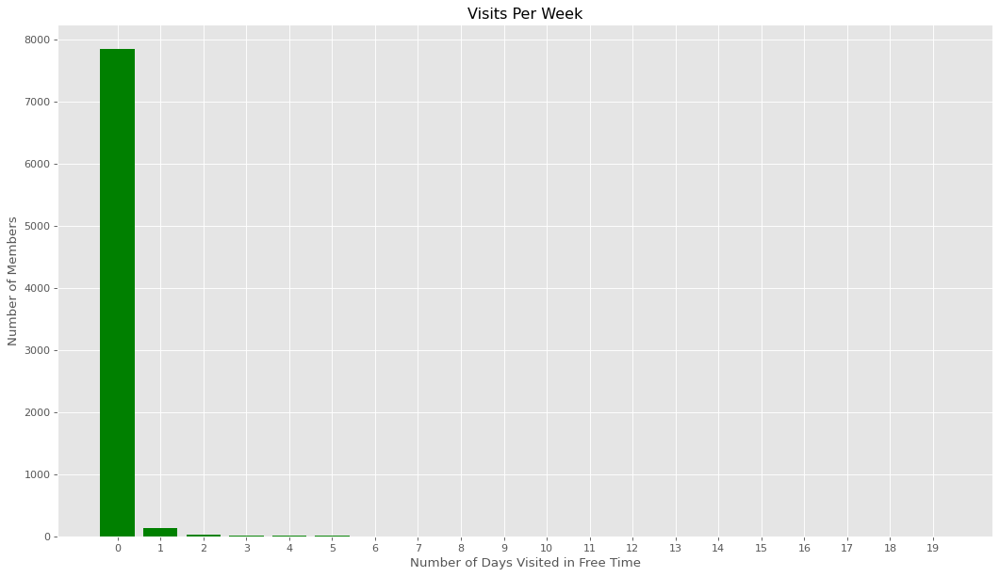

In [68]:
num_visits = [0] * 20
for d in data:
    visits = d['free time visits']
    num_visits[visits] += 1

len(num_visits)
# num_visits
x = list(range(0, len(num_visits)))
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Free Time")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()

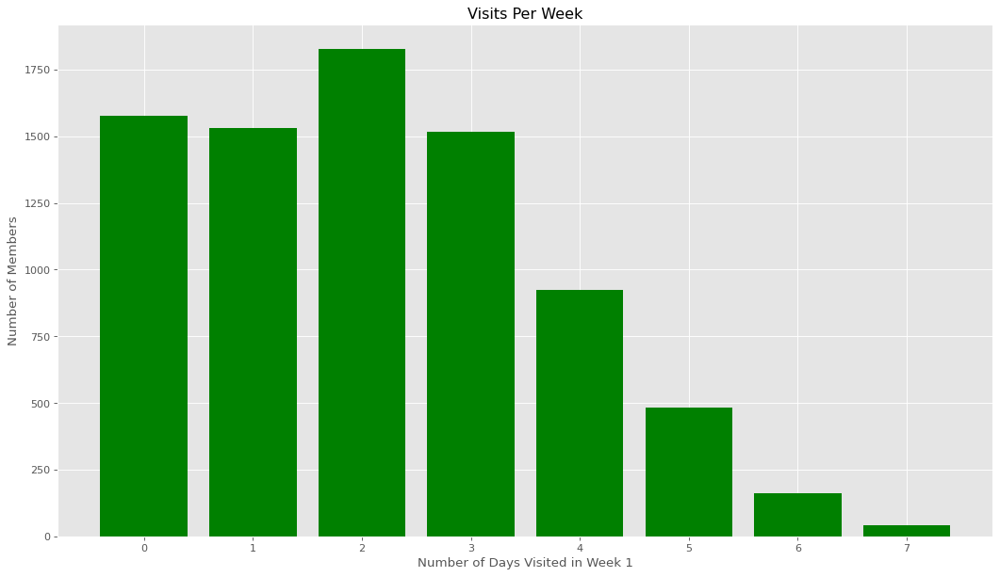

In [69]:
num_visits = [0] * 8
for d in data:
    visits = d['7 day visits']
    if visits > 7 or visits < 0:
        print(d)
    num_visits[visits] += 1

x = [0,1,2,3,4,5,6,7]
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Week 1")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()

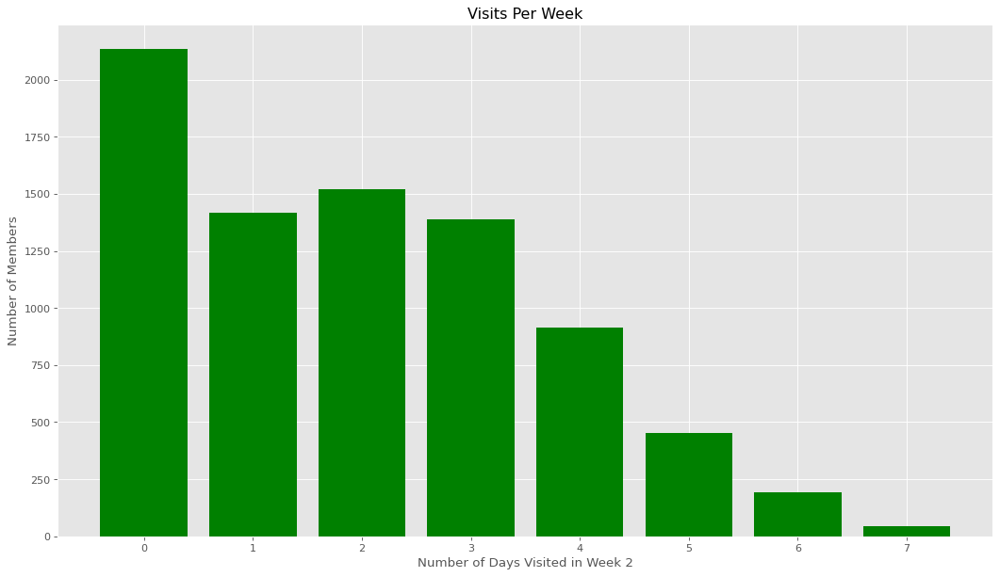

In [70]:
num_visits = [0] * 8
for d in data:
    visits = d['14 day visits'] - d['7 day visits']
    num_visits[visits] += 1

x = [0,1,2,3,4,5,6,7]
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Week 2")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()


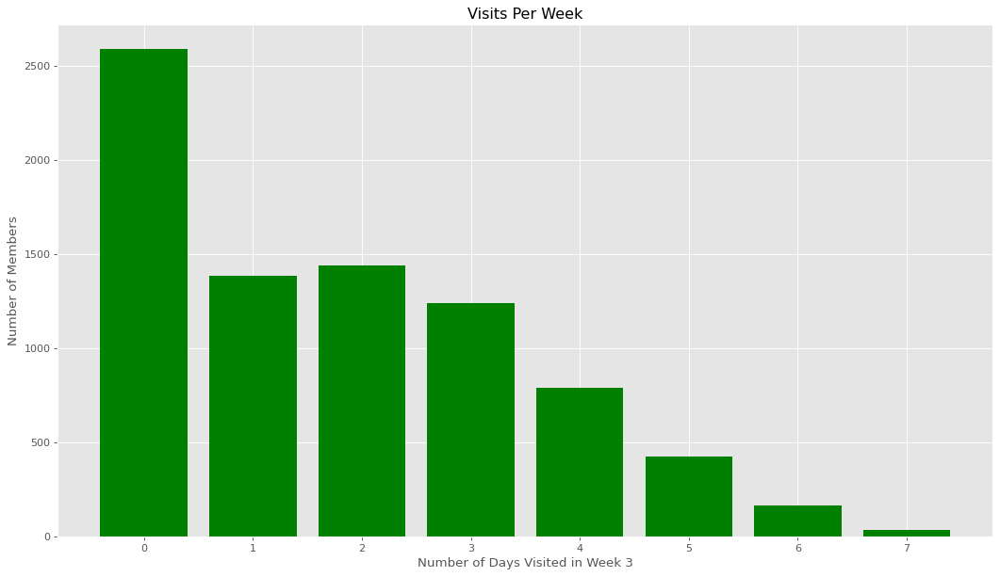

In [71]:
num_visits = [0] * 8
for d in data:
    visits = d['21 day visits'] - d['14 day visits']
    num_visits[visits] += 1

x = [0,1,2,3,4,5,6,7]
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Week 3")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()

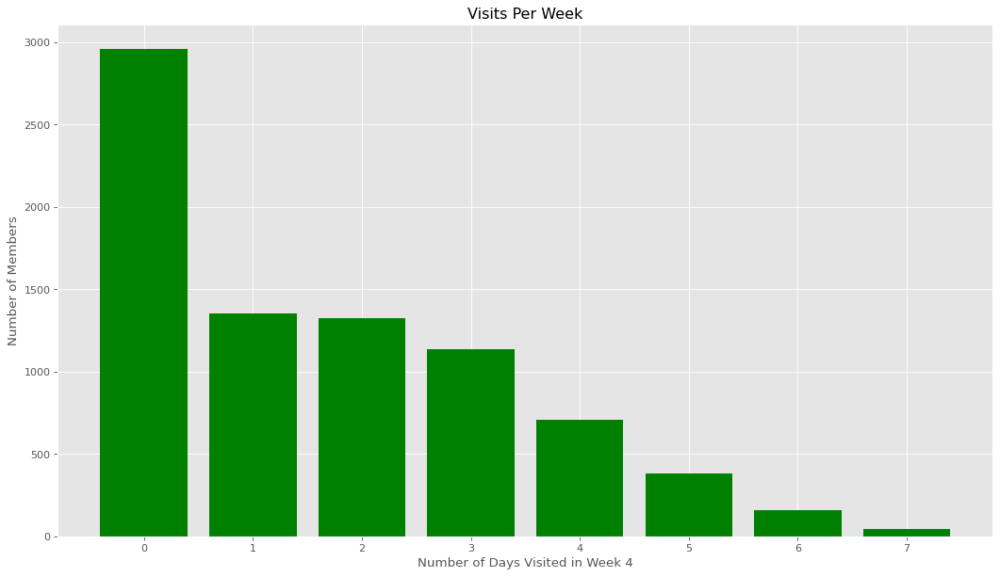

In [72]:
num_visits = [0] * 8
for d in data:
    visits = d['28 day visits'] - d['21 day visits']
    num_visits[visits] += 1

x = [0,1,2,3,4,5,6,7]
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Week 4")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()

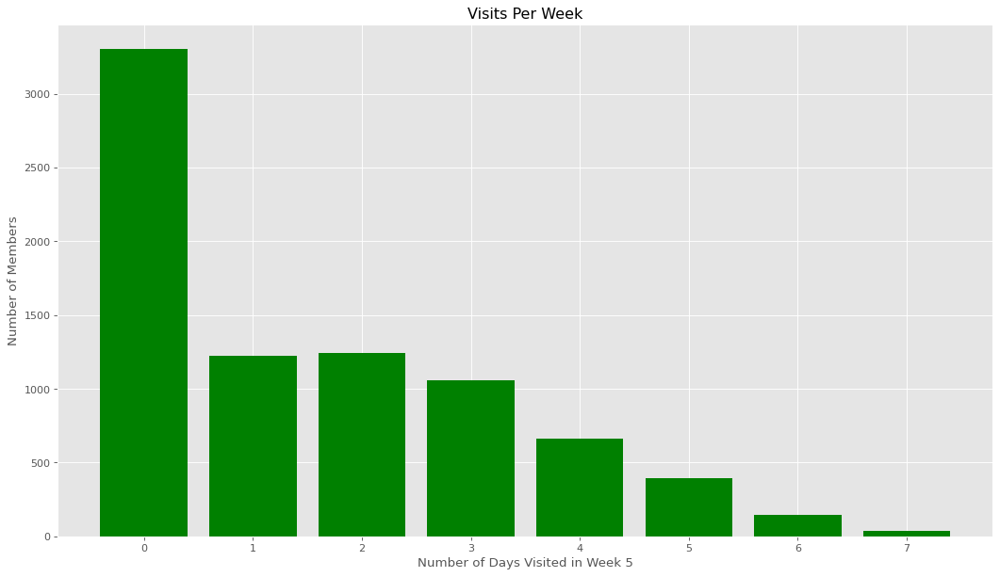

In [73]:
num_visits = [0] * 8
for d in data:
    visits = d['35 day visits'] - d['28 day visits']
    num_visits[visits] += 1

x = [0,1,2,3,4,5,6,7]
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Week 5")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()

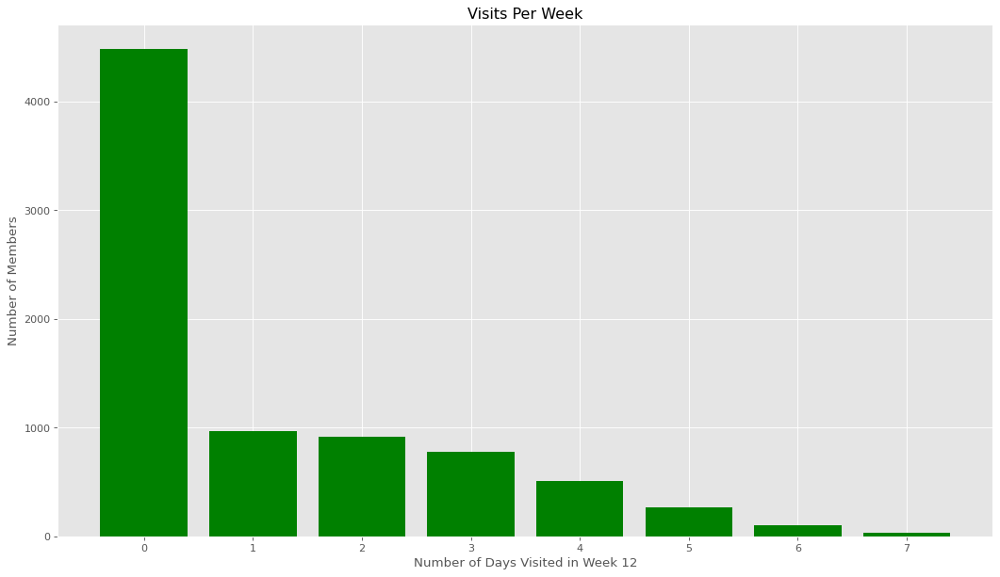

In [74]:
num_visits = [0] * 8
for d in data:
    visits = d['84 day visits'] - d['77 day visits']
    num_visits[visits] += 1

x = [0,1,2,3,4,5,6,7]
x_pos = [i for i, _ in enumerate(x)]

y = num_visits

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Number of Days Visited in Week 12")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.xticks(x_pos, x)

plt.show()

In [ ]:
data

In [ ]:
enrolments[enrolments['id'] == 16]['trainingStarterPack'].values[0]

In [7]:
visits_wk_1 = []
visits_wk_2 = []
visits_wk_3 = []
visits_wk_4 = []
visits_wk_5 = []
visits_wk_6 = []
visits_wk_7 = []
visits_wk_8 = []
visits_wk_9 = []
visits_wk_10 = []
visits_wk_11 = []
visits_wk_12 = []

play_pt_visits_wk_1 = []
play_pt_visits_wk_2 = []
play_pt_visits_wk_3 = []
play_pt_visits_wk_4 = []
play_pt_visits_wk_5 = []
play_pt_visits_wk_6 = []
play_pt_visits_wk_7 = []
play_pt_visits_wk_8 = []
play_pt_visits_wk_9 = []
play_pt_visits_wk_10 = []
play_pt_visits_wk_11 = []
play_pt_visits_wk_12 = []

gym_pt_visits_wk_1 = []
gym_pt_visits_wk_2 = []
gym_pt_visits_wk_3 = []
gym_pt_visits_wk_4 = []
gym_pt_visits_wk_5 = []
gym_pt_visits_wk_6 = []
gym_pt_visits_wk_7 = []
gym_pt_visits_wk_8 = []
gym_pt_visits_wk_9 = []
gym_pt_visits_wk_10 = []
gym_pt_visits_wk_11 = []
gym_pt_visits_wk_12 = []

gym_visits_wk_1 = []
gym_visits_wk_2 = []
gym_visits_wk_3 = []
gym_visits_wk_4 = []
gym_visits_wk_5 = []
gym_visits_wk_6 = []
gym_visits_wk_7 = []
gym_visits_wk_8 = []
gym_visits_wk_9 = []
gym_visits_wk_10 = []
gym_visits_wk_11 = []
gym_visits_wk_12 = []

play_visits_wk_1 = []
play_visits_wk_2 = []
play_visits_wk_3 = []
play_visits_wk_4 = []
play_visits_wk_5 = []
play_visits_wk_6 = []
play_visits_wk_7 = []
play_visits_wk_8 = []
play_visits_wk_9 = []
play_visits_wk_10 = []
play_visits_wk_11 = []
play_visits_wk_12 = []

male_visits_wk_1 = []
male_visits_wk_2 = []
male_visits_wk_3 = []
male_visits_wk_4 = []
male_visits_wk_5 = []
male_visits_wk_6 = []
male_visits_wk_7 = []
male_visits_wk_8 = []
male_visits_wk_9 = []
male_visits_wk_10 = []
male_visits_wk_11 = []
male_visits_wk_12 = []

female_visits_wk_1 = []
female_visits_wk_2 = []
female_visits_wk_3 = []
female_visits_wk_4 = []
female_visits_wk_5 = []
female_visits_wk_6 = []
female_visits_wk_7 = []
female_visits_wk_8 = []
female_visits_wk_9 = []
female_visits_wk_10 = []
female_visits_wk_11 = []
female_visits_wk_12 = []

# tenure_less_20
# tenure_20_25
# tenure_25_30
# tenure_30_35
# tenure_35_40
# tenure_40_45
# tenure_45_50
# tenure_greater_50

free_time_0_visits_wk_1 = []
free_time_0_visits_wk_2 = []
free_time_0_visits_wk_3 = []
free_time_0_visits_wk_4 = []
free_time_0_visits_wk_5 = []
free_time_0_visits_wk_6 = []
free_time_0_visits_wk_7 = []
free_time_0_visits_wk_8 = []
free_time_0_visits_wk_9 = []
free_time_0_visits_wk_10 = []
free_time_0_visits_wk_11 = []
free_time_0_visits_wk_12 = []

free_time_7_visits_wk_1 = []
free_time_7_visits_wk_2 = []
free_time_7_visits_wk_3 = []
free_time_7_visits_wk_4 = []
free_time_7_visits_wk_5 = []
free_time_7_visits_wk_6 = []
free_time_7_visits_wk_7 = []
free_time_7_visits_wk_8 = []
free_time_7_visits_wk_9 = []
free_time_7_visits_wk_10 = []
free_time_7_visits_wk_11 = []
free_time_7_visits_wk_12 = []

free_time_14_visits_wk_1 = []
free_time_14_visits_wk_2 = []
free_time_14_visits_wk_3 = []
free_time_14_visits_wk_4 = []
free_time_14_visits_wk_5 = []
free_time_14_visits_wk_6 = []
free_time_14_visits_wk_7 = []
free_time_14_visits_wk_8 = []
free_time_14_visits_wk_9 = []
free_time_14_visits_wk_10 = []
free_time_14_visits_wk_11 = []
free_time_14_visits_wk_12 = []

free_time_21_visits_wk_1 = []
free_time_21_visits_wk_2 = []
free_time_21_visits_wk_3 = []
free_time_21_visits_wk_4 = []
free_time_21_visits_wk_5 = []
free_time_21_visits_wk_6 = []
free_time_21_visits_wk_7 = []
free_time_21_visits_wk_8 = []
free_time_21_visits_wk_9 = []
free_time_21_visits_wk_10 = []
free_time_21_visits_wk_11 = []
free_time_21_visits_wk_12 = []

free_time_30_visits_wk_1 = []
free_time_30_visits_wk_2 = []
free_time_30_visits_wk_3 = []
free_time_30_visits_wk_4 = []
free_time_30_visits_wk_5 = []
free_time_30_visits_wk_6 = []
free_time_30_visits_wk_7 = []
free_time_30_visits_wk_8 = []
free_time_30_visits_wk_9 = []
free_time_30_visits_wk_10 = []
free_time_30_visits_wk_11 = []
free_time_30_visits_wk_12 = []

free_time_X_visits_wk_1 = []
free_time_X_visits_wk_2 = []
free_time_X_visits_wk_3 = []
free_time_X_visits_wk_4 = []
free_time_X_visits_wk_5 = []
free_time_X_visits_wk_6 = []
free_time_X_visits_wk_7 = []
free_time_X_visits_wk_8 = []
free_time_X_visits_wk_9 = []
free_time_X_visits_wk_10 = []
free_time_X_visits_wk_11 = []
free_time_X_visits_wk_12 = []

cancelled_visits_wk_1 = []
cancelled_visits_wk_2 = []
cancelled_visits_wk_3 = []
cancelled_visits_wk_4 = []
cancelled_visits_wk_5 = []
cancelled_visits_wk_6 = []
cancelled_visits_wk_7 = []
cancelled_visits_wk_8 = []
cancelled_visits_wk_9 = []
cancelled_visits_wk_10 = []
cancelled_visits_wk_11 = []
cancelled_visits_wk_12 = []

cancelled_play_pt_visits_wk_1 = []
cancelled_play_pt_visits_wk_2 = []
cancelled_play_pt_visits_wk_3 = []
cancelled_play_pt_visits_wk_4 = []
cancelled_play_pt_visits_wk_5 = []
cancelled_play_pt_visits_wk_6 = []
cancelled_play_pt_visits_wk_7 = []
cancelled_play_pt_visits_wk_8 = []
cancelled_play_pt_visits_wk_9 = []
cancelled_play_pt_visits_wk_10 = []
cancelled_play_pt_visits_wk_11 = []
cancelled_play_pt_visits_wk_12 = []

cancelled_gym_pt_visits_wk_1 = []
cancelled_gym_pt_visits_wk_2 = []
cancelled_gym_pt_visits_wk_3 = []
cancelled_gym_pt_visits_wk_4 = []
cancelled_gym_pt_visits_wk_5 = []
cancelled_gym_pt_visits_wk_6 = []
cancelled_gym_pt_visits_wk_7 = []
cancelled_gym_pt_visits_wk_8 = []
cancelled_gym_pt_visits_wk_9 = []
cancelled_gym_pt_visits_wk_10 = []
cancelled_gym_pt_visits_wk_11 = []
cancelled_gym_pt_visits_wk_12 = []

cancelled_gym_visits_wk_1 = []
cancelled_gym_visits_wk_2 = []
cancelled_gym_visits_wk_3 = []
cancelled_gym_visits_wk_4 = []
cancelled_gym_visits_wk_5 = []
cancelled_gym_visits_wk_6 = []
cancelled_gym_visits_wk_7 = []
cancelled_gym_visits_wk_8 = []
cancelled_gym_visits_wk_9 = []
cancelled_gym_visits_wk_10 = []
cancelled_gym_visits_wk_11 = []
cancelled_gym_visits_wk_12 = []

cancelled_play_visits_wk_1 = []
cancelled_play_visits_wk_2 = []
cancelled_play_visits_wk_3 = []
cancelled_play_visits_wk_4 = []
cancelled_play_visits_wk_5 = []
cancelled_play_visits_wk_6 = []
cancelled_play_visits_wk_7 = []
cancelled_play_visits_wk_8 = []
cancelled_play_visits_wk_9 = []
cancelled_play_visits_wk_10 = []
cancelled_play_visits_wk_11 = []
cancelled_play_visits_wk_12 = []

cancelled_male_visits_wk_1 = []
cancelled_male_visits_wk_2 = []
cancelled_male_visits_wk_3 = []
cancelled_male_visits_wk_4 = []
cancelled_male_visits_wk_5 = []
cancelled_male_visits_wk_6 = []
cancelled_male_visits_wk_7 = []
cancelled_male_visits_wk_8 = []
cancelled_male_visits_wk_9 = []
cancelled_male_visits_wk_10 = []
cancelled_male_visits_wk_11 = []
cancelled_male_visits_wk_12 = []

cancelled_female_visits_wk_1 = []
cancelled_female_visits_wk_2 = []
cancelled_female_visits_wk_3 = []
cancelled_female_visits_wk_4 = []
cancelled_female_visits_wk_5 = []
cancelled_female_visits_wk_6 = []
cancelled_female_visits_wk_7 = []
cancelled_female_visits_wk_8 = []
cancelled_female_visits_wk_9 = []
cancelled_female_visits_wk_10 = []
cancelled_female_visits_wk_11 = []
cancelled_female_visits_wk_12 = []

cancelled_free_time_0_visits_wk_1 = []
cancelled_free_time_0_visits_wk_2 = []
cancelled_free_time_0_visits_wk_3 = []
cancelled_free_time_0_visits_wk_4 = []
cancelled_free_time_0_visits_wk_5 = []
cancelled_free_time_0_visits_wk_6 = []
cancelled_free_time_0_visits_wk_7 = []
cancelled_free_time_0_visits_wk_8 = []
cancelled_free_time_0_visits_wk_9 = []
cancelled_free_time_0_visits_wk_10 = []
cancelled_free_time_0_visits_wk_11 = []
cancelled_free_time_0_visits_wk_12 = []

cancelled_free_time_7_visits_wk_1 = []
cancelled_free_time_7_visits_wk_2 = []
cancelled_free_time_7_visits_wk_3 = []
cancelled_free_time_7_visits_wk_4 = []
cancelled_free_time_7_visits_wk_5 = []
cancelled_free_time_7_visits_wk_6 = []
cancelled_free_time_7_visits_wk_7 = []
cancelled_free_time_7_visits_wk_8 = []
cancelled_free_time_7_visits_wk_9 = []
cancelled_free_time_7_visits_wk_10 = []
cancelled_free_time_7_visits_wk_11 = []
cancelled_free_time_7_visits_wk_12 = []

cancelled_free_time_14_visits_wk_1 = []
cancelled_free_time_14_visits_wk_2 = []
cancelled_free_time_14_visits_wk_3 = []
cancelled_free_time_14_visits_wk_4 = []
cancelled_free_time_14_visits_wk_5 = []
cancelled_free_time_14_visits_wk_6 = []
cancelled_free_time_14_visits_wk_7 = []
cancelled_free_time_14_visits_wk_8 = []
cancelled_free_time_14_visits_wk_9 = []
cancelled_free_time_14_visits_wk_10 = []
cancelled_free_time_14_visits_wk_11 = []
cancelled_free_time_14_visits_wk_12 = []

cancelled_free_time_21_visits_wk_1 = []
cancelled_free_time_21_visits_wk_2 = []
cancelled_free_time_21_visits_wk_3 = []
cancelled_free_time_21_visits_wk_4 = []
cancelled_free_time_21_visits_wk_5 = []
cancelled_free_time_21_visits_wk_6 = []
cancelled_free_time_21_visits_wk_7 = []
cancelled_free_time_21_visits_wk_8 = []
cancelled_free_time_21_visits_wk_9 = []
cancelled_free_time_21_visits_wk_10 = []
cancelled_free_time_21_visits_wk_11 = []
cancelled_free_time_21_visits_wk_12 = []

cancelled_free_time_30_visits_wk_1 = []
cancelled_free_time_30_visits_wk_2 = []
cancelled_free_time_30_visits_wk_3 = []
cancelled_free_time_30_visits_wk_4 = []
cancelled_free_time_30_visits_wk_5 = []
cancelled_free_time_30_visits_wk_6 = []
cancelled_free_time_30_visits_wk_7 = []
cancelled_free_time_30_visits_wk_8 = []
cancelled_free_time_30_visits_wk_9 = []
cancelled_free_time_30_visits_wk_10 = []
cancelled_free_time_30_visits_wk_11 = []
cancelled_free_time_30_visits_wk_12 = []

cancelled_free_time_X_visits_wk_1 = []
cancelled_free_time_X_visits_wk_2 = []
cancelled_free_time_X_visits_wk_3 = []
cancelled_free_time_X_visits_wk_4 = []
cancelled_free_time_X_visits_wk_5 = []
cancelled_free_time_X_visits_wk_6 = []
cancelled_free_time_X_visits_wk_7 = []
cancelled_free_time_X_visits_wk_8 = []
cancelled_free_time_X_visits_wk_9 = []
cancelled_free_time_X_visits_wk_10 = []
cancelled_free_time_X_visits_wk_11 = []
cancelled_free_time_X_visits_wk_12 = []


active_visits_wk_1 = []
active_visits_wk_2 = []
active_visits_wk_3 = []
active_visits_wk_4 = []
active_visits_wk_5 = []
active_visits_wk_6 = []
active_visits_wk_7 = []
active_visits_wk_8 = []
active_visits_wk_9 = []
active_visits_wk_10 = []
active_visits_wk_11 = []
active_visits_wk_12 = []

active_play_pt_visits_wk_1 = []
active_play_pt_visits_wk_2 = []
active_play_pt_visits_wk_3 = []
active_play_pt_visits_wk_4 = []
active_play_pt_visits_wk_5 = []
active_play_pt_visits_wk_6 = []
active_play_pt_visits_wk_7 = []
active_play_pt_visits_wk_8 = []
active_play_pt_visits_wk_9 = []
active_play_pt_visits_wk_10 = []
active_play_pt_visits_wk_11 = []
active_play_pt_visits_wk_12 = []

active_gym_pt_visits_wk_1 = []
active_gym_pt_visits_wk_2 = []
active_gym_pt_visits_wk_3 = []
active_gym_pt_visits_wk_4 = []
active_gym_pt_visits_wk_5 = []
active_gym_pt_visits_wk_6 = []
active_gym_pt_visits_wk_7 = []
active_gym_pt_visits_wk_8 = []
active_gym_pt_visits_wk_9 = []
active_gym_pt_visits_wk_10 = []
active_gym_pt_visits_wk_11 = []
active_gym_pt_visits_wk_12 = []

active_gym_visits_wk_1 = []
active_gym_visits_wk_2 = []
active_gym_visits_wk_3 = []
active_gym_visits_wk_4 = []
active_gym_visits_wk_5 = []
active_gym_visits_wk_6 = []
active_gym_visits_wk_7 = []
active_gym_visits_wk_8 = []
active_gym_visits_wk_9 = []
active_gym_visits_wk_10 = []
active_gym_visits_wk_11 = []
active_gym_visits_wk_12 = []

active_play_visits_wk_1 = []
active_play_visits_wk_2 = []
active_play_visits_wk_3 = []
active_play_visits_wk_4 = []
active_play_visits_wk_5 = []
active_play_visits_wk_6 = []
active_play_visits_wk_7 = []
active_play_visits_wk_8 = []
active_play_visits_wk_9 = []
active_play_visits_wk_10 = []
active_play_visits_wk_11 = []
active_play_visits_wk_12 = []

active_male_visits_wk_1 = []
active_male_visits_wk_2 = []
active_male_visits_wk_3 = []
active_male_visits_wk_4 = []
active_male_visits_wk_5 = []
active_male_visits_wk_6 = []
active_male_visits_wk_7 = []
active_male_visits_wk_8 = []
active_male_visits_wk_9 = []
active_male_visits_wk_10 = []
active_male_visits_wk_11 = []
active_male_visits_wk_12 = []

active_female_visits_wk_1 = []
active_female_visits_wk_2 = []
active_female_visits_wk_3 = []
active_female_visits_wk_4 = []
active_female_visits_wk_5 = []
active_female_visits_wk_6 = []
active_female_visits_wk_7 = []
active_female_visits_wk_8 = []
active_female_visits_wk_9 = []
active_female_visits_wk_10 = []
active_female_visits_wk_11 = []
active_female_visits_wk_12 = []

active_free_time_0_visits_wk_1 = []
active_free_time_0_visits_wk_2 = []
active_free_time_0_visits_wk_3 = []
active_free_time_0_visits_wk_4 = []
active_free_time_0_visits_wk_5 = []
active_free_time_0_visits_wk_6 = []
active_free_time_0_visits_wk_7 = []
active_free_time_0_visits_wk_8 = []
active_free_time_0_visits_wk_9 = []
active_free_time_0_visits_wk_10 = []
active_free_time_0_visits_wk_11 = []
active_free_time_0_visits_wk_12 = []

active_free_time_7_visits_wk_1 = []
active_free_time_7_visits_wk_2 = []
active_free_time_7_visits_wk_3 = []
active_free_time_7_visits_wk_4 = []
active_free_time_7_visits_wk_5 = []
active_free_time_7_visits_wk_6 = []
active_free_time_7_visits_wk_7 = []
active_free_time_7_visits_wk_8 = []
active_free_time_7_visits_wk_9 = []
active_free_time_7_visits_wk_10 = []
active_free_time_7_visits_wk_11 = []
active_free_time_7_visits_wk_12 = []

active_free_time_14_visits_wk_1 = []
active_free_time_14_visits_wk_2 = []
active_free_time_14_visits_wk_3 = []
active_free_time_14_visits_wk_4 = []
active_free_time_14_visits_wk_5 = []
active_free_time_14_visits_wk_6 = []
active_free_time_14_visits_wk_7 = []
active_free_time_14_visits_wk_8 = []
active_free_time_14_visits_wk_9 = []
active_free_time_14_visits_wk_10 = []
active_free_time_14_visits_wk_11 = []
active_free_time_14_visits_wk_12 = []

active_free_time_21_visits_wk_1 = []
active_free_time_21_visits_wk_2 = []
active_free_time_21_visits_wk_3 = []
active_free_time_21_visits_wk_4 = []
active_free_time_21_visits_wk_5 = []
active_free_time_21_visits_wk_6 = []
active_free_time_21_visits_wk_7 = []
active_free_time_21_visits_wk_8 = []
active_free_time_21_visits_wk_9 = []
active_free_time_21_visits_wk_10 = []
active_free_time_21_visits_wk_11 = []
active_free_time_21_visits_wk_12 = []

active_free_time_30_visits_wk_1 = []
active_free_time_30_visits_wk_2 = []
active_free_time_30_visits_wk_3 = []
active_free_time_30_visits_wk_4 = []
active_free_time_30_visits_wk_5 = []
active_free_time_30_visits_wk_6 = []
active_free_time_30_visits_wk_7 = []
active_free_time_30_visits_wk_8 = []
active_free_time_30_visits_wk_9 = []
active_free_time_30_visits_wk_10 = []
active_free_time_30_visits_wk_11 = []
active_free_time_30_visits_wk_12 = []

active_free_time_X_visits_wk_1 = []
active_free_time_X_visits_wk_2 = []
active_free_time_X_visits_wk_3 = []
active_free_time_X_visits_wk_4 = []
active_free_time_X_visits_wk_5 = []
active_free_time_X_visits_wk_6 = []
active_free_time_X_visits_wk_7 = []
active_free_time_X_visits_wk_8 = []
active_free_time_X_visits_wk_9 = []
active_free_time_X_visits_wk_10 = []
active_free_time_X_visits_wk_11 = []
active_free_time_X_visits_wk_12 = []

for d in data:
    
    visits_wk_1.append(d['7 day visits'])
    visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
    visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
    visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
    visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
    visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
    visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
    visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
    visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
    visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
    visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
    visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
    if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
        play_pt_visits_wk_1.append(d['7 day visits'])
        play_pt_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        play_pt_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        play_pt_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        play_pt_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        play_pt_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        play_pt_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        play_pt_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        play_pt_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        play_pt_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        play_pt_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        play_pt_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])    
    
    if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
        gym_pt_visits_wk_1.append(d['7 day visits'])
        gym_pt_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        gym_pt_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        gym_pt_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        gym_pt_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        gym_pt_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        gym_pt_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        gym_pt_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        gym_pt_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        gym_pt_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        gym_pt_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        gym_pt_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
    if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
        play_visits_wk_1.append(d['7 day visits'])
        play_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        play_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        play_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        play_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        play_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        play_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        play_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        play_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        play_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        play_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        play_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])    
    
    if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
        gym_visits_wk_1.append(d['7 day visits'])
        gym_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        gym_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        gym_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        gym_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        gym_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        gym_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        gym_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        gym_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        gym_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        gym_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        gym_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
        
    if d['gender'] == 'male':
        male_visits_wk_1.append(d['7 day visits'])
        male_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        male_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        male_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        male_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        male_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        male_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        male_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        male_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        male_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        male_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        male_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
        
    if d['gender'] == 'female':
        female_visits_wk_1.append(d['7 day visits'])
        female_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        female_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        female_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        female_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        female_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        female_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        female_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        female_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        female_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        female_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        female_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
        
# ['7DaysFree', '14DaysFree', '', '30DaysFree', 'XDaysFree', '21DaysFree']

    if d['daysFree'] == '':
        free_time_0_visits_wk_1.append(d['7 day visits'])
        free_time_0_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        free_time_0_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        free_time_0_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        free_time_0_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        free_time_0_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        free_time_0_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        free_time_0_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        free_time_0_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        free_time_0_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        free_time_0_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        free_time_0_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

    if d['daysFree'] == '7DaysFree':
        free_time_7_visits_wk_1.append(d['7 day visits'])
        free_time_7_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        free_time_7_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        free_time_7_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        free_time_7_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        free_time_7_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        free_time_7_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        free_time_7_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        free_time_7_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        free_time_7_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        free_time_7_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        free_time_7_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

    if d['daysFree'] == '14DaysFree':
        free_time_14_visits_wk_1.append(d['7 day visits'])
        free_time_14_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        free_time_14_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        free_time_14_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        free_time_14_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        free_time_14_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        free_time_14_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        free_time_14_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        free_time_14_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        free_time_14_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        free_time_14_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        free_time_14_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

    if d['daysFree'] == '21DaysFree':
        free_time_21_visits_wk_1.append(d['7 day visits'])
        free_time_21_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        free_time_21_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        free_time_21_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        free_time_21_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        free_time_21_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        free_time_21_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        free_time_21_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        free_time_21_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        free_time_21_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        free_time_21_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        free_time_21_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

    if d['daysFree'] == '30DaysFree':
        free_time_30_visits_wk_1.append(d['7 day visits'])
        free_time_30_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        free_time_30_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        free_time_30_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        free_time_30_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        free_time_30_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        free_time_30_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        free_time_30_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        free_time_30_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        free_time_30_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        free_time_30_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        free_time_30_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

    if d['daysFree'] == 'XDaysFree':
        free_time_X_visits_wk_1.append(d['7 day visits'])
        free_time_X_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        free_time_X_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        free_time_X_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        free_time_X_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        free_time_X_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        free_time_X_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        free_time_X_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        free_time_X_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        free_time_X_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        free_time_X_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        free_time_X_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
        
    if d['isActive'] == False:
        cancelled_visits_wk_1.append(d['7 day visits'])
        cancelled_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        cancelled_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        cancelled_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        cancelled_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        cancelled_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        cancelled_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        cancelled_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        cancelled_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        cancelled_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        cancelled_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        cancelled_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            cancelled_play_pt_visits_wk_1.append(d['7 day visits'])
            cancelled_play_pt_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_play_pt_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_play_pt_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_play_pt_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_play_pt_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_play_pt_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_play_pt_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_play_pt_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_play_pt_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_play_pt_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_play_pt_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])    

        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            cancelled_gym_pt_visits_wk_1.append(d['7 day visits'])
            cancelled_gym_pt_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_gym_pt_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_gym_pt_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_gym_pt_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_gym_pt_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_gym_pt_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_gym_pt_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_gym_pt_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_gym_pt_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_gym_pt_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_gym_pt_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            cancelled_play_visits_wk_1.append(d['7 day visits'])
            cancelled_play_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_play_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_play_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_play_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_play_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_play_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_play_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_play_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_play_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_play_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_play_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])    

        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            cancelled_gym_visits_wk_1.append(d['7 day visits'])
            cancelled_gym_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_gym_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_gym_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_gym_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_gym_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_gym_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_gym_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_gym_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_gym_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_gym_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_gym_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
        if d['gender'] == 'male':
            cancelled_male_visits_wk_1.append(d['7 day visits'])
            cancelled_male_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_male_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_male_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_male_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_male_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_male_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_male_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_male_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_male_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_male_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_male_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['gender'] == 'female':
            cancelled_female_visits_wk_1.append(d['7 day visits'])
            cancelled_female_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_female_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_female_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_female_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_female_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_female_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_female_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_female_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_female_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_female_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_female_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
        if d['daysFree'] == '':
            cancelled_free_time_0_visits_wk_1.append(d['7 day visits'])
            cancelled_free_time_0_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_free_time_0_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_free_time_0_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_free_time_0_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_free_time_0_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_free_time_0_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_free_time_0_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_free_time_0_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_free_time_0_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_free_time_0_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_free_time_0_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '7DaysFree':
            cancelled_free_time_7_visits_wk_1.append(d['7 day visits'])
            cancelled_free_time_7_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_free_time_7_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_free_time_7_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_free_time_7_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_free_time_7_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_free_time_7_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_free_time_7_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_free_time_7_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_free_time_7_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_free_time_7_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_free_time_7_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '14DaysFree':
            cancelled_free_time_14_visits_wk_1.append(d['7 day visits'])
            cancelled_free_time_14_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_free_time_14_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_free_time_14_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_free_time_14_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_free_time_14_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_free_time_14_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_free_time_14_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_free_time_14_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_free_time_14_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_free_time_14_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_free_time_14_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '21DaysFree':
            cancelled_free_time_21_visits_wk_1.append(d['7 day visits'])
            cancelled_free_time_21_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_free_time_21_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_free_time_21_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_free_time_21_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_free_time_21_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_free_time_21_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_free_time_21_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_free_time_21_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_free_time_21_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_free_time_21_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_free_time_21_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '30DaysFree':
            cancelled_free_time_30_visits_wk_1.append(d['7 day visits'])
            cancelled_free_time_30_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_free_time_30_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_free_time_30_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_free_time_30_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_free_time_30_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_free_time_30_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_free_time_30_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_free_time_30_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_free_time_30_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_free_time_30_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_free_time_30_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == 'XDaysFree':
            cancelled_free_time_X_visits_wk_1.append(d['7 day visits'])
            cancelled_free_time_X_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            cancelled_free_time_X_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            cancelled_free_time_X_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            cancelled_free_time_X_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            cancelled_free_time_X_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            cancelled_free_time_X_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            cancelled_free_time_X_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            cancelled_free_time_X_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            cancelled_free_time_X_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            cancelled_free_time_X_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            cancelled_free_time_X_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
    if d['isActive'] == True:
        active_visits_wk_1.append(d['7 day visits'])
        active_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
        active_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
        active_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
        active_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
        active_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
        active_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
        active_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
        active_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
        active_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
        active_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
        active_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            active_play_pt_visits_wk_1.append(d['7 day visits'])
            active_play_pt_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_play_pt_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_play_pt_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_play_pt_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_play_pt_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_play_pt_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_play_pt_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_play_pt_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_play_pt_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_play_pt_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_play_pt_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])    

        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            active_gym_pt_visits_wk_1.append(d['7 day visits'])
            active_gym_pt_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_gym_pt_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_gym_pt_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_gym_pt_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_gym_pt_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_gym_pt_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_gym_pt_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_gym_pt_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_gym_pt_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_gym_pt_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_gym_pt_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            active_play_visits_wk_1.append(d['7 day visits'])
            active_play_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_play_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_play_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_play_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_play_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_play_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_play_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_play_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_play_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_play_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_play_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])    

        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            active_gym_visits_wk_1.append(d['7 day visits'])
            active_gym_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_gym_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_gym_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_gym_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_gym_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_gym_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_gym_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_gym_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_gym_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_gym_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_gym_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
        if d['gender'] == 'male':
            active_male_visits_wk_1.append(d['7 day visits'])
            active_male_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_male_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_male_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_male_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_male_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_male_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_male_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_male_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_male_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_male_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_male_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['gender'] == 'female':
            active_female_visits_wk_1.append(d['7 day visits'])
            active_female_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_female_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_female_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_female_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_female_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_female_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_female_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_female_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_female_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_female_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_female_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
        if d['daysFree'] == '':
            active_free_time_0_visits_wk_1.append(d['7 day visits'])
            active_free_time_0_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_free_time_0_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_free_time_0_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_free_time_0_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_free_time_0_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_free_time_0_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_free_time_0_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_free_time_0_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_free_time_0_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_free_time_0_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_free_time_0_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '7DaysFree':
            active_free_time_7_visits_wk_1.append(d['7 day visits'])
            active_free_time_7_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_free_time_7_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_free_time_7_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_free_time_7_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_free_time_7_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_free_time_7_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_free_time_7_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_free_time_7_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_free_time_7_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_free_time_7_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_free_time_7_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '14DaysFree':
            active_free_time_14_visits_wk_1.append(d['7 day visits'])
            active_free_time_14_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_free_time_14_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_free_time_14_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_free_time_14_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_free_time_14_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_free_time_14_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_free_time_14_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_free_time_14_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_free_time_14_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_free_time_14_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_free_time_14_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '21DaysFree':
            active_free_time_21_visits_wk_1.append(d['7 day visits'])
            active_free_time_21_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_free_time_21_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_free_time_21_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_free_time_21_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_free_time_21_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_free_time_21_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_free_time_21_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_free_time_21_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_free_time_21_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_free_time_21_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_free_time_21_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == '30DaysFree':
            active_free_time_30_visits_wk_1.append(d['7 day visits'])
            active_free_time_30_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_free_time_30_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_free_time_30_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_free_time_30_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_free_time_30_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_free_time_30_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_free_time_30_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_free_time_30_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_free_time_30_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_free_time_30_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_free_time_30_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])

        if d['daysFree'] == 'XDaysFree':
            active_free_time_X_visits_wk_1.append(d['7 day visits'])
            active_free_time_X_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
            active_free_time_X_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
            active_free_time_X_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
            active_free_time_X_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
            active_free_time_X_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
            active_free_time_X_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
            active_free_time_X_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
            active_free_time_X_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
            active_free_time_X_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
            active_free_time_X_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
            active_free_time_X_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    

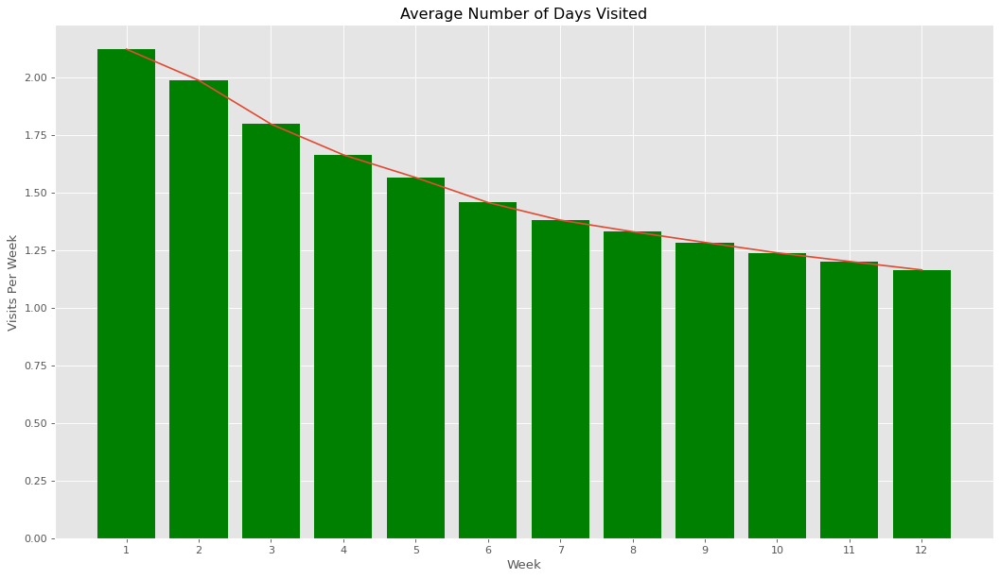

In [82]:


y = []
y.append(mean(visits_wk_1))
y.append(mean(visits_wk_2))
y.append(mean(visits_wk_3))
y.append(mean(visits_wk_4))
y.append(mean(visits_wk_5))
y.append(mean(visits_wk_6))
y.append(mean(visits_wk_7))
y.append(mean(visits_wk_8))
y.append(mean(visits_wk_9))
y.append(mean(visits_wk_10))
y.append(mean(visits_wk_11))
y.append(mean(visits_wk_12))

y_play_pt = []
y_play_pt.append(mean(play_pt_visits_wk_1))
y_play_pt.append(mean(play_pt_visits_wk_2))
y_play_pt.append(mean(play_pt_visits_wk_3))
y_play_pt.append(mean(play_pt_visits_wk_4))
y_play_pt.append(mean(play_pt_visits_wk_5))
y_play_pt.append(mean(play_pt_visits_wk_6))
y_play_pt.append(mean(play_pt_visits_wk_7))
y_play_pt.append(mean(play_pt_visits_wk_8))
y_play_pt.append(mean(play_pt_visits_wk_9))
y_play_pt.append(mean(play_pt_visits_wk_10))
y_play_pt.append(mean(play_pt_visits_wk_11))
y_play_pt.append(mean(play_pt_visits_wk_12))

y_gym_pt = []
y_gym_pt.append(mean(gym_pt_visits_wk_1))
y_gym_pt.append(mean(gym_pt_visits_wk_2))
y_gym_pt.append(mean(gym_pt_visits_wk_3))
y_gym_pt.append(mean(gym_pt_visits_wk_4))
y_gym_pt.append(mean(gym_pt_visits_wk_5))
y_gym_pt.append(mean(gym_pt_visits_wk_6))
y_gym_pt.append(mean(gym_pt_visits_wk_7))
y_gym_pt.append(mean(gym_pt_visits_wk_8))
y_gym_pt.append(mean(gym_pt_visits_wk_9))
y_gym_pt.append(mean(gym_pt_visits_wk_10))
y_gym_pt.append(mean(gym_pt_visits_wk_11))
y_gym_pt.append(mean(gym_pt_visits_wk_12))

y_play = []
y_play.append(mean(play_visits_wk_1))
y_play.append(mean(play_visits_wk_2))
y_play.append(mean(play_visits_wk_3))
y_play.append(mean(play_visits_wk_4))
y_play.append(mean(play_visits_wk_5))
y_play.append(mean(play_visits_wk_6))
y_play.append(mean(play_visits_wk_7))
y_play.append(mean(play_visits_wk_8))
y_play.append(mean(play_visits_wk_9))
y_play.append(mean(play_visits_wk_10))
y_play.append(mean(play_visits_wk_11))
y_play.append(mean(play_visits_wk_12))

y_gym = []
y_gym.append(mean(gym_visits_wk_1))
y_gym.append(mean(gym_visits_wk_2))
y_gym.append(mean(gym_visits_wk_3))
y_gym.append(mean(gym_visits_wk_4))
y_gym.append(mean(gym_visits_wk_5))
y_gym.append(mean(gym_visits_wk_6))
y_gym.append(mean(gym_visits_wk_7))
y_gym.append(mean(gym_visits_wk_8))
y_gym.append(mean(gym_visits_wk_9))
y_gym.append(mean(gym_visits_wk_10))
y_gym.append(mean(gym_visits_wk_11))
y_gym.append(mean(gym_visits_wk_12))

x = [1,2,3,4,5,6,7,8,9,10,11,12]
x_pos = [i for i, _ in enumerate(x)]

figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Week")
plt.ylabel("Visits Per Week")
plt.title("Average Number of Days Visited")

plt.xticks(x_pos, x)


x_new = x_pos
a_BSpline = scipy.interpolate.make_interp_spline(x_pos, y)
y_new = a_BSpline(x_new)

plt.plot(x_new, y_new)

plt.show()

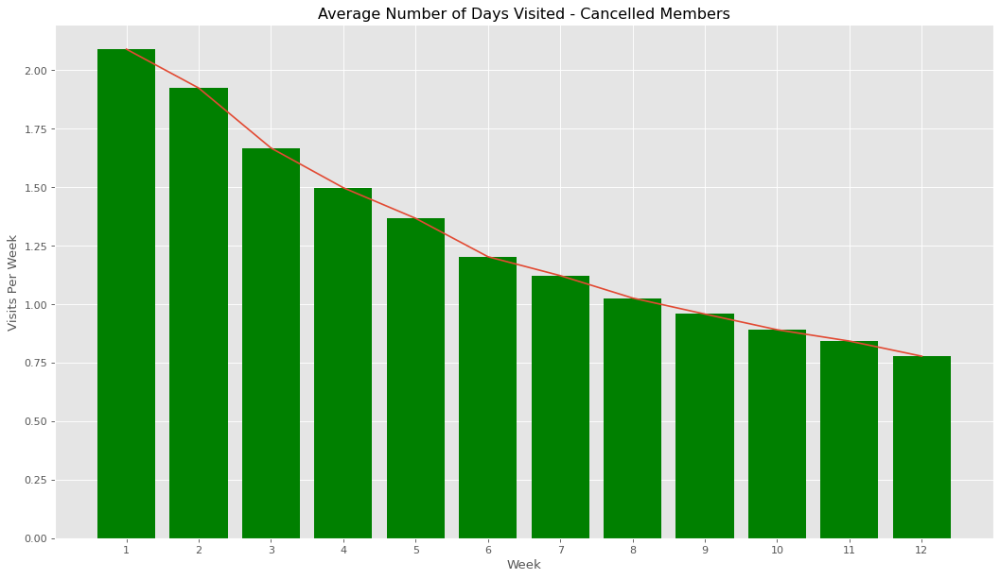

In [83]:


y = []
y.append(mean(cancelled_visits_wk_1))
y.append(mean(cancelled_visits_wk_2))
y.append(mean(cancelled_visits_wk_3))
y.append(mean(cancelled_visits_wk_4))
y.append(mean(cancelled_visits_wk_5))
y.append(mean(cancelled_visits_wk_6))
y.append(mean(cancelled_visits_wk_7))
y.append(mean(cancelled_visits_wk_8))
y.append(mean(cancelled_visits_wk_9))
y.append(mean(cancelled_visits_wk_10))
y.append(mean(cancelled_visits_wk_11))
y.append(mean(cancelled_visits_wk_12))

y_play_pt = []
y_play_pt.append(mean(cancelled_play_pt_visits_wk_1))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_2))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_3))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_4))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_5))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_6))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_7))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_8))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_9))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_10))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_11))
y_play_pt.append(mean(cancelled_play_pt_visits_wk_12))

y_gym_pt = []
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_1))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_2))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_3))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_4))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_5))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_6))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_7))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_8))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_9))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_10))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_11))
y_gym_pt.append(mean(cancelled_gym_pt_visits_wk_12))

y_play = []
y_play.append(mean(cancelled_play_visits_wk_1))
y_play.append(mean(cancelled_play_visits_wk_2))
y_play.append(mean(cancelled_play_visits_wk_3))
y_play.append(mean(cancelled_play_visits_wk_4))
y_play.append(mean(cancelled_play_visits_wk_5))
y_play.append(mean(cancelled_play_visits_wk_6))
y_play.append(mean(cancelled_play_visits_wk_7))
y_play.append(mean(cancelled_play_visits_wk_8))
y_play.append(mean(cancelled_play_visits_wk_9))
y_play.append(mean(cancelled_play_visits_wk_10))
y_play.append(mean(cancelled_play_visits_wk_11))
y_play.append(mean(cancelled_play_visits_wk_12))

y_gym = []
y_gym.append(mean(cancelled_gym_visits_wk_1))
y_gym.append(mean(cancelled_gym_visits_wk_2))
y_gym.append(mean(cancelled_gym_visits_wk_3))
y_gym.append(mean(cancelled_gym_visits_wk_4))
y_gym.append(mean(cancelled_gym_visits_wk_5))
y_gym.append(mean(cancelled_gym_visits_wk_6))
y_gym.append(mean(cancelled_gym_visits_wk_7))
y_gym.append(mean(cancelled_gym_visits_wk_8))
y_gym.append(mean(cancelled_gym_visits_wk_9))
y_gym.append(mean(cancelled_gym_visits_wk_10))
y_gym.append(mean(cancelled_gym_visits_wk_11))
y_gym.append(mean(cancelled_gym_visits_wk_12))

x = [1,2,3,4,5,6,7,8,9,10,11,12]
x_pos = [i for i, _ in enumerate(x)]


figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Week")
plt.ylabel("Visits Per Week")
plt.title("Average Number of Days Visited - Cancelled Members")

plt.xticks(x_pos, x)

x_new = x_pos
a_BSpline = scipy.interpolate.make_interp_spline(x_pos, y)
y_new = a_BSpline(x_new)

plt.plot(x_new, y_new)

plt.show()

<AxesSubplot:title={'center':'Average Weekly Visits by Week'}, xlabel='Week', ylabel='Average Visits'>

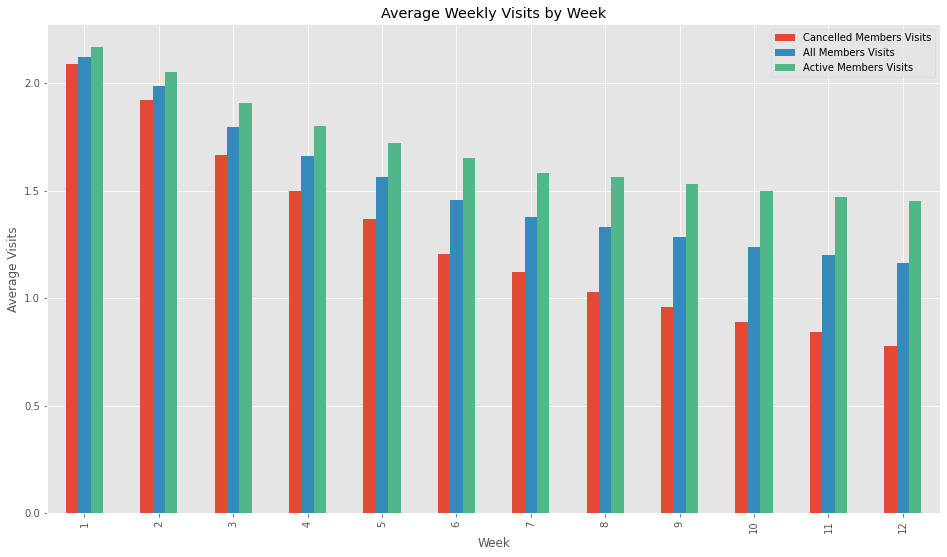

In [19]:

GRAPH_DATA = pd.DataFrame({
   'Week' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'All Members Visits': [mean(visits_wk_1),mean(visits_wk_2),mean(visits_wk_3),mean(visits_wk_4),mean(visits_wk_5),mean(visits_wk_6),mean(visits_wk_7),mean(visits_wk_8),mean(visits_wk_9),mean(visits_wk_10),mean(visits_wk_11),mean(visits_wk_12)],
    'Active Members Visits': [mean(active_visits_wk_1),mean(active_visits_wk_2),mean(active_visits_wk_3),mean(active_visits_wk_4),mean(active_visits_wk_5),mean(active_visits_wk_6),mean(active_visits_wk_7),mean(active_visits_wk_8),mean(active_visits_wk_9),mean(active_visits_wk_10),mean(active_visits_wk_11),mean(active_visits_wk_12)],
    'Cancelled Members Visits': [mean(cancelled_visits_wk_1),mean(cancelled_visits_wk_2),mean(cancelled_visits_wk_3),mean(cancelled_visits_wk_4),mean(cancelled_visits_wk_5),mean(cancelled_visits_wk_6),mean(cancelled_visits_wk_7),mean(cancelled_visits_wk_8),mean(cancelled_visits_wk_9),mean(cancelled_visits_wk_10),mean(cancelled_visits_wk_11),mean(cancelled_visits_wk_12)]
})

GRAPH_DATA

colors = ['#e24a33','#348bba','#52B788']

GRAPH_DATA.plot(x="Week", y=["Cancelled Members Visits","All Members Visits","Active Members Visits"], kind="bar", figsize=(16,9), title='Average Weekly Visits by Week', ylabel='Average Visits',color=colors)


<AxesSubplot:title={'center':'Average Weekly Visits by Membership Type (All)'}, xlabel='Week', ylabel='Visits'>

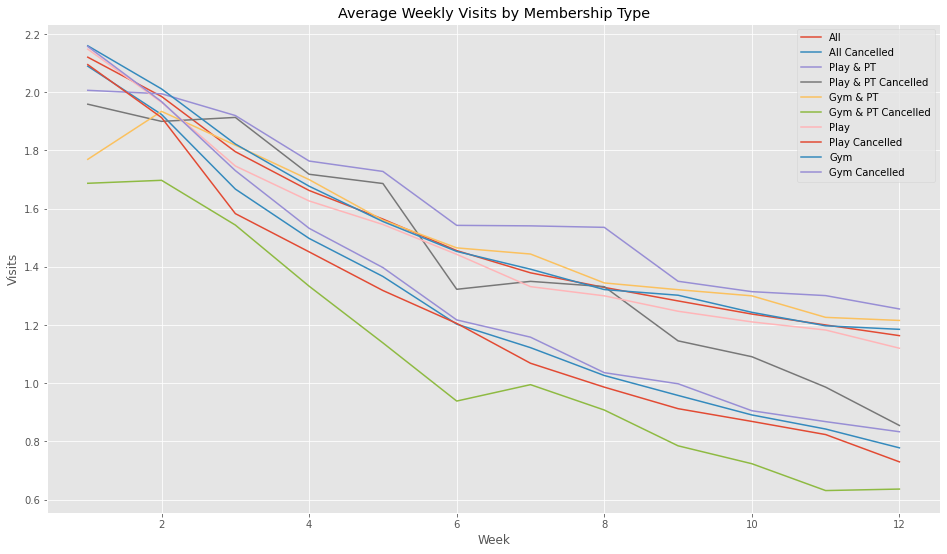

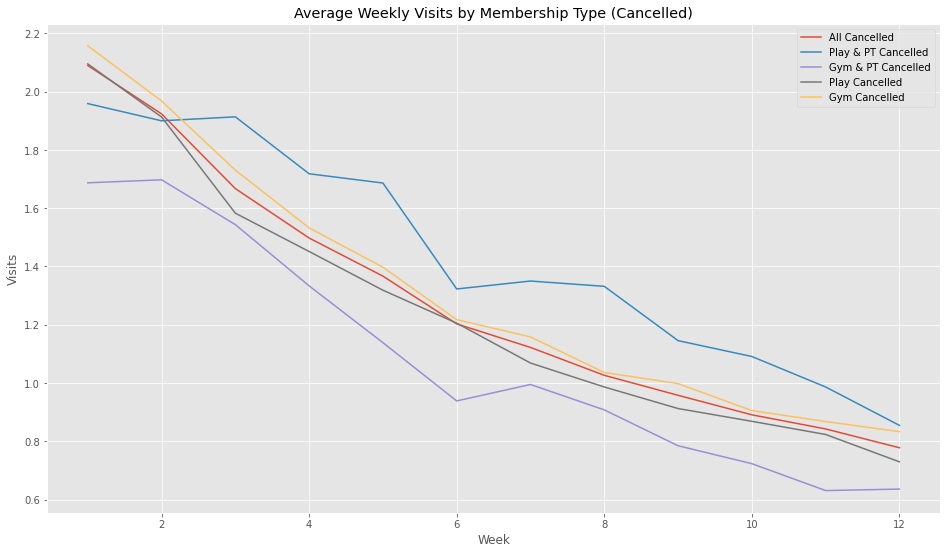

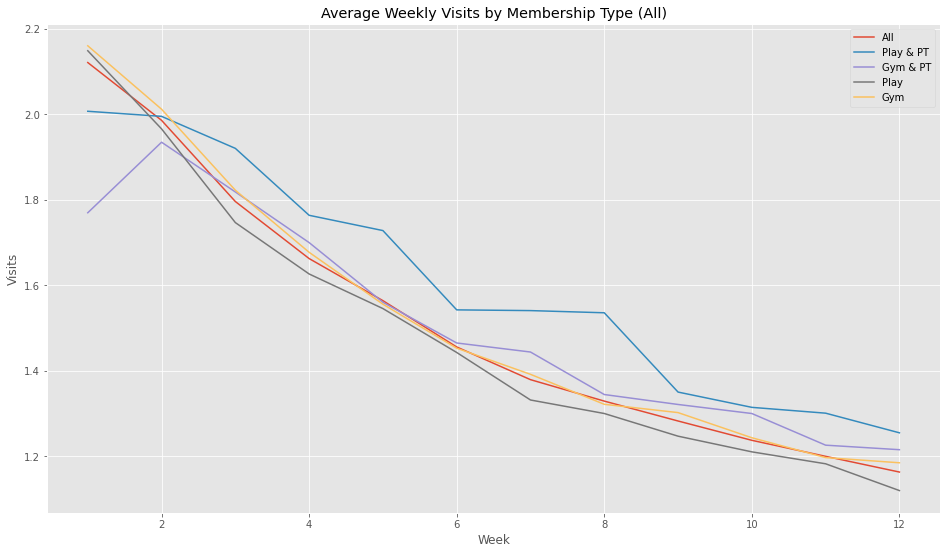

In [85]:
GRAPH_DATA = pd.DataFrame({
   'Week' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'All' : [mean(visits_wk_1),mean(visits_wk_2),mean(visits_wk_3),mean(visits_wk_4),mean(visits_wk_5),mean(visits_wk_6),mean(visits_wk_7),mean(visits_wk_8),mean(visits_wk_9),mean(visits_wk_10),mean(visits_wk_11),mean(visits_wk_12)],
    'All Cancelled' : [mean(cancelled_visits_wk_1),mean(cancelled_visits_wk_2),mean(cancelled_visits_wk_3),mean(cancelled_visits_wk_4),mean(cancelled_visits_wk_5),mean(cancelled_visits_wk_6),mean(cancelled_visits_wk_7),mean(cancelled_visits_wk_8),mean(cancelled_visits_wk_9),mean(cancelled_visits_wk_10),mean(cancelled_visits_wk_11),mean(cancelled_visits_wk_12)],
    'Play & PT' : [mean(play_pt_visits_wk_1),mean(play_pt_visits_wk_2),mean(play_pt_visits_wk_3),mean(play_pt_visits_wk_4),mean(play_pt_visits_wk_5),mean(play_pt_visits_wk_6),mean(play_pt_visits_wk_7),mean(play_pt_visits_wk_8),mean(play_pt_visits_wk_9),mean(play_pt_visits_wk_10),mean(play_pt_visits_wk_11),mean(play_pt_visits_wk_12)],
    'Play & PT Cancelled' : [mean(cancelled_play_pt_visits_wk_1),mean(cancelled_play_pt_visits_wk_2),mean(cancelled_play_pt_visits_wk_3),mean(cancelled_play_pt_visits_wk_4),mean(cancelled_play_pt_visits_wk_5),mean(cancelled_play_pt_visits_wk_6),mean(cancelled_play_pt_visits_wk_7),mean(cancelled_play_pt_visits_wk_8),mean(cancelled_play_pt_visits_wk_9),mean(cancelled_play_pt_visits_wk_10),mean(cancelled_play_pt_visits_wk_11),mean(cancelled_play_pt_visits_wk_12)],
    'Gym & PT' : [mean(gym_pt_visits_wk_1),mean(gym_pt_visits_wk_2),mean(gym_pt_visits_wk_3),mean(gym_pt_visits_wk_4),mean(gym_pt_visits_wk_5),mean(gym_pt_visits_wk_6),mean(gym_pt_visits_wk_7),mean(gym_pt_visits_wk_8),mean(gym_pt_visits_wk_9),mean(gym_pt_visits_wk_10),mean(gym_pt_visits_wk_11),mean(gym_pt_visits_wk_12)],
    'Gym & PT Cancelled' : [mean(cancelled_gym_pt_visits_wk_1),mean(cancelled_gym_pt_visits_wk_2),mean(cancelled_gym_pt_visits_wk_3),mean(cancelled_gym_pt_visits_wk_4),mean(cancelled_gym_pt_visits_wk_5),mean(cancelled_gym_pt_visits_wk_6),mean(cancelled_gym_pt_visits_wk_7),mean(cancelled_gym_pt_visits_wk_8),mean(cancelled_gym_pt_visits_wk_9),mean(cancelled_gym_pt_visits_wk_10),mean(cancelled_gym_pt_visits_wk_11),mean(cancelled_gym_pt_visits_wk_12)],
    'Play' :[mean(play_visits_wk_1),mean(play_visits_wk_2),mean(play_visits_wk_3),mean(play_visits_wk_4),mean(play_visits_wk_5),mean(play_visits_wk_6),mean(play_visits_wk_7),mean(play_visits_wk_8),mean(play_visits_wk_9),mean(play_visits_wk_10),mean(play_visits_wk_11),mean(play_visits_wk_12)],
    'Play Cancelled' : [mean(cancelled_play_visits_wk_1),mean(cancelled_play_visits_wk_2),mean(cancelled_play_visits_wk_3),mean(cancelled_play_visits_wk_4),mean(cancelled_play_visits_wk_5),mean(cancelled_play_visits_wk_6),mean(cancelled_play_visits_wk_7),mean(cancelled_play_visits_wk_8),mean(cancelled_play_visits_wk_9),mean(cancelled_play_visits_wk_10),mean(cancelled_play_visits_wk_11),mean(cancelled_play_visits_wk_12)],
    'Gym' : [mean(gym_visits_wk_1),mean(gym_visits_wk_2),mean(gym_visits_wk_3),mean(gym_visits_wk_4),mean(gym_visits_wk_5),mean(gym_visits_wk_6),mean(gym_visits_wk_7),mean(gym_visits_wk_8),mean(gym_visits_wk_9),mean(gym_visits_wk_10),mean(gym_visits_wk_11),mean(gym_visits_wk_12)],
    'Gym Cancelled' : [mean(cancelled_gym_visits_wk_1),mean(cancelled_gym_visits_wk_2),mean(cancelled_gym_visits_wk_3),mean(cancelled_gym_visits_wk_4),mean(cancelled_gym_visits_wk_5),mean(cancelled_gym_visits_wk_6),mean(cancelled_gym_visits_wk_7),mean(cancelled_gym_visits_wk_8),mean(cancelled_gym_visits_wk_9),mean(cancelled_gym_visits_wk_10),mean(cancelled_gym_visits_wk_11),mean(cancelled_gym_visits_wk_12)]
})

GRAPH_DATA.plot(x="Week", y=["All","All Cancelled",'Play & PT','Play & PT Cancelled','Gym & PT','Gym & PT Cancelled','Play','Play Cancelled','Gym','Gym Cancelled'], kind="line", figsize=(16,9), title="Average Weekly Visits by Membership Type", ylabel='Visits')
# fig.savefig('')

GRAPH_DATA.plot(x="Week", y=["All Cancelled",'Play & PT Cancelled','Gym & PT Cancelled','Play Cancelled','Gym Cancelled'], kind="line", figsize=(16,9), title="Average Weekly Visits by Membership Type (Cancelled)", ylabel='Visits')
GRAPH_DATA.plot(x="Week", y=["All",'Play & PT','Gym & PT','Play','Gym'], kind="line", figsize=(16,9), title="Average Weekly Visits by Membership Type (All)", ylabel='Visits')



<AxesSubplot:title={'center':'Average Weekly Visits by Membership Type (All)'}, xlabel='Week', ylabel='Visits'>

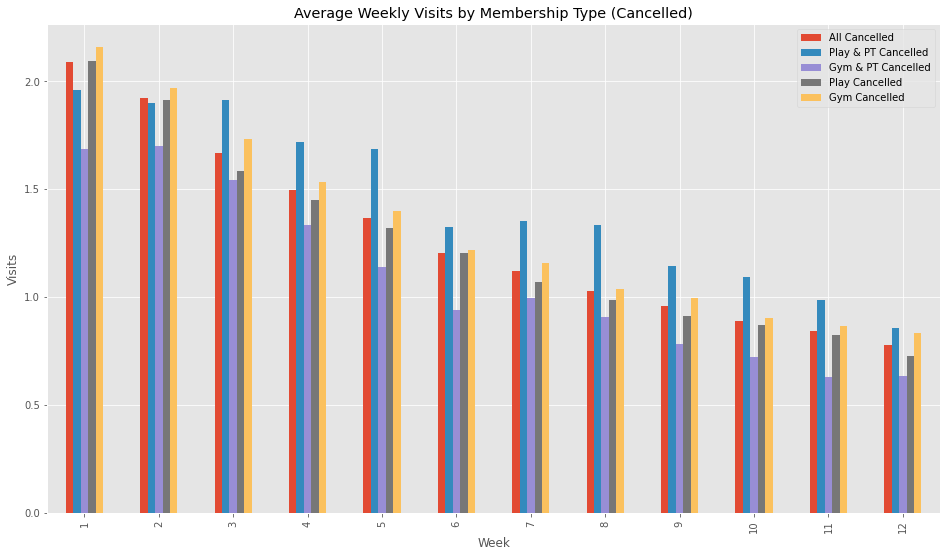

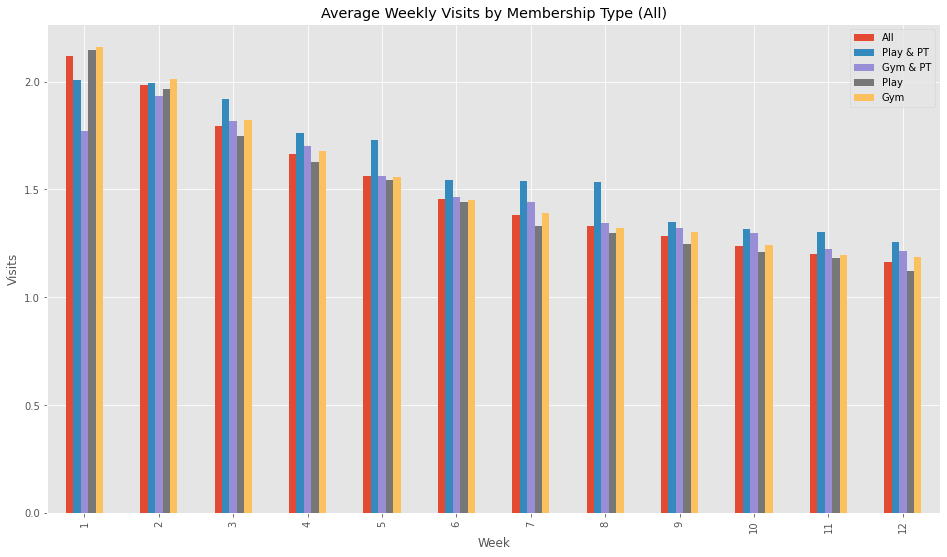

In [86]:
GRAPH_DATA.plot(x="Week", y=["All Cancelled",'Play & PT Cancelled','Gym & PT Cancelled','Play Cancelled','Gym Cancelled'], kind="bar", figsize=(16,9), title="Average Weekly Visits by Membership Type (Cancelled)", ylabel='Visits')
GRAPH_DATA.plot(x="Week", y=["All",'Play & PT','Gym & PT','Play','Gym'], kind="bar", figsize=(16,9), title="Average Weekly Visits by Membership Type (All)", ylabel='Visits')

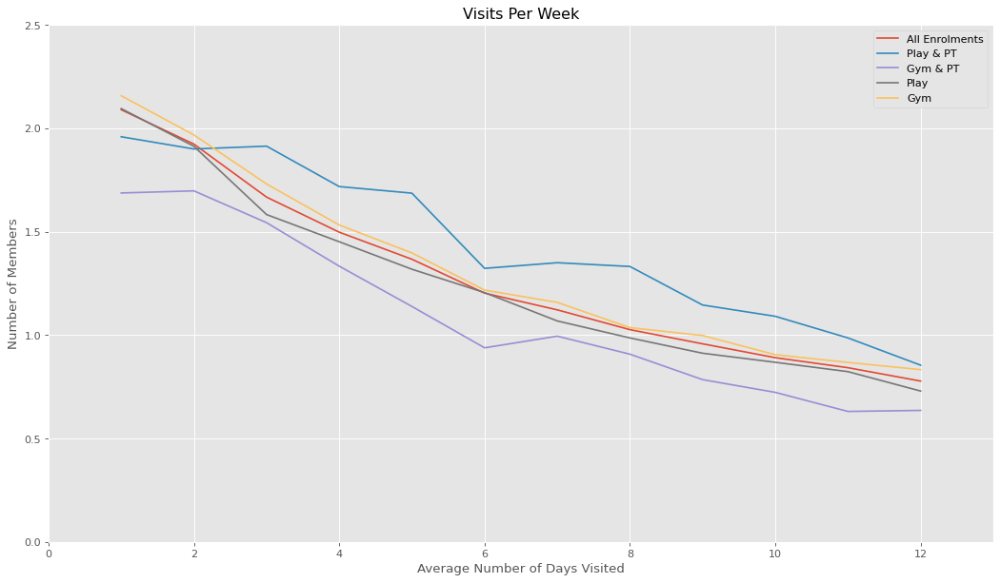

In [87]:
figure(figsize=(16, 9), dpi=80)
plt.ylim(0, 2.5)
plt.xlim(0, 13)

x_new = x

a_BSpline = scipy.interpolate.make_interp_spline(x, y)
y_new = a_BSpline(x_new)
plt.plot(x_new, y_new, label='All Enrolments')

a_BSpline = scipy.interpolate.make_interp_spline(x, y_play_pt)
y_new_play_pt = a_BSpline(x_new)
plt.plot(x_new, y_new_play_pt, label='Play & PT')

a_BSpline = scipy.interpolate.make_interp_spline(x, y_gym_pt)
y_new_gym_pt = a_BSpline(x_new)
plt.plot(x_new, y_new_gym_pt, label='Gym & PT')

a_BSpline = scipy.interpolate.make_interp_spline(x, y_play)
y_new_play = a_BSpline(x_new)
plt.plot(x_new, y_new_play, label='Play')

a_BSpline = scipy.interpolate.make_interp_spline(x, y_gym)
y_new_gym = a_BSpline(x_new)
plt.plot(x_new, y_new_gym, label='Gym')

# plt.plot(x_new, y_new, x_new, y_new_pt, x_new, y_new_no_pt)

plt.xlabel("Average Number of Days Visited")
plt.ylabel("Number of Members")
plt.title("Visits Per Week")

plt.legend(loc="upper right")
plt.show()

<AxesSubplot:title={'center':'Average Weekly Visits by Gender'}, xlabel='Week', ylabel='Visits'>

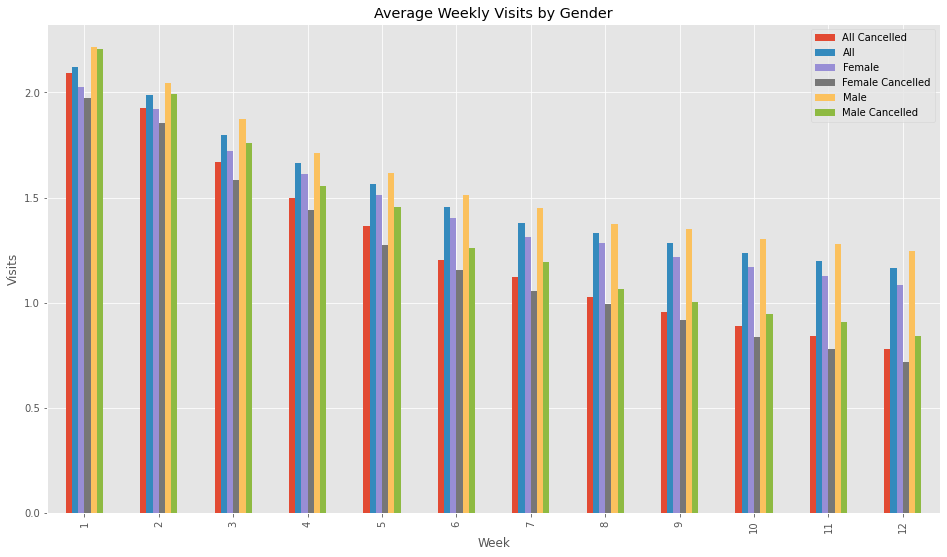

In [88]:
GRAPH_DATA = pd.DataFrame({
   'Week' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'All' : [mean(visits_wk_1),mean(visits_wk_2),mean(visits_wk_3),mean(visits_wk_4),mean(visits_wk_5),mean(visits_wk_6),mean(visits_wk_7),mean(visits_wk_8),mean(visits_wk_9),mean(visits_wk_10),mean(visits_wk_11),mean(visits_wk_12)],
    'All Cancelled' : [mean(cancelled_visits_wk_1),mean(cancelled_visits_wk_2),mean(cancelled_visits_wk_3),mean(cancelled_visits_wk_4),mean(cancelled_visits_wk_5),mean(cancelled_visits_wk_6),mean(cancelled_visits_wk_7),mean(cancelled_visits_wk_8),mean(cancelled_visits_wk_9),mean(cancelled_visits_wk_10),mean(cancelled_visits_wk_11),mean(cancelled_visits_wk_12)],
    'Male' : [mean(male_visits_wk_1),mean(male_visits_wk_2),mean(male_visits_wk_3),mean(male_visits_wk_4),mean(male_visits_wk_5),mean(male_visits_wk_6),mean(male_visits_wk_7),mean(male_visits_wk_8),mean(male_visits_wk_9),mean(male_visits_wk_10),mean(male_visits_wk_11),mean(male_visits_wk_12)],
    'Male Cancelled' : [mean(cancelled_male_visits_wk_1),mean(cancelled_male_visits_wk_2),mean(cancelled_male_visits_wk_3),mean(cancelled_male_visits_wk_4),mean(cancelled_male_visits_wk_5),mean(cancelled_male_visits_wk_6),mean(cancelled_male_visits_wk_7),mean(cancelled_male_visits_wk_8),mean(cancelled_male_visits_wk_9),mean(cancelled_male_visits_wk_10),mean(cancelled_male_visits_wk_11),mean(cancelled_male_visits_wk_12)],
    'Female' : [mean(female_visits_wk_1),mean(female_visits_wk_2),mean(female_visits_wk_3),mean(female_visits_wk_4),mean(female_visits_wk_5),mean(female_visits_wk_6),mean(female_visits_wk_7),mean(female_visits_wk_8),mean(female_visits_wk_9),mean(female_visits_wk_10),mean(female_visits_wk_11),mean(female_visits_wk_12)],
    'Female Cancelled' : [mean(cancelled_female_visits_wk_1),mean(cancelled_female_visits_wk_2),mean(cancelled_female_visits_wk_3),mean(cancelled_female_visits_wk_4),mean(cancelled_female_visits_wk_5),mean(cancelled_female_visits_wk_6),mean(cancelled_female_visits_wk_7),mean(cancelled_female_visits_wk_8),mean(cancelled_female_visits_wk_9),mean(cancelled_female_visits_wk_10),mean(cancelled_female_visits_wk_11),mean(cancelled_female_visits_wk_12)],
   })


GRAPH_DATA.plot(x="Week", y=["All Cancelled","All",'Female','Female Cancelled','Male','Male Cancelled'], kind="bar", figsize=(16,9), title="Average Weekly Visits by Gender", ylabel='Visits')
# GRAPH_DATA.plot(x="Week", y=["All",'Play & PT','Gym & PT','Play','Gym'], kind="line", figsize=(16,9), title="Average Weekly Visits by Membership Type", ylabel='Visits')


<AxesSubplot:title={'center':'Average Weekly Visits by Free Time (Cancelled)'}, xlabel='Week', ylabel='Visits'>

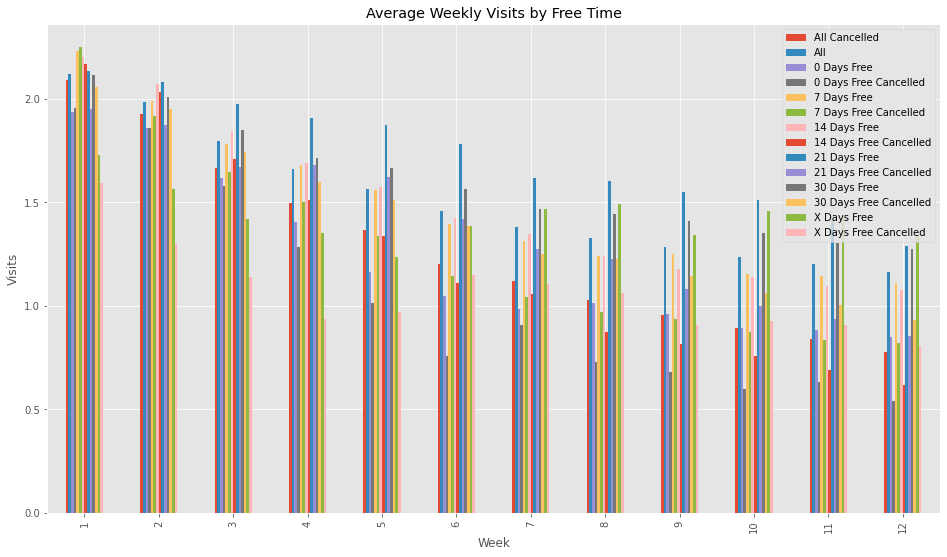

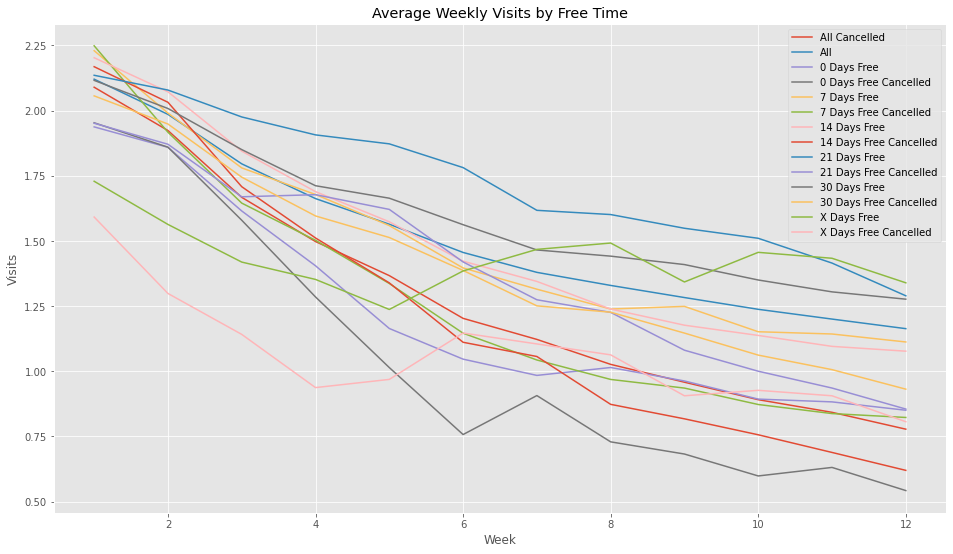

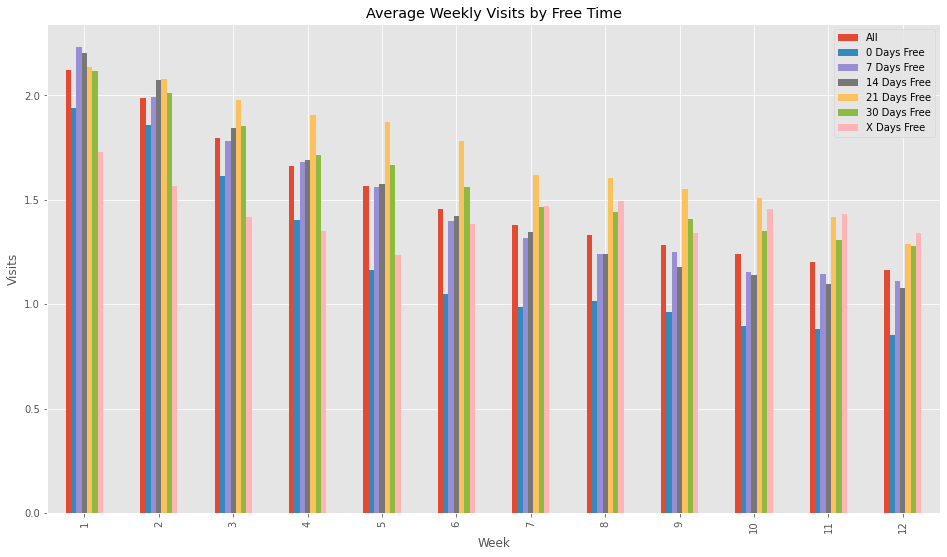

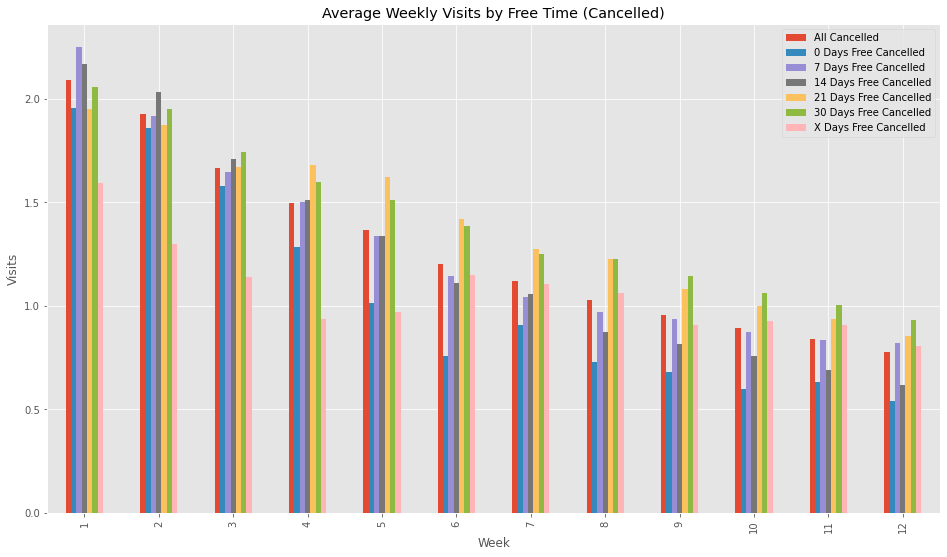

In [89]:
GRAPH_DATA = pd.DataFrame({
   'Week' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'All' : [mean(visits_wk_1),mean(visits_wk_2),mean(visits_wk_3),mean(visits_wk_4),mean(visits_wk_5),mean(visits_wk_6),mean(visits_wk_7),mean(visits_wk_8),mean(visits_wk_9),mean(visits_wk_10),mean(visits_wk_11),mean(visits_wk_12)],
    'All Cancelled' : [mean(cancelled_visits_wk_1),mean(cancelled_visits_wk_2),mean(cancelled_visits_wk_3),mean(cancelled_visits_wk_4),mean(cancelled_visits_wk_5),mean(cancelled_visits_wk_6),mean(cancelled_visits_wk_7),mean(cancelled_visits_wk_8),mean(cancelled_visits_wk_9),mean(cancelled_visits_wk_10),mean(cancelled_visits_wk_11),mean(cancelled_visits_wk_12)],
    'Male' : [mean(male_visits_wk_1),mean(male_visits_wk_2),mean(male_visits_wk_3),mean(male_visits_wk_4),mean(male_visits_wk_5),mean(male_visits_wk_6),mean(male_visits_wk_7),mean(male_visits_wk_8),mean(male_visits_wk_9),mean(male_visits_wk_10),mean(male_visits_wk_11),mean(male_visits_wk_12)],
    'Male Cancelled' : [mean(cancelled_male_visits_wk_1),mean(cancelled_male_visits_wk_2),mean(cancelled_male_visits_wk_3),mean(cancelled_male_visits_wk_4),mean(cancelled_male_visits_wk_5),mean(cancelled_male_visits_wk_6),mean(cancelled_male_visits_wk_7),mean(cancelled_male_visits_wk_8),mean(cancelled_male_visits_wk_9),mean(cancelled_male_visits_wk_10),mean(cancelled_male_visits_wk_11),mean(cancelled_male_visits_wk_12)],
    'Female' : [mean(female_visits_wk_1),mean(female_visits_wk_2),mean(female_visits_wk_3),mean(female_visits_wk_4),mean(female_visits_wk_5),mean(female_visits_wk_6),mean(female_visits_wk_7),mean(female_visits_wk_8),mean(female_visits_wk_9),mean(female_visits_wk_10),mean(female_visits_wk_11),mean(female_visits_wk_12)],
    'Female Cancelled' : [mean(cancelled_female_visits_wk_1),mean(cancelled_female_visits_wk_2),mean(cancelled_female_visits_wk_3),mean(cancelled_female_visits_wk_4),mean(cancelled_female_visits_wk_5),mean(cancelled_female_visits_wk_6),mean(cancelled_female_visits_wk_7),mean(cancelled_female_visits_wk_8),mean(cancelled_female_visits_wk_9),mean(cancelled_female_visits_wk_10),mean(cancelled_female_visits_wk_11),mean(cancelled_female_visits_wk_12)],
    '0 Days Free' : [mean(free_time_0_visits_wk_1),mean(free_time_0_visits_wk_2),mean(free_time_0_visits_wk_3),mean(free_time_0_visits_wk_4),mean(free_time_0_visits_wk_5),mean(free_time_0_visits_wk_6),mean(free_time_0_visits_wk_7),mean(free_time_0_visits_wk_8),mean(free_time_0_visits_wk_9),mean(free_time_0_visits_wk_10),mean(free_time_0_visits_wk_11),mean(free_time_0_visits_wk_12)],
    '0 Days Free Cancelled' : [mean(cancelled_free_time_0_visits_wk_1),mean(cancelled_free_time_0_visits_wk_2),mean(cancelled_free_time_0_visits_wk_3),mean(cancelled_free_time_0_visits_wk_4),mean(cancelled_free_time_0_visits_wk_5),mean(cancelled_free_time_0_visits_wk_6),mean(cancelled_free_time_0_visits_wk_7),mean(cancelled_free_time_0_visits_wk_8),mean(cancelled_free_time_0_visits_wk_9),mean(cancelled_free_time_0_visits_wk_10),mean(cancelled_free_time_0_visits_wk_11),mean(cancelled_free_time_0_visits_wk_12)],
    '7 Days Free' : [mean(free_time_7_visits_wk_1),mean(free_time_7_visits_wk_2),mean(free_time_7_visits_wk_3),mean(free_time_7_visits_wk_4),mean(free_time_7_visits_wk_5),mean(free_time_7_visits_wk_6),mean(free_time_7_visits_wk_7),mean(free_time_7_visits_wk_8),mean(free_time_7_visits_wk_9),mean(free_time_7_visits_wk_10),mean(free_time_7_visits_wk_11),mean(free_time_7_visits_wk_12)],
    '7 Days Free Cancelled' : [mean(cancelled_free_time_7_visits_wk_1),mean(cancelled_free_time_7_visits_wk_2),mean(cancelled_free_time_7_visits_wk_3),mean(cancelled_free_time_7_visits_wk_4),mean(cancelled_free_time_7_visits_wk_5),mean(cancelled_free_time_7_visits_wk_6),mean(cancelled_free_time_7_visits_wk_7),mean(cancelled_free_time_7_visits_wk_8),mean(cancelled_free_time_7_visits_wk_9),mean(cancelled_free_time_7_visits_wk_10),mean(cancelled_free_time_7_visits_wk_11),mean(cancelled_free_time_7_visits_wk_12)],
    '14 Days Free' : [mean(free_time_14_visits_wk_1),mean(free_time_14_visits_wk_2),mean(free_time_14_visits_wk_3),mean(free_time_14_visits_wk_4),mean(free_time_14_visits_wk_5),mean(free_time_14_visits_wk_6),mean(free_time_14_visits_wk_7),mean(free_time_14_visits_wk_8),mean(free_time_14_visits_wk_9),mean(free_time_14_visits_wk_10),mean(free_time_14_visits_wk_11),mean(free_time_14_visits_wk_12)],
    '14 Days Free Cancelled' : [mean(cancelled_free_time_14_visits_wk_1),mean(cancelled_free_time_14_visits_wk_2),mean(cancelled_free_time_14_visits_wk_3),mean(cancelled_free_time_14_visits_wk_4),mean(cancelled_free_time_14_visits_wk_5),mean(cancelled_free_time_14_visits_wk_6),mean(cancelled_free_time_14_visits_wk_7),mean(cancelled_free_time_14_visits_wk_8),mean(cancelled_free_time_14_visits_wk_9),mean(cancelled_free_time_14_visits_wk_10),mean(cancelled_free_time_14_visits_wk_11),mean(cancelled_free_time_14_visits_wk_12)],
    '21 Days Free' : [mean(free_time_21_visits_wk_1),mean(free_time_21_visits_wk_2),mean(free_time_21_visits_wk_3),mean(free_time_21_visits_wk_4),mean(free_time_21_visits_wk_5),mean(free_time_21_visits_wk_6),mean(free_time_21_visits_wk_7),mean(free_time_21_visits_wk_8),mean(free_time_21_visits_wk_9),mean(free_time_21_visits_wk_10),mean(free_time_21_visits_wk_11),mean(free_time_21_visits_wk_12)],
    '21 Days Free Cancelled' : [mean(cancelled_free_time_21_visits_wk_1),mean(cancelled_free_time_21_visits_wk_2),mean(cancelled_free_time_21_visits_wk_3),mean(cancelled_free_time_21_visits_wk_4),mean(cancelled_free_time_21_visits_wk_5),mean(cancelled_free_time_21_visits_wk_6),mean(cancelled_free_time_21_visits_wk_7),mean(cancelled_free_time_21_visits_wk_8),mean(cancelled_free_time_21_visits_wk_9),mean(cancelled_free_time_21_visits_wk_10),mean(cancelled_free_time_21_visits_wk_11),mean(cancelled_free_time_21_visits_wk_12)],
    '30 Days Free' : [mean(free_time_30_visits_wk_1),mean(free_time_30_visits_wk_2),mean(free_time_30_visits_wk_3),mean(free_time_30_visits_wk_4),mean(free_time_30_visits_wk_5),mean(free_time_30_visits_wk_6),mean(free_time_30_visits_wk_7),mean(free_time_30_visits_wk_8),mean(free_time_30_visits_wk_9),mean(free_time_30_visits_wk_10),mean(free_time_30_visits_wk_11),mean(free_time_30_visits_wk_12)],
    '30 Days Free Cancelled' : [mean(cancelled_free_time_30_visits_wk_1),mean(cancelled_free_time_30_visits_wk_2),mean(cancelled_free_time_30_visits_wk_3),mean(cancelled_free_time_30_visits_wk_4),mean(cancelled_free_time_30_visits_wk_5),mean(cancelled_free_time_30_visits_wk_6),mean(cancelled_free_time_30_visits_wk_7),mean(cancelled_free_time_30_visits_wk_8),mean(cancelled_free_time_30_visits_wk_9),mean(cancelled_free_time_30_visits_wk_10),mean(cancelled_free_time_30_visits_wk_11),mean(cancelled_free_time_30_visits_wk_12)],
    'X Days Free' : [mean(free_time_X_visits_wk_1),mean(free_time_X_visits_wk_2),mean(free_time_X_visits_wk_3),mean(free_time_X_visits_wk_4),mean(free_time_X_visits_wk_5),mean(free_time_X_visits_wk_6),mean(free_time_X_visits_wk_7),mean(free_time_X_visits_wk_8),mean(free_time_X_visits_wk_9),mean(free_time_X_visits_wk_10),mean(free_time_X_visits_wk_11),mean(free_time_X_visits_wk_12)],
    'X Days Free Cancelled' : [mean(cancelled_free_time_X_visits_wk_1),mean(cancelled_free_time_X_visits_wk_2),mean(cancelled_free_time_X_visits_wk_3),mean(cancelled_free_time_X_visits_wk_4),mean(cancelled_free_time_X_visits_wk_5),mean(cancelled_free_time_X_visits_wk_6),mean(cancelled_free_time_X_visits_wk_7),mean(cancelled_free_time_X_visits_wk_8),mean(cancelled_free_time_X_visits_wk_9),mean(cancelled_free_time_X_visits_wk_10),mean(cancelled_free_time_X_visits_wk_11),mean(cancelled_free_time_X_visits_wk_12)],
   })


GRAPH_DATA.plot(x="Week", y=["All Cancelled","All",'0 Days Free','0 Days Free Cancelled','7 Days Free','7 Days Free Cancelled','14 Days Free','14 Days Free Cancelled','21 Days Free','21 Days Free Cancelled','30 Days Free','30 Days Free Cancelled','X Days Free','X Days Free Cancelled'], kind="bar", figsize=(16,9), title="Average Weekly Visits by Free Time", ylabel='Visits')
GRAPH_DATA.plot(x="Week", y=["All Cancelled","All",'0 Days Free','0 Days Free Cancelled','7 Days Free','7 Days Free Cancelled','14 Days Free','14 Days Free Cancelled','21 Days Free','21 Days Free Cancelled','30 Days Free','30 Days Free Cancelled','X Days Free','X Days Free Cancelled'], kind="line", figsize=(16,9), title="Average Weekly Visits by Free Time", ylabel='Visits')

GRAPH_DATA.plot(x="Week", y=["All",'0 Days Free','7 Days Free','14 Days Free','21 Days Free','30 Days Free','X Days Free'], kind="bar", figsize=(16,9), title="Average Weekly Visits by Free Time", ylabel='Visits')
GRAPH_DATA.plot(x="Week", y=["All Cancelled",'0 Days Free Cancelled','7 Days Free Cancelled','14 Days Free Cancelled','21 Days Free Cancelled','30 Days Free Cancelled','X Days Free Cancelled'], kind="bar", figsize=(16,9), title="Average Weekly Visits by Free Time (Cancelled)", ylabel='Visits')


In [ ]:
DAYS_FREE = []
for d in data:
    if d['daysFree'] not in DAYS_FREE:
        DAYS_FREE.append(d['daysFree'])
DAYS_FREE

In [ ]:
data[10]

In [90]:
cancelled_tenure = []
cancelled_gym_tenure = []
cancelled_play_tenure = []
cancelled_gym_pt_tenure = []
cancelled_play_pt_tenure = []
cancelled_male_pt_tenure = []
cancelled_female_pt_tenure = []
cancelled_tenure_less_20 = []
cancelled_tenure_20_25 = []
cancelled_tenure_25_30 = []
cancelled_tenure_30_35 = []
cancelled_tenure_35_40 = []
cancelled_tenure_40_45 = []
cancelled_tenure_45_50 = []
cancelled_tenure_greater_50 = []
cancelled_free_time_0_tenure = []
cancelled_free_time_7_tenure = []
cancelled_free_time_14_tenure = []
cancelled_free_time_21_tenure = []
cancelled_free_time_30_tenure = []
cancelled_free_time_X_tenure = []

tenure = []
gym_tenure = []
play_tenure = []
gym_pt_tenure = []
play_pt_tenure = []
male_pt_tenure = []
female_pt_tenure = []
tenure_less_20 = []
tenure_20_25 = []
tenure_25_30 = []
tenure_30_35 = []
tenure_35_40 = []
tenure_40_45 = []
tenure_45_50 = []
tenure_greater_50 = []
free_time_0_tenure = []
free_time_7_tenure = []
free_time_14_tenure = []
free_time_21_tenure = []
free_time_30_tenure = []
free_time_X_tenure = []

for d in data:
    if d['isActive'] == False and d['tenure'] is not None:
        cancelled_tenure.append(d['tenure'])
        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            cancelled_play_pt_tenure.append(d['tenure'])
        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            cancelled_gym_pt_tenure.append(d['tenure'])
        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            cancelled_play_tenure.append(d['tenure'])
        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            cancelled_gym_tenure.append(d['tenure'])
        if d['gender'] == 'male':
            cancelled_male_pt_tenure.append(d['tenure'])
        if d['gender'] == 'female':
            cancelled_female_pt_tenure.append(d['tenure'])
        if d['age'] <= 20:
            cancelled_tenure_less_20.append(d['tenure'])
        if d['age'] > 20 and d['age'] <= 25:
            cancelled_tenure_20_25.append(d['tenure'])
        if d['age'] > 25 and d['age'] <= 30:    
            cancelled_tenure_25_30.append(d['tenure'])
        if d['age'] > 30 and d['age'] <= 35:
            cancelled_tenure_30_35.append(d['tenure'])
        if d['age'] > 35 and d['age'] <= 40:
            cancelled_tenure_35_40.append(d['tenure'])
        if d['age'] > 40 and d['age'] <= 45:
            cancelled_tenure_40_45.append(d['tenure'])
        if d['age'] > 45 and d['age'] <= 50:
            cancelled_tenure_45_50.append(d['tenure'])
        if d['age'] > 50:
            cancelled_tenure_greater_50.append(d['tenure'])
            
        if d['tenure'] is not None and d['daysFree'] is not None:
            if d['daysFree'] == '':
                cancelled_free_time_0_tenure.append(d['tenure'])
            elif d['daysFree'] == '7DaysFree':
                cancelled_free_time_7_tenure.append(d['tenure'])
            elif d['daysFree'] == '14DaysFree':
                cancelled_free_time_14_tenure.append(d['tenure'])
            elif d['daysFree'] == '21DaysFree':
                cancelled_free_time_21_tenure.append(d['tenure'])
            elif d['daysFree'] == '30DaysFree':
                cancelled_free_time_30_tenure.append(d['tenure'])
            elif d['daysFree'] == 'XDaysFree':
                cancelled_free_time_X_tenure.append(d['tenure'])
            
    if d['tenure'] is not None:
        tenure.append(d['tenure'])
        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            play_pt_tenure.append(d['tenure'])
        if d['trainingStarterPack'] == 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            gym_pt_tenure.append(d['tenure'])
        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'play':
            play_tenure.append(d['tenure'])
        if d['trainingStarterPack'] != 'ongoingPersonalTraining' and d['gymOrPlay'] == 'gym':
            gym_tenure.append(d['tenure'])
        if d['gender'] == 'male':
            male_pt_tenure.append(d['tenure'])
        if d['gender'] == 'female':
            female_pt_tenure.append(d['tenure'])
        if d['age'] <= 20:
            tenure_less_20.append(d['tenure'])
        if d['age'] > 20 and d['age'] <= 25:
            tenure_20_25.append(d['tenure'])
        if d['age'] > 25 and d['age'] <= 30:    
            tenure_25_30.append(d['tenure'])
        if d['age'] > 30 and d['age'] <= 35:
            tenure_30_35.append(d['tenure'])
        if d['age'] > 35 and d['age'] <= 40:
            tenure_35_40.append(d['tenure'])
        if d['age'] > 40 and d['age'] <= 45:
            tenure_40_45.append(d['tenure'])
        if d['age'] > 45 and d['age'] <= 50:
            tenure_45_50.append(d['tenure'])
        if d['age'] > 50:
            tenure_greater_50.append(d['tenure'])
            
    if d['tenure'] is not None and d['daysFree'] is not None:
        if d['daysFree'] == '':
            free_time_0_tenure.append(d['tenure'])
        elif d['daysFree'] == '7DaysFree':
            free_time_7_tenure.append(d['tenure'])
        elif d['daysFree'] == '14DaysFree':
            free_time_14_tenure.append(d['tenure'])
        elif d['daysFree'] == '21DaysFree':
            free_time_21_tenure.append(d['tenure'])
        elif d['daysFree'] == '30DaysFree':
            free_time_30_tenure.append(d['tenure'])
        elif d['daysFree'] == 'XDaysFree':
            free_time_X_tenure.append(d['tenure'])
        

In [191]:
print(f"Avg Cancelled Tenure: {round(mean(cancelled_tenure), 1)} days. Sample size: {len(cancelled_tenure)}")
print(f"Avg Cancelled Gym Tenure: {round(mean(cancelled_gym_tenure), 1)} days. Sample size: {len(cancelled_gym_tenure)}")
print(f"Avg Cancelled Play Tenure: {round(mean(cancelled_play_tenure), 1)} days. Sample size: {len(cancelled_play_tenure)}")
print(f"Avg Cancelled Gym & PT Tenure: {round(mean(cancelled_gym_pt_tenure), 1)} days. Sample size: {len(cancelled_gym_pt_tenure)}")
print(f"Avg Cancelled Play & PT Tenure: {round(mean(cancelled_play_pt_tenure), 1)} days. Sample size: {len(cancelled_play_pt_tenure)}")
print(f"Avg Cancelled Male Tenure: {round(mean(cancelled_male_pt_tenure), 1)} days. Sample size: {len(cancelled_male_pt_tenure)}")
print(f"Avg Cancelled Female Tenure: {round(mean(cancelled_female_pt_tenure), 1)} days. Sample size: {len(cancelled_female_pt_tenure)}")
print(f"Avg Cancelled <=20 Years Tenure: {round(mean(cancelled_tenure_less_20), 1)}. Sample size: {len(cancelled_tenure_less_20)}")
print(f"Avg Cancelled 21-25 Tenure: {round(mean(cancelled_tenure_20_25), 1)} days. Sample size: {len(cancelled_tenure_20_25)}")
print(f"Avg Cancelled 26-30 Tenure: {round(mean(cancelled_tenure_25_30), 1)} days. Sample size: {len(cancelled_tenure_25_30)}")
print(f"Avg Cancelled 31-35 Tenure: {round(mean(cancelled_tenure_30_35), 1)} days. Sample size: {len(cancelled_tenure_30_35)}")
print(f"Avg Cancelled 36-40 Tenure: {round(mean(cancelled_tenure_35_40), 1)} days. Sample size: {len(cancelled_tenure_35_40)}")
print(f"Avg Cancelled 41-45 Tenure: {round(mean(cancelled_tenure_40_45), 1)} days. Sample size: {len(cancelled_tenure_40_45)}")
print(f"Avg Cancelled 46-50 Tenure: {round(mean(cancelled_tenure_45_50), 1)} days. Sample size: {len(cancelled_tenure_45_50)}")
print(f"Avg Cancelled >50 Tenure: {round(mean(cancelled_tenure_greater_50), 1)} days. Sample size: {len(cancelled_tenure_greater_50)}")
print(f"Avg Cancelled 0 Days Free Tenure: {round(mean(cancelled_free_time_0_tenure), 1)} days. Sample size: {len(cancelled_free_time_0_tenure)}")
print(f"Avg Cancelled 7 Days Free Tenure: {round(mean(cancelled_free_time_7_tenure), 1)} days. Sample size: {len(cancelled_free_time_7_tenure)}")
print(f"Avg Cancelled 14 Days FreeTenure: {round(mean(cancelled_free_time_14_tenure), 1)} days. Sample size: {len(cancelled_free_time_14_tenure)}")
print(f"Avg Cancelled 21 Days Tenure: {round(mean(cancelled_free_time_21_tenure), 1)} days. Sample size: {len(cancelled_free_time_21_tenure)}")
print(f"Avg Cancelled 30 Days Tenure: {round(mean(cancelled_free_time_30_tenure), 1)} days. Sample size: {len(cancelled_free_time_30_tenure)}")
print(f"Avg Cancelled X Days Tenure: {round(mean(cancelled_free_time_X_tenure), 1)} days. Sample size: {len(cancelled_free_time_X_tenure)}")
print(f"Avg Cancelled External PT Tenure: {round(mean(cancelled_external_pt_tenure), 1)} days. Sample size: {len(cancelled_external_pt_tenure)}")
print(f"Avg Cancelled Upgrades Tenure: {round(mean(cancelled_upgrades_tenure), 1)} days. Sample size: {len(cancelled_upgrades_tenure)}")
print(f"Avg Cancelled Downgrades Tenure: {round(mean(cancelled_downgrades_tenure), 1)} days. Sample size: {len(cancelled_downgrades_tenure)}")



print()
print(f"Avg Tenure: {round(mean(tenure), 1)} days. Sample size: {len(tenure)}")
print(f"Avg Gym Tenure: {round(mean(gym_tenure), 1)} days. Sample size: {len(gym_tenure)}")
print(f"Avg Play Tenure: {round(mean(play_tenure), 1)} days. Sample size: {len(play_tenure)}")
print(f"Avg Gym & PT Tenure: {round(mean(gym_pt_tenure), 1)} days. Sample size: {len(gym_pt_tenure)}")
print(f"Avg Play & PT Tenure: {round(mean(play_pt_tenure), 1)} days. Sample size: {len(play_pt_tenure)}")
print(f"Avg Male Tenure: {round(mean(male_pt_tenure), 1)} days. Sample size: {len(male_pt_tenure)}")
print(f"Avg Female Tenure: {round(mean(female_pt_tenure), 1)} days. Sample size: {len(female_pt_tenure)}")
print(f"Avg <=20 Years Tenure: {round(mean(tenure_less_20), 1)}. Sample size: {len(tenure_less_20)}")
print(f"Avg 21-25 Tenure: {round(mean(tenure_20_25), 1)} days. Sample size: {len(tenure_20_25)}")
print(f"Avg 26-30 Tenure: {round(mean(tenure_25_30), 1)} days. Sample size: {len(tenure_25_30)}")
print(f"Avg 31-35 Tenure: {round(mean(tenure_30_35), 1)} days. Sample size: {len(tenure_30_35)}")
print(f"Avg 36-40 Tenure: {round(mean(tenure_35_40), 1)} days. Sample size: {len(tenure_35_40)}")
print(f"Avg 41-45 Tenure: {round(mean(tenure_40_45), 1)} days. Sample size: {len(tenure_40_45)}")
print(f"Avg 46-50 Tenure: {round(mean(tenure_45_50), 1)} days. Sample size: {len(tenure_45_50)}")
print(f"Avg >50 Tenure: {round(mean(tenure_greater_50), 1)} days. Sample size: {len(tenure_greater_50)}")
print(f"Avg 0 Days Free Tenure: {round(mean(free_time_0_tenure), 1)} days. Sample size: {len(free_time_0_tenure)}")
print(f"Avg 7 Days Free Tenure: {round(mean(free_time_7_tenure), 1)} days. Sample size: {len(free_time_7_tenure)}")
print(f"Avg 14 Days FreeTenure: {round(mean(free_time_14_tenure), 1)} days. Sample size: {len(free_time_14_tenure)}")
print(f"Avg 21 Days Tenure: {round(mean(free_time_21_tenure), 1)} days. Sample size: {len(free_time_21_tenure)}")
print(f"Avg 30 Days Tenure: {round(mean(free_time_30_tenure), 1)} days. Sample size: {len(free_time_30_tenure)}")
print(f"Avg X Days Tenure: {round(mean(free_time_X_tenure), 1)} days. Sample size: {len(free_time_X_tenure)}")
print(f"Avg External PT Tenure: {round(mean(external_pt_tenure), 1)} days. Sample size: {len(external_pt_tenure)}")
print(f"Avg Upgrades Tenure: {round(mean(upgrades_tenure), 1)} days. Sample size: {len(upgrades_tenure)}")
print(f"Avg Downgrades Tenure: {round(mean(downgrades_tenure), 1)} days. Sample size: {len(downgrades_tenure)}")


print()
print(f"% Cancelled {round(len(cancelled_tenure) / len(tenure) * 100, 1)}%")
print(f"% Gym Cancelled {round(len(cancelled_gym_tenure) / len(gym_tenure) * 100, 1)}%")
print(f"% Play Cancelled {round(len(cancelled_play_tenure) / len(play_tenure) * 100, 1)}%")
print(f"% Gym & PT Cancelled {round(len(cancelled_gym_pt_tenure) / len(gym_pt_tenure) * 100, 1)}%")
print(f"% Play & PT Cancelled {round(len(cancelled_play_pt_tenure) / len(play_pt_tenure) * 100, 1)}%")
print(f"% Male Cancelled {round(len(cancelled_male_pt_tenure) / len(male_pt_tenure) * 100, 1)}%")
print(f"% Female Cancelled {round(len(cancelled_female_pt_tenure) / len(female_pt_tenure) * 100, 1)}%")
print(f"% <=20 Cancelled {round(len(cancelled_tenure_less_20) / len(tenure_less_20) * 100, 1)}%")
print(f"% 21-25 Cancelled {round(len(cancelled_tenure_20_25) / len(tenure_20_25) * 100, 1)}%")
print(f"% 26-30 Cancelled {round(len(cancelled_tenure_25_30) / len(tenure_25_30) * 100, 1)}%")
print(f"% 31-35 Cancelled {round(len(cancelled_tenure_30_35) / len(tenure_30_35) * 100, 1)}%")
print(f"% 36-40 Cancelled {round(len(cancelled_tenure_35_40) / len(tenure_35_40) * 100, 1)}%")
print(f"% 41-45 Cancelled {round(len(cancelled_tenure_40_45) / len(tenure_40_45) * 100, 1)}%")
print(f"% 46-50 Cancelled {round(len(cancelled_tenure_45_50) / len(tenure_45_50) * 100, 1)}%")
print(f"% >50 Cancelled {round(len(cancelled_tenure_greater_50) / len(tenure_greater_50) * 100, 1)}%")
print(f"% 0 Days Free Cancelled {round(len(cancelled_free_time_0_tenure) / len(free_time_0_tenure) * 100, 1)}%")
print(f"% 7 Days Free Cancelled {round(len(cancelled_free_time_7_tenure) / len(free_time_7_tenure) * 100, 1)}%")
print(f"% 14 Days Free Cancelled {round(len(cancelled_free_time_14_tenure) / len(free_time_14_tenure) * 100, 1)}%")
print(f"% 21 Days Free Cancelled {round(len(cancelled_free_time_21_tenure) / len(free_time_21_tenure) * 100, 1)}%")
print(f"% 30 Days Free Cancelled {round(len(cancelled_free_time_30_tenure) / len(free_time_30_tenure) * 100, 1)}%")
print(f"% X Days Free Cancelled {round(len(cancelled_free_time_X_tenure) / len(free_time_X_tenure) * 100, 1)}%")
print(f"% PT External Cancelled {round(len(cancelled_external_pt_tenure) / len(external_pt_tenure) * 100, 1)}%")
print(f"% Upgrades Cancelled {round(len(cancelled_upgrades_tenure) / len(upgrades_tenure) * 100, 1)}%")
print(f"% Downgrades Cancelled {round(len(cancelled_downgrades_tenure) / len(downgrades_tenure) * 100, 1)}%")

cancellation_percentages = [round(len(cancelled_tenure) / len(tenure) * 100, 1),round(len(cancelled_gym_tenure) / len(gym_tenure) * 100, 1),round(len(cancelled_play_tenure) / len(play_tenure) * 100, 1),round(len(cancelled_gym_pt_tenure) / len(gym_pt_tenure) * 100, 1),round(len(cancelled_play_pt_tenure) / len(play_pt_tenure) * 100, 1),round(len(cancelled_male_pt_tenure) / len(male_pt_tenure) * 100, 1),round(len(cancelled_female_pt_tenure) / len(female_pt_tenure) * 100, 1),round(len(cancelled_tenure_less_20) / len(tenure_less_20) * 100, 1),round(len(cancelled_tenure_20_25) / len(tenure_20_25) * 100, 1),round(len(cancelled_tenure_25_30) / len(tenure_25_30) * 100, 1),round(len(cancelled_tenure_30_35) / len(tenure_30_35) * 100, 1),round(len(cancelled_tenure_35_40) / len(tenure_35_40) * 100, 1),round(len(cancelled_tenure_40_45) / len(tenure_40_45) * 100, 1),round(len(cancelled_tenure_45_50) / len(tenure_45_50) * 100, 1),round(len(cancelled_tenure_greater_50) / len(tenure_greater_50) * 100, 1),round(len(cancelled_free_time_0_tenure) / len(free_time_0_tenure) * 100, 1),round(len(cancelled_free_time_7_tenure) / len(free_time_7_tenure) * 100, 1),round(len(cancelled_free_time_14_tenure) / len(free_time_14_tenure) * 100, 1),round(len(cancelled_free_time_21_tenure) / len(free_time_21_tenure) * 100, 1),round(len(cancelled_free_time_30_tenure) / len(free_time_30_tenure) * 100, 1),round(len(cancelled_free_time_X_tenure) / len(free_time_X_tenure) * 100, 1),round(len(cancelled_external_pt_tenure) / len(external_pt_tenure) * 100, 1),round(len(cancelled_upgrades_tenure) / len(upgrades_tenure) * 100, 1),round(len(cancelled_downgrades_tenure) / len(downgrades_tenure) * 100, 1)]

Avg Cancelled Tenure: 169.6 days. Sample size: 2514
Avg Cancelled Gym Tenure: 167.1 days. Sample size: 1071
Avg Cancelled Play Tenure: 166.6 days. Sample size: 1136
Avg Cancelled Gym & PT Tenure: 177.8 days. Sample size: 135
Avg Cancelled Play & PT Tenure: 198.8 days. Sample size: 172
Avg Cancelled Male Tenure: 168.1 days. Sample size: 1217
Avg Cancelled Female Tenure: 171.7 days. Sample size: 1275
Avg Cancelled <=20 Years Tenure: 164.6. Sample size: 184
Avg Cancelled 21-25 Tenure: 158.9 days. Sample size: 732
Avg Cancelled 26-30 Tenure: 173.8 days. Sample size: 814
Avg Cancelled 31-35 Tenure: 176.4 days. Sample size: 441
Avg Cancelled 36-40 Tenure: 181.0 days. Sample size: 214
Avg Cancelled 41-45 Tenure: 165.1 days. Sample size: 63
Avg Cancelled 46-50 Tenure: 171.8 days. Sample size: 40
Avg Cancelled >50 Tenure: 171.9 days. Sample size: 26
Avg Cancelled 0 Days Free Tenure: 191.7 days. Sample size: 129
Avg Cancelled 7 Days Free Tenure: 173.3 days. Sample size: 458
Avg Cancelled 14 Days

In [190]:
enrolment_data.head()

datetime.datetime.now() - pd.to_datetime('2019-09-13 15:46:30')


Timedelta('726 days 19:49:17.021066')

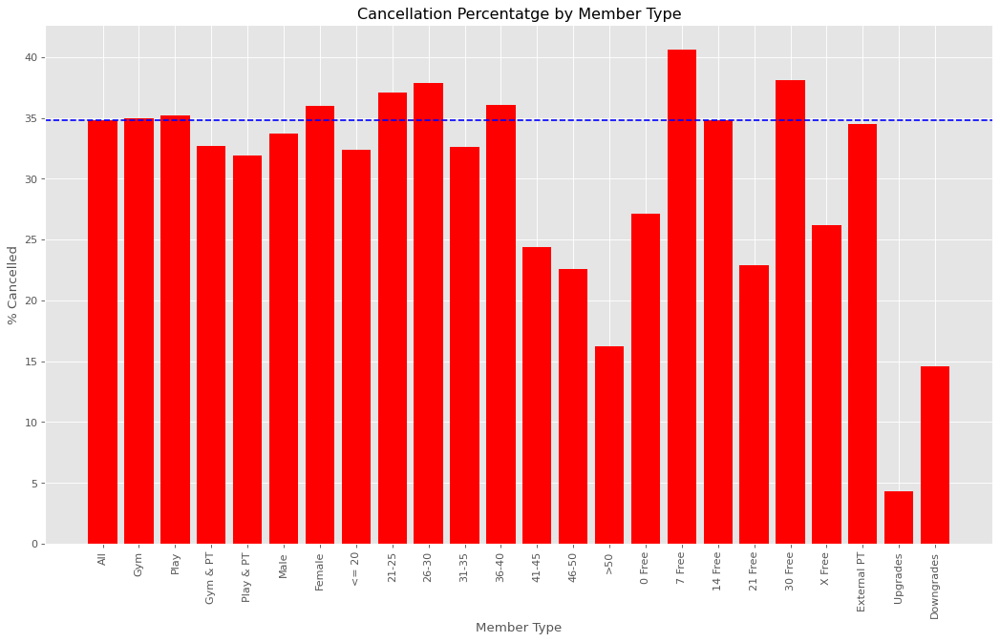

In [194]:
y = cancellation_percentages

x = ['All','Gym','Play','Gym & PT','Play & PT','Male','Female','<= 20','21-25','26-30','31-35','36-40','41-45','46-50','>50','0 Free','7 Free','14 Free','21 Free','30 Free','X Free','External PT','Upgrades','Downgrades']
x_pos = [i for i, _ in enumerate(x)]


figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='red')

plt.axhline(y=y[0], color='b', linestyle='--')

plt.xlabel("Member Type")
plt.ylabel("% Cancelled")
plt.title("Cancellation Percentatge by Member Type")

plt.xticks(x_pos, x)
plt.xticks(rotation=90)

plt.show()

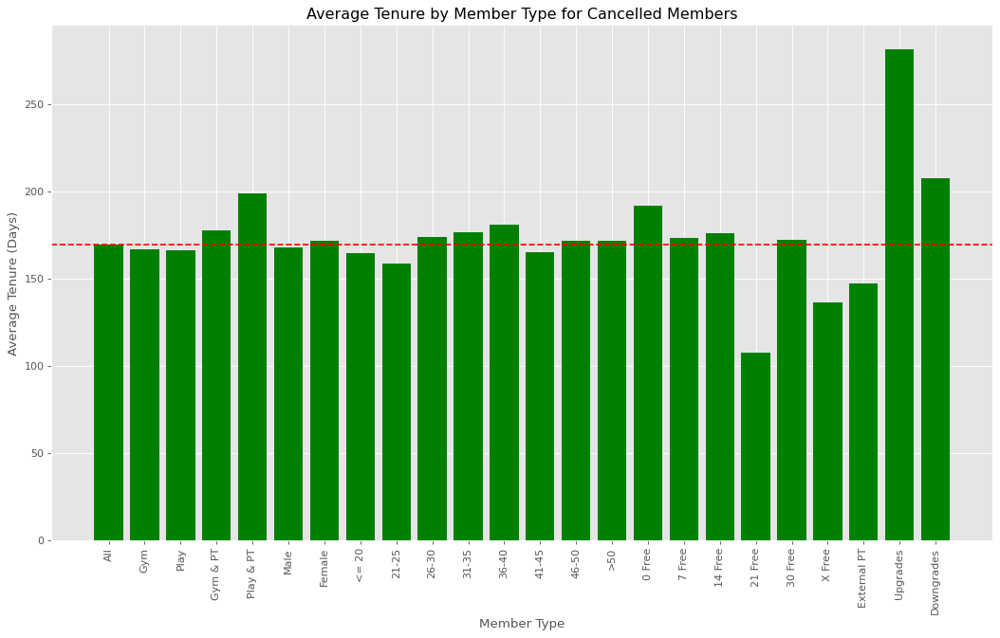

In [179]:
y = []

y.append(mean(cancelled_tenure))
y.append(mean(cancelled_gym_tenure))
y.append(mean(cancelled_play_tenure))
y.append(mean(cancelled_gym_pt_tenure))
y.append(mean(cancelled_play_pt_tenure))
y.append(mean(cancelled_male_pt_tenure))
y.append(mean(cancelled_female_pt_tenure))
y.append(mean(cancelled_tenure_less_20))
y.append(mean(cancelled_tenure_20_25))
y.append(mean(cancelled_tenure_25_30))
y.append(mean(cancelled_tenure_30_35))
y.append(mean(cancelled_tenure_35_40))
y.append(mean(cancelled_tenure_40_45))
y.append(mean(cancelled_tenure_45_50))
y.append(mean(cancelled_tenure_greater_50))
y.append(mean(cancelled_free_time_0_tenure))
y.append(mean(cancelled_free_time_7_tenure))
y.append(mean(cancelled_free_time_14_tenure))
y.append(mean(cancelled_free_time_21_tenure))
y.append(mean(cancelled_free_time_30_tenure))
y.append(mean(cancelled_free_time_X_tenure))
y.append(mean(cancelled_external_pt_tenure))
y.append(mean(cancelled_upgrades_tenure))
y.append(mean(cancelled_downgrades_tenure))
y

x = ['All','Gym','Play','Gym & PT','Play & PT','Male','Female','<= 20','21-25','26-30','31-35','36-40','41-45','46-50','>50','0 Free','7 Free','14 Free','21 Free','30 Free','X Free','External PT','Upgrades','Downgrades']
x_pos = [i for i, _ in enumerate(x)]


figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')

plt.axhline(y=y[0], color='r', linestyle='--')

plt.xlabel("Member Type")
plt.ylabel("Average Tenure (Days)")
plt.title("Average Tenure by Member Type for Cancelled Members")

plt.xticks(x_pos, x)
plt.xticks(rotation=90)

plt.show()

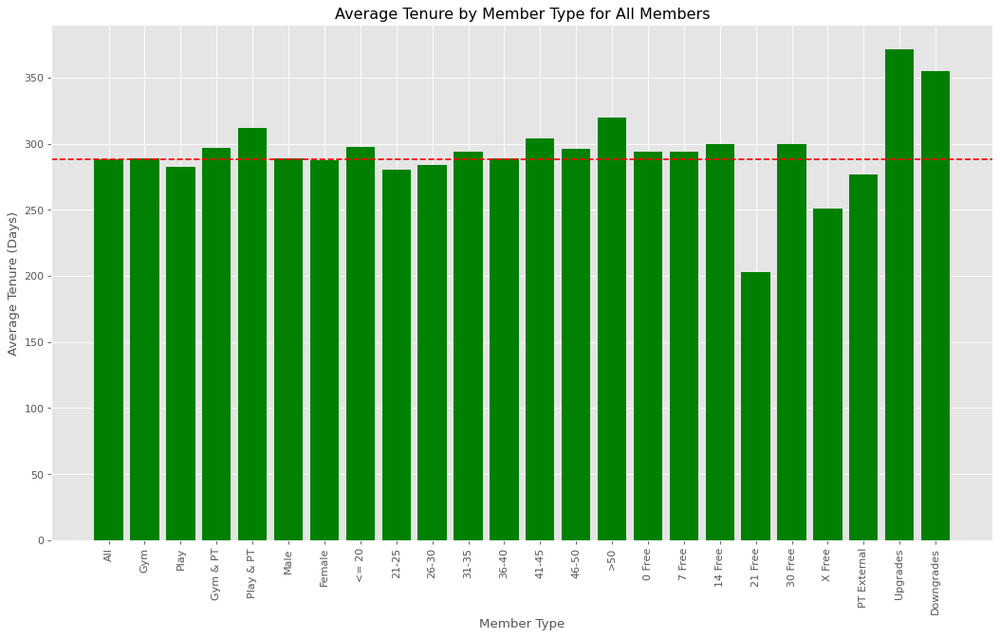

In [180]:
y = []

y.append(mean(tenure))
y.append(mean(gym_tenure))
y.append(mean(play_tenure))
y.append(mean(gym_pt_tenure))
y.append(mean(play_pt_tenure))
y.append(mean(male_pt_tenure))
y.append(mean(female_pt_tenure))
y.append(mean(tenure_less_20))
y.append(mean(tenure_20_25))
y.append(mean(tenure_25_30))
y.append(mean(tenure_30_35))
y.append(mean(tenure_35_40))
y.append(mean(tenure_40_45))
y.append(mean(tenure_45_50))
y.append(mean(tenure_greater_50))
y.append(mean(free_time_0_tenure))
y.append(mean(free_time_7_tenure))
y.append(mean(free_time_14_tenure))
y.append(mean(free_time_21_tenure))
y.append(mean(free_time_30_tenure))
y.append(mean(free_time_X_tenure))
y.append(mean(external_pt_tenure))
y.append(mean(upgrades_tenure))
y.append(mean(downgrades_tenure))
y

x = ['All','Gym','Play','Gym & PT','Play & PT','Male','Female','<= 20','21-25','26-30','31-35','36-40','41-45','46-50','>50','0 Free','7 Free','14 Free','21 Free','30 Free','X Free','PT External','Upgrades','Downgrades']
x_pos = [i for i, _ in enumerate(x)]


figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')

plt.axhline(y=y[0], color='r', linestyle='--')

plt.xlabel("Member Type")
plt.ylabel("Average Tenure (Days)")
plt.title("Average Tenure by Member Type for All Members")

plt.xticks(x_pos, x)
plt.xticks(rotation=90)

plt.show()

<AxesSubplot:title={'center':'Tenure by Member Type'}, xlabel='Type', ylabel='Tenure (Days)'>

<Figure size 1280x720 with 0 Axes>

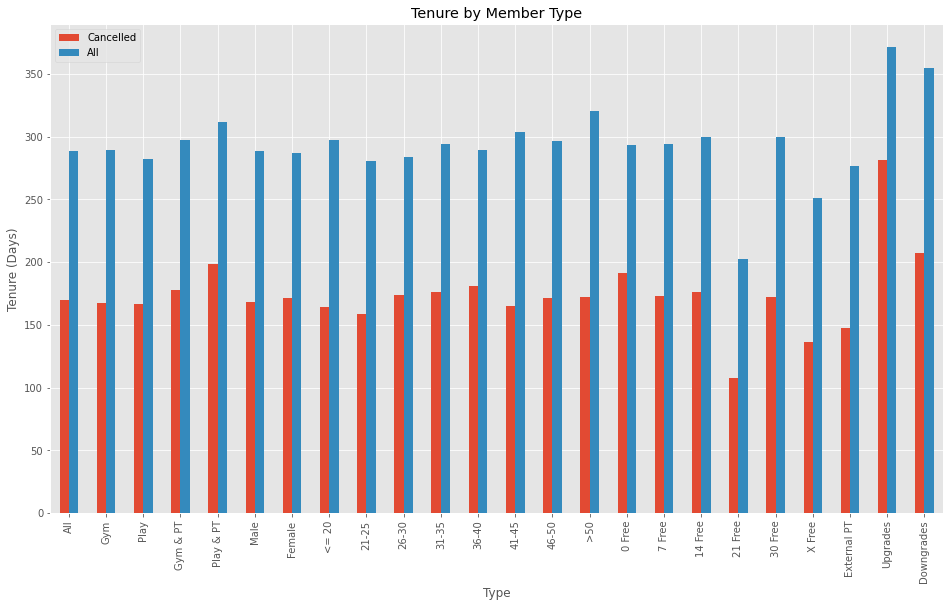

In [181]:
GRAPH_DATA = pd.DataFrame({
   'Type' : ['All','Gym','Play','Gym & PT','Play & PT','Male','Female','<= 20','21-25','26-30','31-35','36-40','41-45','46-50','>50','0 Free','7 Free','14 Free','21 Free','30 Free','X Free','External PT','Upgrades','Downgrades'],
    'All': [mean(tenure),mean(gym_tenure),mean(play_tenure),mean(gym_pt_tenure),mean(play_pt_tenure),mean(male_pt_tenure),mean(female_pt_tenure),mean(tenure_less_20),mean(tenure_20_25),mean(tenure_25_30),mean(tenure_30_35),mean(tenure_35_40),mean(tenure_40_45),mean(tenure_45_50),mean(tenure_greater_50),mean(free_time_0_tenure),mean(free_time_7_tenure),mean(free_time_14_tenure),mean(free_time_21_tenure),mean(free_time_30_tenure),mean(free_time_X_tenure),mean(external_pt_tenure),mean(upgrades_tenure),mean(downgrades_tenure)],
    'Cancelled': [mean(cancelled_tenure),mean(cancelled_gym_tenure),mean(cancelled_play_tenure),mean(cancelled_gym_pt_tenure),mean(cancelled_play_pt_tenure),mean(cancelled_male_pt_tenure),mean(cancelled_female_pt_tenure),mean(cancelled_tenure_less_20),mean(cancelled_tenure_20_25),mean(cancelled_tenure_25_30),mean(cancelled_tenure_30_35),mean(cancelled_tenure_35_40),mean(cancelled_tenure_40_45),mean(cancelled_tenure_45_50),mean(cancelled_tenure_greater_50),mean(cancelled_free_time_0_tenure),mean(cancelled_free_time_7_tenure),mean(cancelled_free_time_14_tenure),mean(cancelled_free_time_21_tenure),mean(cancelled_free_time_30_tenure),mean(cancelled_free_time_X_tenure),mean(cancelled_external_pt_tenure),mean(cancelled_upgrades_tenure),mean(cancelled_downgrades_tenure)]
})

GRAPH_DATA

figure(figsize=(16, 9), dpi=80)
GRAPH_DATA.plot(x="Type", y=["Cancelled","All"], kind="bar", figsize=(16,9),title='Tenure by Member Type', ylabel='Tenure (Days)')


In [95]:
print(len(cancellations))
for index, row in cancellations.iterrows():
    if row['reasonForCancellation'] is not None:
        cancellations.loc[index,'reasonForCancellation'] = row['reasonForCancellation'].title()


34787


In [96]:
cancellations.head()

,createDate,firstName,lastName,phone,email,gymName,membershipType,eligibilityCheck,reasonForCancellation
0,2020-08-26 05:56:32,Clint,Test,61413506306,clint@thefitnessplayground.com.au,The Bunker,Play,Outside of Contract Minimum Term,Lack Of Motivation
1,2020-08-29 23:47:43,Emma,Kelly,61402889028,emma3kelly@gmail.com,Surry Hills,Play,Outside of Contract Minimum Term,Relocating
2,2020-08-30 01:43:02,Ben,Whiteley,61432575436,b.whiteley94@hotmail.com,The Bunker,Gym,Within Contract Minimum Term,Relocating
3,2020-08-30 03:05:13,Aslan,Bedak-Stone,61432766123,chicken_death@hotmail.com,Newtown,Gym,Outside of Contract Minimum Term,Medical: Unable To Exercise For 6+ Months
4,2020-08-31 01:15:46,Byron,Mackenzie,61468680064,byronmac@me.com,Newtown,Gym,Outside of Contract Minimum Term,Relocating


In [97]:
cancellations.groupby('reasonForCancellation').agg({'gymName':'count'}).sort_values(by='gymName')

,gymName
reasonForCancellation,
,1
Nan,1
Other,627
Poor Experience,1148
Medical: Unable To Exercise For 6+ Months,1810
Financial,4252
Lack Of Motivation,4462
Relocating,22484


<AxesSubplot:title={'center':'Reason For Cancellation'}, xlabel='Cancellation Reason'>

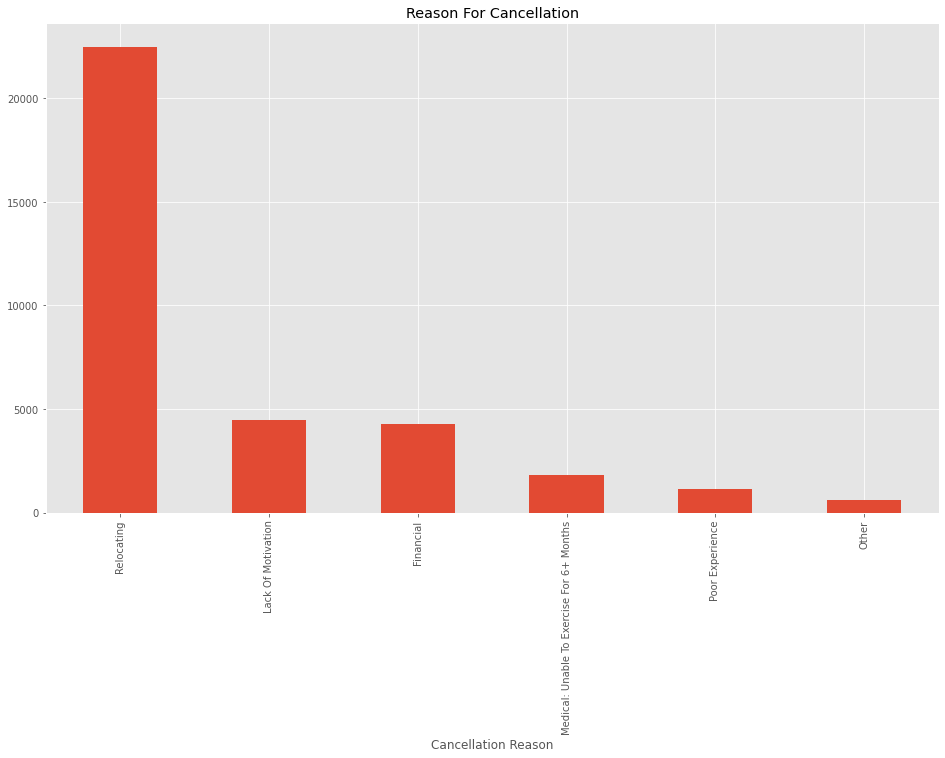

In [98]:
cxl_reason = cancellations.groupby('reasonForCancellation').agg({'gymName':'count'}).sort_values(by='gymName',ascending=False)
cxl_reason[cxl_reason['gymName'] > 10].plot(kind="bar", figsize=(16,9),title='Reason For Cancellation', xlabel='Cancellation Reason',legend=False)


In [304]:
cxl_reason['%'] = None
for i, r in cxl_reason[cxl_reason['gymName'] > 10].iterrows():
    cxl_reason.loc[i,'%'] = r['gymName'] / sum(cxl_reason['gymName'])
    
cxl_reason

,gymName,%
reasonForCancellation,,
Relocating,22484,0.646371
Lack Of Motivation,4462,0.128274
Financial,4252,0.122237
Medical: Unable To Exercise For 6+ Months,1810,0.0520339
Poor Experience,1148,0.0330027
Other,627,0.018025
,1,None
Nan,1,None


<AxesSubplot:title={'center':'Cancellation In and Out of Contract'}, xlabel='Eligibility Check'>

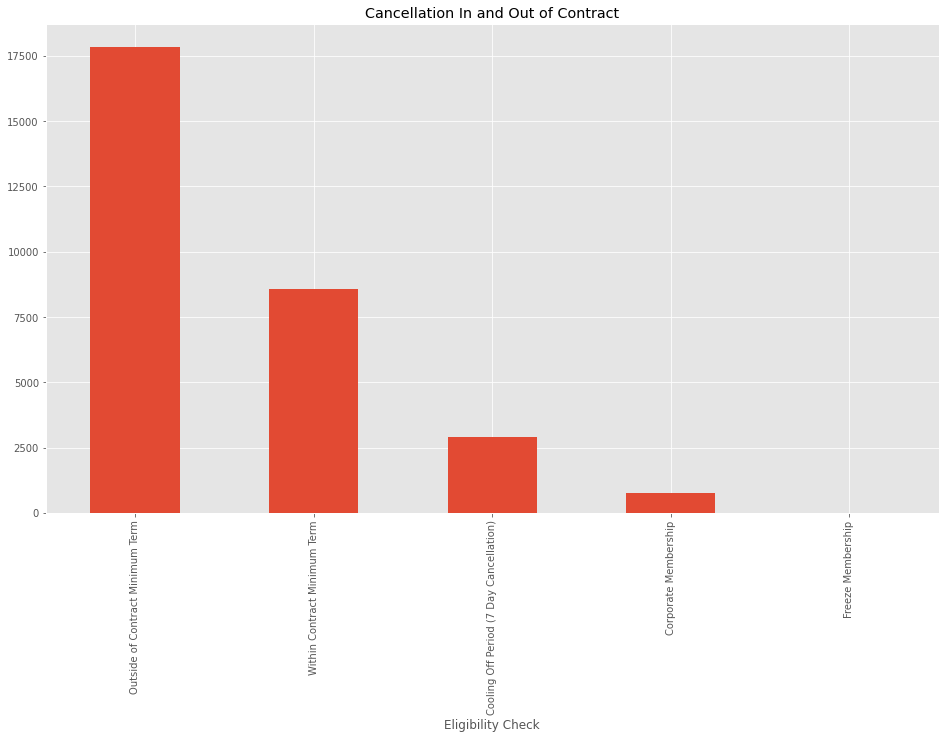

In [99]:
cancellations['eligibilityCheck'].unique()
cxl_eligible = cancellations.groupby('eligibilityCheck').agg({'gymName':'count'}).sort_values(by='gymName',ascending=False)
cxl_eligible.plot(kind="bar", figsize=(16,9),title='Cancellation In and Out of Contract', xlabel='Eligibility Check',legend=False)


In [303]:
cxl_eligible['%'] = None
for i, r in cxl_eligible.iterrows():
    cxl_eligible.loc[i,'%'] = r['gymName'] / sum(cxl_eligible['gymName'])
    
cxl_eligible

,gymName,%
eligibilityCheck,,
Outside of Contract Minimum Term,17844,0.593909
Within Contract Minimum Term,8567,0.285139
Cooling Off Period (7 Day Cancellation),2889,0.0961558
Corporate Membership,740,0.0246297
Freeze Membership,5,0.000166417


In [105]:
data[1023]

{'id': 1115,
 'gymName': 'Surry Hills',
 'memberContracts': '317,127,120',
 'createDate': '2020-02-17 18:48:47',
 'locationId': None,
 'phone': '+61456777899',
 'firstName': 'Isabel',
 'lastName': 'Burns',
 'email': 'izzy.burns@hotmail.com',
 'postcode': None,
 'dob': '1999-06-01',
 'gender': 'female',
 'howDidYouHearAboutUs': 'wordOfMouth',
 'numberOneGoal': 'fitness',
 'paymentType': 'creditCard',
 'gymOrPlay': 'play',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2020-02-17',
 'trainingStarterPack': 'ptPack',
 'numberSessionsPerWeek': '',
 'daysFree': '7DaysFree',
 'accessKeyDiscount': 'Key79',
 'freePTPack': 'FreePTPack',
 'staffMember': None,
 'accessKeyNumber': 'BA01535',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'mon,sun',
 'timeAvailability': 'afterWork',
 'mboUniqueId': '100062724',
 'preExId': None,
 'age': 20.0,
 'free time visits': 0,
 '7 day visits': 3,
 '14 day visits': 6,
 '21 day visits': 8,
 '28 day visits': 12,
 '35 day visits': 15,


In [ ]:
enrolments.head()
# cancellations.head()

In [108]:
CNT = 0
# early_cxl = pd.DataFrame(columns=enrolments.columns)
early_cxl = []
_list = []
for d in tqdm(data):
    if d['tenure'] is not None and d['tenure'] <= 30:
        CNT += 1
        early_cxl.append(d)
        
#     C = cancellations[cancellations['email'] == d['email']]
#     if len(C) > 0:
#         diff = pd.to_datetime(C.iloc[len(C) - 1]['createDate']) - pd.to_datetime(d['startDate'])
        
#         if diff.days <= 30:
#             CNT += 1
# #             early_cxl.concat(row)
#             early_cxl.append(d)
# #             _list.append(e_index)
        
        
print(f"{CNT/len(data)}")
early_cxl

100%|██████████| 8061/8061 [00:00<00:00, 1307739.02it/s]


0.041310011164867884


[{'id': 27,
  'gymName': 'Marrickville',
  'memberContracts': '188,120',
  'createDate': '2019-09-25 16:36:03',
  'locationId': None,
  'phone': '+61406635524',
  'firstName': 'Pablo',
  'lastName': 'Tancredi',
  'email': 'pablot19@hotmail.com',
  'postcode': None,
  'dob': '1989-02-07',
  'gender': 'male',
  'howDidYouHearAboutUs': 'google',
  'numberOneGoal': 'feelBetter',
  'paymentType': 'bankAccount',
  'gymOrPlay': 'gym',
  'ddOrPif': 'dd',
  'noCommitment': 'noCommitment',
  'startDate': '2019-09-25',
  'trainingStarterPack': 'fitnessGuru',
  'numberSessionsPerWeek': '',
  'daysFree': '7DaysFree',
  'accessKeyDiscount': 'Key30',
  'freePTPack': '',
  'staffMember': None,
  'accessKeyNumber': '44306',
  'injuries': True,
  'medical': True,
  'trainingAvailability': 'any',
  'timeAvailability': 'anytime',
  'mboUniqueId': '100058300',
  'preExId': None,
  'age': 30.0,
  'free time visits': 0,
  '7 day visits': 4,
  '14 day visits': 4,
  '21 day visits': 4,
  '28 day visits': 4,
  

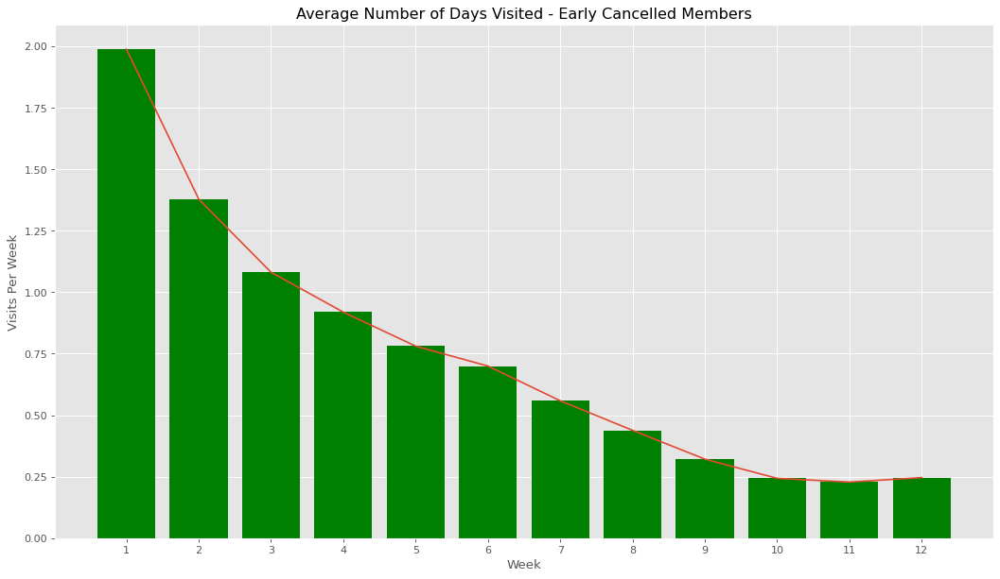

In [111]:
early_cxl_visits_wk_1 = []
early_cxl_visits_wk_2 = []
early_cxl_visits_wk_3 = []
early_cxl_visits_wk_4 = []
early_cxl_visits_wk_5 = []
early_cxl_visits_wk_6 = []
early_cxl_visits_wk_7 = []
early_cxl_visits_wk_8 = []
early_cxl_visits_wk_9 = []
early_cxl_visits_wk_10 = []
early_cxl_visits_wk_11 = []
early_cxl_visits_wk_12 = []

for d in early_cxl:
    
    early_cxl_visits_wk_1.append(d['7 day visits'])
    early_cxl_visits_wk_2.append(d['14 day visits'] - d['7 day visits'])
    early_cxl_visits_wk_3.append(d['21 day visits'] - d['14 day visits'])
    early_cxl_visits_wk_4.append(d['28 day visits'] - d['21 day visits'])
    early_cxl_visits_wk_5.append(d['35 day visits'] - d['28 day visits'])
    early_cxl_visits_wk_6.append(d['42 day visits'] - d['35 day visits'])
    early_cxl_visits_wk_7.append(d['49 day visits'] - d['42 day visits'])
    early_cxl_visits_wk_8.append(d['56 day visits'] - d['49 day visits'])
    early_cxl_visits_wk_9.append(d['63 day visits'] - d['56 day visits'])
    early_cxl_visits_wk_10.append(d['70 day visits'] - d['63 day visits'])
    early_cxl_visits_wk_11.append(d['77 day visits'] - d['70 day visits'])
    early_cxl_visits_wk_12.append(d['84 day visits'] - d['77 day visits'])
    
y = []
y.append(mean(early_cxl_visits_wk_1))
y.append(mean(early_cxl_visits_wk_2))
y.append(mean(early_cxl_visits_wk_3))
y.append(mean(early_cxl_visits_wk_4))
y.append(mean(early_cxl_visits_wk_5))
y.append(mean(early_cxl_visits_wk_6))
y.append(mean(early_cxl_visits_wk_7))
y.append(mean(early_cxl_visits_wk_8))
y.append(mean(early_cxl_visits_wk_9))
y.append(mean(early_cxl_visits_wk_10))
y.append(mean(early_cxl_visits_wk_11))
y.append(mean(early_cxl_visits_wk_12))

x = [1,2,3,4,5,6,7,8,9,10,11,12]
x_pos = [i for i, _ in enumerate(x)]


figure(figsize=(16, 9), dpi=80)

plt.bar(x_pos, y, color='green')
plt.xlabel("Week")
plt.ylabel("Visits Per Week")
plt.title("Average Number of Days Visited - Early Cancelled Members")

plt.xticks(x_pos, x)

x_new = x_pos
a_BSpline = scipy.interpolate.make_interp_spline(x_pos, y)
y_new = a_BSpline(x_new)

plt.plot(x_new, y_new)

plt.show()

In [113]:
mean(early_cxl_visits_wk_12)

0.24624624624624625

<AxesSubplot:title={'center':'Average PT External Weekly Visits by Week'}, xlabel='Week', ylabel='Average Visits'>

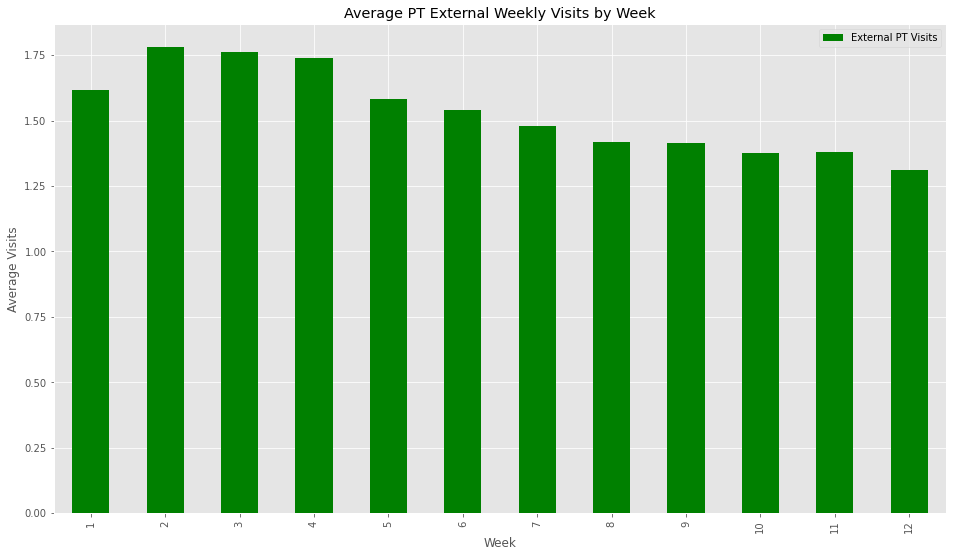

In [151]:
external_pt.columns
['level_0', 'index', 'id', 'formId', 'uniqueId', 'createDate',
       'firstName', 'lastName', 'phone', 'email', 'personalTrainerName',
       'externalClient', 'numberOfSessions', 'thirtyMinSessions',
       'sessionsPerFortnight', 'pricePerSession', 'fnDD', 'todayDate',
       'firstDebitDate', 'numProRataSessions', 'todaysTotal', 'staffName',
       'proRataPaymentOptions', 'attachPreExerciseQuestionnaire',
       'payTodayPaymentOptions', 'personalTrainingPaymentDetails',
       'accountName', 'financialInstitiution', 'bsb', 'accountNumber',
       'accountType', 'creditCard', 'expirationDate', 'cardVerificationCode',
       'agreement', 'signature', 'notes', 'gymName', 'status', 'mboUniqueId',
       'free time visits', '7 day visits', '14 day visits', '21 day visits',
       '28 day visits', '35 day visits', '42 day visits', '49 day visits',
       '56 day visits', '63 day visits', '70 day visits', '77 day visits',
       '84 day visits', '3 mt visits', '6 mt visits', '>6 mt visits',
       'total visits']

external_pt_visits_wk_1 = []
external_pt_visits_wk_2 = []
external_pt_visits_wk_3 = []
external_pt_visits_wk_4 = []
external_pt_visits_wk_5 = []
external_pt_visits_wk_6 = []
external_pt_visits_wk_7 = []
external_pt_visits_wk_8 = []
external_pt_visits_wk_9 = []
external_pt_visits_wk_10 = []
external_pt_visits_wk_11 = []
external_pt_visits_wk_12 = []

for index, row in external_pt.iterrows():
    external_pt_visits_wk_1.append(row['7 day visits'])
    external_pt_visits_wk_2.append(row['14 day visits'] - row['7 day visits'])
    external_pt_visits_wk_3.append(row['21 day visits'] - row['14 day visits'])
    external_pt_visits_wk_4.append(row['28 day visits'] - row['21 day visits'])
    external_pt_visits_wk_5.append(row['35 day visits'] - row['28 day visits'])
    external_pt_visits_wk_6.append(row['42 day visits'] - row['35 day visits'])
    external_pt_visits_wk_7.append(row['49 day visits'] - row['42 day visits'])
    external_pt_visits_wk_8.append(row['56 day visits'] - row['49 day visits'])
    external_pt_visits_wk_9.append(row['63 day visits'] - row['56 day visits'])
    external_pt_visits_wk_10.append(row['70 day visits'] - row['63 day visits'])
    external_pt_visits_wk_11.append(row['77 day visits'] - row['70 day visits'])
    external_pt_visits_wk_12.append(row['84 day visits'] - row['77 day visits'])

# mean(external_pt['7 day visits'])
# external_pt_visits_wk_1

GRAPH_DATA = pd.DataFrame({
   'Week' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'External PT Visits': [mean(external_pt_visits_wk_1),mean(external_pt_visits_wk_2),mean(external_pt_visits_wk_3),mean(external_pt_visits_wk_4),mean(external_pt_visits_wk_5),mean(external_pt_visits_wk_6),mean(external_pt_visits_wk_7),mean(external_pt_visits_wk_8),mean(external_pt_visits_wk_9),mean(external_pt_visits_wk_10),mean(external_pt_visits_wk_11),mean(external_pt_visits_wk_12)],
})

# GRAPH_DATA

GRAPH_DATA.plot(x="Week", y=["External PT Visits"], kind="bar", figsize=(16,9), title='Average PT External Weekly Visits by Week', ylabel='Average Visits',color='green')


In [170]:
external_pt['tenure'] = None
external_pt_tenure = []
cancelled_external_pt_tenure = []
for index, row in tqdm(external_pt.iterrows()):
    for d in data:
        if str(row['mboUniqueId']) == str(d['mboUniqueId']) and d['tenure'] is not None:
            external_pt.loc[index,'tenure'] = d['tenure']
            external_pt_tenure.append(d['tenure'])
            
            if d['isActive'] == False:
                cancelled_external_pt_tenure.append(d['tenure'])

# external_pt.head(20)
print(f":external_pt_tenure {mean(external_pt_tenure)} | cancelled_external_pt_tenure: {mean(cancelled_external_pt_tenure)}")


/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
615it [00:19, 31.39it/s]

:external_pt_tenure 276.46700507614213 | cancelled_external_pt_tenure: 147.22058823529412


In [171]:
upgrades['tenure'] = None
upgrades_tenure = []
cancelled_upgrades_tenure = []

for index, row in upgrades.iterrows():
    for d in data:
        if str(row['mboUniqueId']) == str(d['mboUniqueId']) and d['tenure'] is not None:
            upgrades.loc[index,'tenure'] = d['tenure']
            upgrades_tenure.append(d['tenure'])
            
            if d['isActive'] == False:
                cancelled_upgrades_tenure.append(d['tenure'])

print(f"upgrades_tenure: {mean(upgrades_tenure)} | cancelled_upgrades_tenure: {mean(cancelled_upgrades_tenure)}")

/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


upgrades_tenure: 371.25 | cancelled_upgrades_tenure: 281.5


In [178]:

downgrades['tenure'] = None
downgrades_tenure = []
cancelled_downgrades_tenure = []

for index, row in downgrades.iterrows():
    for d in data:
        if str(row['mboUniqueId']) == str(d['mboUniqueId']) and d['tenure'] is not None:
            downgrades.loc[index,'tenure'] = d['tenure']
            downgrades_tenure.append(d['tenure'])
            
            if d['isActive'] == False:
                cancelled_downgrades_tenure.append(d['tenure'])

print(f"upgrades_tenure: {mean(downgrades_tenure)} | cancelled_upgrades_tenure: {mean(cancelled_downgrades_tenure)}")


/Users/clintsellen/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


upgrades_tenure: 354.5660377358491 | cancelled_upgrades_tenure: 207.61290322580646


In [162]:
data[100]

{'id': 118,
 'gymName': 'Marrickville',
 'memberContracts': '187,120',
 'createDate': '2019-10-14 16:37:49',
 'locationId': None,
 'phone': '+61490784928',
 'firstName': 'Spencer',
 'lastName': 'Wilson',
 'email': 'preferredcarpentry@yahoo.com',
 'postcode': None,
 'dob': '1973-05-19',
 'gender': 'male',
 'howDidYouHearAboutUs': 'other',
 'numberOneGoal': 'feelBetter',
 'paymentType': 'bankAccount',
 'gymOrPlay': 'gym',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2019-10-14',
 'trainingStarterPack': 'fitnessGuru',
 'numberSessionsPerWeek': '',
 'daysFree': '14DaysFree',
 'accessKeyDiscount': 'Key30',
 'freePTPack': '',
 'staffMember': None,
 'accessKeyNumber': '42307',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'any',
 'timeAvailability': 'afterWork',
 'mboUniqueId': '100058826',
 'preExId': None,
 'age': 46.0,
 'free time visits': 0,
 '7 day visits': 1,
 '14 day visits': 3,
 '21 day visits': 6,
 '28 day visits': 8,
 '35 day visits': 8,
 '42 day visi

In [183]:
STARTER_PACKS = []
PT_PACK_ENROLMENTS = []
for d in data:
#     if d['trainingStarterPack'] not in STARTER_PACKS:
#         STARTER_PACKS.append(d['trainingStarterPack'])
    if d['trainingStarterPack'] == 'ptPack':
        PT_PACK_ENROLMENTS.append(d)
        
STARTER_PACKS
len(PT_PACK_ENROLMENTS)

2931

In [197]:
PT_PACK_ENROLMENTS[10]

{'id': 35,
 'gymName': 'Marrickville',
 'memberContracts': '187,127,120',
 'createDate': '2019-09-26 12:40:35',
 'locationId': None,
 'phone': '+61415861503',
 'firstName': 'Quang Truong',
 'lastName': 'Chu',
 'email': 'harrychu153@gmail.com',
 'postcode': None,
 'dob': '1999-03-15',
 'gender': 'male',
 'howDidYouHearAboutUs': 'google',
 'numberOneGoal': 'fitness',
 'paymentType': 'creditCard',
 'gymOrPlay': 'gym',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2019-09-26',
 'trainingStarterPack': 'ptPack',
 'numberSessionsPerWeek': '',
 'daysFree': '14DaysFree',
 'accessKeyDiscount': 'Key79',
 'freePTPack': 'FreePTPack',
 'staffMember': None,
 'accessKeyNumber': '44380',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'tues,fri,sun',
 'timeAvailability': 'anytime',
 'mboUniqueId': '100058317',
 'preExId': None,
 'age': 20.0,
 'free time visits': 0,
 '7 day visits': 3,
 '14 day visits': 7,
 '21 day visits': 9,
 '28 day visits': 10,
 '35 day visits': 11,
 '42

In [225]:
URL = 'client/clientvisits'
pt_pack_visits = {}

d = PT_PACK_ENROLMENTS[10]

for d in tqdm(PT_PACK_ENROLMENTS):

    if d['mboUniqueId'] is not None:
        CLIENT = mbo_clients[mbo_clients['UniqueId'] == int(d['mboUniqueId'])]

        if len(CLIENT) == 1:
            OFFSET = 0
            COUNT = 0
            LIMIT = 100
            TOTAL_RESULTS = 1
            isValid = True
            VISITS = []

            while isValid:
                PARAMS = {
                    'ClientId': CLIENT['Id'].values[0],
                    'StartDate' : pd.to_datetime(d['createDate']).strftime("%Y-%m-%dT%H:%M:%S"),
                    'limit' : LIMIT,
                    'offset' : OFFSET
                }
                res = mbo_get_request(URL, PARAMS)

                if res is not None:
                    for v in res['Visits']:
                        VISITS.append(v)

                    TOTAL_RESULTS = res['PaginationResponse']['TotalResults']
                    COUNT = COUNT + res['PaginationResponse']['PageSize'] 
                    OFFSET = OFFSET + LIMIT
                    if OFFSET > TOTAL_RESULTS:
                        isValid = False
                else:
                    isValid = False

            pt_pack_visits[d['mboUniqueId']] = VISITS



 95%|█████████▌| 2793/2931 [38:10<01:53,  1.22it/s]  

HTTP error: 400 Client Error: Bad Request for url: https://api.mindbodyonline.com/public/v6/client/clientvisits?ClientId=53710&StartDate=2021-02-16T17%3A26%3A13&limit=100&offset=0


TypeError: 'HTTPError' object is not subscriptable

In [219]:
PARAMS

{'ClientId': '44380',
 'StartDate': '2019-09-26T12:40:35',
 'limit': 100,
 'offset': 0}

In [228]:
pt_pack_visits['100062904']

[{'AppointmentId': 0,
  'AppointmentGenderPreference': 'None',
  'AppointmentStatus': 'NoShow',
  'ClassId': 0,
  'ClientId': 'BA00273',
  'StartDateTime': '2020-03-02T20:25:00',
  'EndDateTime': '2020-03-02T20:25:00',
  'Id': 3890961,
  'LastModifiedDateTime': '2020-03-02T09:25:23.3Z',
  'LateCancelled': False,
  'SiteId': 152065,
  'LocationId': 3,
  'MakeUp': False,
  'Name': 'Arrival',
  'ServiceId': 1860366,
  'ServiceName': 'First 14 Days',
  'ProductId': 10376,
  'SignedIn': True,
  'StaffId': 1,
  'WebSignup': False,
  'Action': 'None',
  'Missed': False,
  'VisitType': -2,
  'TypeGroup': 24,
  'TypeTaken': 'First 14 Days'},
 {'AppointmentId': 0,
  'AppointmentGenderPreference': 'None',
  'AppointmentStatus': 'NoShow',
  'ClassId': 0,
  'ClientId': 'BA00273',
  'StartDateTime': '2020-03-04T12:13:00',
  'EndDateTime': '2020-03-04T12:13:00',
  'Id': 3898999,
  'LastModifiedDateTime': '2020-03-04T01:13:26.4Z',
  'LateCancelled': False,
  'SiteId': 152065,
  'LocationId': 3,
  'Mak

[{'id': 14,
  'gymName': 'Marrickville',
  'memberContracts': '187,120',
  'createDate': '2019-09-23 15:46:10',
  'locationId': None,
  'phone': '+61410992191',
  'firstName': 'Dylan',
  'lastName': 'Matos',
  'email': 'dcmatos02@gmail.com',
  'postcode': None,
  'dob': '2002-07-07',
  'gender': 'male',
  'howDidYouHearAboutUs': 'other',
  'numberOneGoal': 'buildMuscle',
  'paymentType': 'creditCard',
  'gymOrPlay': 'gym',
  'ddOrPif': 'dd',
  'noCommitment': '12Month',
  'startDate': '2019-09-24',
  'trainingStarterPack': 'fitnessGuru',
  'numberSessionsPerWeek': '',
  'daysFree': '7DaysFree',
  'accessKeyDiscount': 'Key30',
  'freePTPack': '',
  'staffMember': None,
  'accessKeyNumber': '44984',
  'injuries': True,
  'medical': True,
  'trainingAvailability': 'sun',
  'timeAvailability': 'anytime',
  'mboUniqueId': '100058200',
  'preExId': None,
  'age': 17.0,
  'free time visits': 0,
  '7 day visits': 1,
  '14 day visits': 5,
  '21 day visits': 5,
  '28 day visits': 7,
  '35 day vi

In [262]:
SERVICE_NAMES = []
TYPE_TAKEN = []
PT_PACK_VISITS = {}

for KEY in pt_pack_visits.keys():
#     print(f"{KEY}: {len(pt_pack_visits[KEY])}")

    VISITS = []
            
    for v in pt_pack_visits[KEY]:
        
#         if v['ServiceName'] not in SERVICE_NAMES:
#             SERVICE_NAMES.append(v['ServiceName'])
            
#         if v['TypeTaken'] not in TYPE_TAKEN:
#             TYPE_TAKEN.append(v['TypeTaken'])

        if v['ServiceName'] in ['PT Pack','Packs: FP Coach Pack','Bunker Packs: PT Pack'] and v['AppointmentStatus'] == 'Completed':
            VISITS.append(v)
            
    PT_PACK_VISITS[KEY] = VISITS
            

In [ ]:
pt_ongoing_data

In [240]:
PT_PACK_VISITS

{'100058239': [{'AppointmentId': 459024,
   'AppointmentGenderPreference': 'None',
   'AppointmentStatus': 'Completed',
   'ClassId': 0,
   'ClientId': '44947',
   'StartDateTime': '2019-09-26T17:45:00',
   'EndDateTime': '2019-09-26T18:25:00',
   'Id': 3330760,
   'LastModifiedDateTime': '2019-10-28T03:44:28.3Z',
   'LateCancelled': False,
   'SiteId': 152065,
   'LocationId': 3,
   'MakeUp': False,
   'Name': 'FP Coach | Starter Pack',
   'ServiceId': 1686896,
   'ServiceName': 'Packs: FP Coach Pack',
   'ProductId': 10231,
   'SignedIn': True,
   'StaffId': 100000707,
   'WebSignup': False,
   'Action': 'None',
   'Missed': False,
   'VisitType': 138,
   'TypeGroup': 5,
   'TypeTaken': 'Packs: PT Pack'},
  {'AppointmentId': 459025,
   'AppointmentGenderPreference': 'None',
   'AppointmentStatus': 'Completed',
   'ClassId': 0,
   'ClientId': '44947',
   'StartDateTime': '2019-10-04T12:40:00',
   'EndDateTime': '2019-10-04T13:20:00',
   'Id': 3330784,
   'LastModifiedDateTime': '2019-

In [265]:
for KEY in tqdm(PT_PACK_VISITS.keys()):
    print(len(PT_PACK_VISITS[KEY]))
    if len(PT_PACK_VISITS[KEY]) > 2:
        print(PT_PACK_VISITS[KEY])
#         print()
    

 44%|████▍     | 1089/2486 [00:00<00:00, 8920.15it/s]

2
0
0
0
1
0
0
0
0
0
0
2
1
0
1
0
0
2
2
0
0
0
0
0
0
0
0
0
2
0
0
2
0
1
0
1
2
0
0
0
2
0
1
1
0
0
0
2
0
0
0
0
0
0
0
0
0
2
0
2
0
0
0
0
0
0
0
0
1
0
0
2
0
0
1
0
0
2
0
0
0
0
1
0
0
0
1
0
2
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
2
2
2
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
1
0
0
1
0
0
1
0
1
0
0
0
2
1
0
0
0
2
1
0
0
0
2
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
1
0
0
0
0
0
2
1
0
0
0
0
2
0
2
2
2
1
0
1
0
0
0
0
0
0
0
2
1
0
1
0
0
1
0
0
0
0
0
0
2
1
1
0
1
1
0
0
1
1
0
1
0
2
0
1
2
0
0
0
0
2
0
2
2
0
0
0
2
0
0
0
0
0
2
0
1
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
1
0
1
0
0
0
1
0
2
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
2
0
1
0
1
2
1
0
0
0
0
2
1
1
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
1
1
2
0
0
0
0
1
0
1
2
2
0
0
0
1
0
0
0
0
0
0
0
1
0
0
0
1
0
2
0
1
0
0
0
0
0
0
0
2
0
0
1
0
2
0
0
0
0
1
1
0
0
0
0
2
0
0
0
1
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
1
1
1
0
0
0
0
2
1
0
0
0
0
0
0
0
1
2
0
0
0
1
0
0
2
1
0
0
0
1


100%|██████████| 2486/2486 [00:00<00:00, 8111.03it/s]


0
0
0
0
0
0
0
2
0
0
2
0
0
2
0
1
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
2
1
0
0
2
0
0
0
0
2
0
2
2
0
1
0
0
0
0
0
1
2
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
2
0
0
0
0
0
1
0
1
0
0
1
0
0
0
0
0
0
0
0
2
0
0
0
0
1
0
0
0
0
1
0
0
0
0
0
1
2
2
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
2
0
0
0
0
0
2
0
0
0
0
0
0
2
1
2
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
2
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
1
1
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
2
0
0
1
0
0
0
1
0
0
0
0
0
2
0
2
2
0
0
0
0
0
1
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
2
2
0
0
0
0
0
0
0
0
1
1
0
0
2
0
0
0
0
0
0
0
0
0
1
0
2
0
2
1
0
0
0
0
0
2
1
0
1
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
1
1
0
0
0
0
0
2
0
0
1
2
0
0
0
0
1
2
0
0
0
0
0
1
0
1
0
0
1
0
0
0
2
0
0
0
2
2
0
0
2
0
0
2
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
1
2
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0

In [278]:

CONVERTED_PT_PACT_IDS = []
PT_PACK_DATA = []

for KEY in tqdm(PT_PACK_VISITS.keys()):
    DATA = None
    for d in data:
        if d['mboUniqueId'] == KEY:
            DATA = d
    if DATA is not None:
        
        X = {
            'mboUniqueId': DATA['mboUniqueId'],
            'EnrolmentDate': DATA['createDate'],
            'Tenure': DATA['tenure'],
            'PtOngoingId': None,
            'TimeToConvert': None,
            'CompletedSession1': False,
            'TimeToSession1': None,
            'StartDateTimeSession1': None,
            'CompletedSession2': None,
            'TimeToSession2': None,
            'StartDateTimeSession2': None,
            'isActive': DATA['isActive']
        }
        
#         pt_enrol = pt_ongoing_data[(pt_ongoing_data['firstName'] == DATA['firstName']) & (pt_ongoing_data['lastName'] == DATA['lastName'])]
        pt_enrol = pt_ongoing_data[(pt_ongoing_data['email'] == DATA['email'])]
        if len(pt_enrol) > 0:
            CONVERTED_PT_PACT_IDS.append(pt_enrol.index[0])
            X['TimeToConvert'] = (pd.to_datetime(pt_ongoing_data.iloc[pt_enrol.index[0]]['createDate'])  - pd.to_datetime(DATA['createDate'])).days
            X['PtOngoingId'] = int(pt_enrol.index[0])
#             print(f"{d['mboUniqueId']} : {pt_enrol.index[0]}")


        if len(PT_PACK_VISITS[KEY]) == 1:
            X['CompletedSession1'] = True
            X['TimeToSession1'] = (pd.to_datetime(PT_PACK_VISITS[KEY][0]['StartDateTime']) - pd.to_datetime(DATA['createDate'])).days
            X['StartDateTimeSession1'] = PT_PACK_VISITS[KEY][0]['StartDateTime']
            
        if len(PT_PACK_VISITS[KEY]) == 2:
            X['CompletedSession1'] = True
            X['TimeToSession1'] = (pd.to_datetime(PT_PACK_VISITS[KEY][0]['StartDateTime']) - pd.to_datetime(DATA['createDate'])).days
            X['StartDateTimeSession1'] = PT_PACK_VISITS[KEY][0]['StartDateTime']
            X['CompletedSession2'] = True
            X['TimeToSession2'] = (pd.to_datetime(PT_PACK_VISITS[KEY][1]['StartDateTime']) - pd.to_datetime(DATA['createDate'])).days
            X['StartDateTimeSession2'] = PT_PACK_VISITS[KEY][1]['StartDateTime']
        
        PT_PACK_DATA.append(X)
            
print(f"{len(CONVERTED_PT_PACT_IDS)} / {len(PT_PACK_VISITS)} == {len(CONVERTED_PT_PACT_IDS) / len(PT_PACK_VISITS)}")
# pt_ongoing_data.iloc[CONVERTED_PT_PACT_IDS]

with open('ann_enrolment_churn_data_pt_pack.json', 'w', encoding='utf-8') as f:
    json.dump(PT_PACK_DATA, f, ensure_ascii=False, indent=4)
    
PT_PACK_DATA

100%|██████████| 2486/2486 [00:10<00:00, 231.06it/s]


379 / 2486 == 0.15245374094931616


[{'mboUniqueId': '100058239',
  'EnrolmentDate': '2019-09-24 10:28:52',
  'Tenure': 425,
  'PtOngoingId': None,
  'TimeToConvert': None,
  'CompletedSession1': True,
  'TimeToSession1': 2,
  'StartDateTimeSession1': '2019-09-26T17:45:00',
  'CompletedSession2': True,
  'TimeToSession2': 10,
  'StartDateTimeSession2': '2019-10-04T12:40:00',
  'isActive': False},
 {'mboUniqueId': '100042098',
  'EnrolmentDate': '2019-09-25 11:20:24',
  'Tenure': 713,
  'PtOngoingId': None,
  'TimeToConvert': None,
  'CompletedSession1': False,
  'TimeToSession1': None,
  'StartDateTimeSession1': None,
  'CompletedSession2': None,
  'TimeToSession2': None,
  'StartDateTimeSession2': None,
  'isActive': True},
 {'mboUniqueId': '100058283',
  'EnrolmentDate': '2019-09-25 11:54:40',
  'Tenure': 713,
  'PtOngoingId': None,
  'TimeToConvert': None,
  'CompletedSession1': False,
  'TimeToSession1': None,
  'StartDateTimeSession1': None,
  'CompletedSession2': None,
  'TimeToSession2': None,
  'StartDateTimeSess

In [295]:
ACTIVE = 0
CONVERTED = 0
SESSION_1_COMPLETED = 0
SESSION_2_COMPLETED = 0
DAYS_TO_SESSION_1 = []
DAYS_TO_SESSION_2 = []
TENURE = []
COMPLETED_SESSION_1_CONVERTED = 0
COMPLETED_SESSION_2_CONVERTED = 0
POS_PT = 0
ALL_TENURE = []
ALL_ACTIVE = 0

for d in data:
    if d['trainingStarterPack'] == 'ongoingPersonalTraining':
        POS_PT += 1
        
    if d['tenure'] is not None:   
        ALL_TENURE.append(d['tenure'])
        
    if d['isActive'] is not None and d['isActive'] == True:
        ALL_ACTIVE += 1

for d in PT_PACK_DATA:
    
    if d['Tenure'] is not None:
        TENURE.append(d['Tenure'])
    
    if d['PtOngoingId'] is not None:
        CONVERTED += 1
        
    if d['isActive'] == True:
        ACTIVE += 1
        
    if d['CompletedSession1'] == True:
        SESSION_1_COMPLETED += 1
        DAYS_TO_SESSION_1.append(d['TimeToSession1'])
        if d['PtOngoingId'] is not None:
            COMPLETED_SESSION_1_CONVERTED += 1
        
    if d['CompletedSession2'] == True:
        SESSION_2_COMPLETED += 1
        DAYS_TO_SESSION_2.append(d['TimeToSession2'])
        if d['PtOngoingId'] is not None:
            COMPLETED_SESSION_2_CONVERTED += 1
    
print(f"Active\t{round(ACTIVE/len(PT_PACK_DATA) * 100, 1)}%\nAll Active\t{round(ALL_ACTIVE/len(data) * 100, 1)}%\nPOS PT\t{round(POS_PT/len(data) *100,1)}%\nConverted to PT Ongoing\t{round(CONVERTED/len(PT_PACK_DATA) * 100, 1)}%\nCompleted Session 1 and Converted to PT Ongoing\t{round(COMPLETED_SESSION_1_CONVERTED/len(PT_PACK_DATA) * 100, 1)}%\nCompleted Session 2 and Converted to PT Ongoing\t{round(COMPLETED_SESSION_2_CONVERTED/len(PT_PACK_DATA) * 100, 1)}%\nCompleted Session 1\t{round(SESSION_1_COMPLETED/len(PT_PACK_DATA) * 100, 1)}%\nCompleted Session 2\t{round(SESSION_2_COMPLETED/len(PT_PACK_DATA) * 100, 1)}%\nAvg Days to Completed Session 1\t{round(mean(DAYS_TO_SESSION_1), 1)} days\nAvg Days to Completed Session 2\t{round(mean(DAYS_TO_SESSION_2), 1)} days\nAvg Tenure\t{round(mean(TENURE),1)} days\nAvg All Tenure\t{round(mean(ALL_TENURE),1)} days")


Active	59.4%
All Active	57.9%
POS PT	13.2%
Converted to PT Ongoing	15.2%
Completed Session 1 and Converted to PT Ongoing	6.9%
Completed Session 2 and Converted to PT Ongoing	4.7%
Completed Session 1	22.8%
Completed Session 2	12.3%
Avg Days to Completed Session 1	19.9 days
Avg Days to Completed Session 2	26.8 days
Avg Tenure	292.6 days
Avg All Tenure	288.2 days


In [287]:
data

[{'id': 14,
  'gymName': 'Marrickville',
  'memberContracts': '187,120',
  'createDate': '2019-09-23 15:46:10',
  'locationId': None,
  'phone': '+61410992191',
  'firstName': 'Dylan',
  'lastName': 'Matos',
  'email': 'dcmatos02@gmail.com',
  'postcode': None,
  'dob': '2002-07-07',
  'gender': 'male',
  'howDidYouHearAboutUs': 'other',
  'numberOneGoal': 'buildMuscle',
  'paymentType': 'creditCard',
  'gymOrPlay': 'gym',
  'ddOrPif': 'dd',
  'noCommitment': '12Month',
  'startDate': '2019-09-24',
  'trainingStarterPack': 'fitnessGuru',
  'numberSessionsPerWeek': '',
  'daysFree': '7DaysFree',
  'accessKeyDiscount': 'Key30',
  'freePTPack': '',
  'staffMember': None,
  'accessKeyNumber': '44984',
  'injuries': True,
  'medical': True,
  'trainingAvailability': 'sun',
  'timeAvailability': 'anytime',
  'mboUniqueId': '100058200',
  'preExId': None,
  'age': 17.0,
  'free time visits': 0,
  '7 day visits': 1,
  '14 day visits': 5,
  '21 day visits': 5,
  '28 day visits': 7,
  '35 day vi

In [257]:
(pd.to_datetime('2021-02-17') - pd.to_datetime(pt_ongoing_data.iloc[6625]['createDate'])).days

340

In [233]:
# 'PT Pack'
# 'Packs: FP Coach Pack'
# 'Bunker Packs: PT Pack'
SERVICE_NAMES

[None,
 'First 14 Days',
 'Packs: FP Coach Pack',
 'Gym:  Membership',
 'Gym: Corporate No Commitment ($14.95)',
 'First 7 Days',
 'Play: Membership',
 'Creche: Unlimited x 1 Child ',
 'PT: 1x 40 Min Session Per Fortnight',
 'PT: 1x 40 Min Session Per Week',
 'PT: 40 Min Session',
 'PT: Lifestyle 1x 40 Min Per Week',
 'PT: 2x 40 Min Sessions Per Week',
 'Gym: 1-Month Upfront',
 'Free Class',
 'Complimentary Class (Bunker)',
 'PT External: 2x 40 Min Session Per Week',
 'Play: 1-Month Upfront',
 'First 30 Days',
 'PT: Lifestyle 1x 40 Min Per Fortnight',
 'Creche: Single Session',
 'FP: Support',
 'Play: 12-Month Upfront ',
 'FP: Virtual',
 'Play: 3-Month Upfront',
 'FP: Virtual & Play',
 'PT: 3x 40 Min Sessions Per Week',
 'Complimentary Play (3x/Week PT)',
 'C: 2x 40 Min Session Per Week',
 'C: 1x 40 Min Session Per Week',
 'Play: Corporate No Commitment ($25.95)',
 'Gym: Membership ($19.95)',
 'Creche: 5 Visit Pack',
 'Creche: Single Visit',
 'PT External: 1x 40 Min Session Per Fortnig

In [236]:
# 'PT Pack'
# 'FP Coach | Starter Pack'
# 'Packs: FP Coach Pack'
# 'Bunker Packs: PT Pack'
TYPE_TAKEN

[None,
 'First 14 Days',
 'Packs: PT Pack',
 'Gym:  Membership',
 'Gym: Corporate No Commitment ($14.95)',
 'First 7 Days',
 'Play: Membership+',
 'Creche: Unlimited x 1 Child',
 'Play: Membership',
 'PT | 40 Minute',
 'PT: 1x 40 Min Session Per Fortnight',
 'PT: 40 Min Session',
 'PT: Lifestyle 1x 40 Min Per Week',
 'Gym: 1-Month Upfront',
 'Free Class',
 'Complimentary Class (Bunker)',
 'PT Pack',
 'PT External | 40 Minute',
 'PT External: 2x 40 Min Session Per Week',
 'Play: 1-Month Upfront',
 'First 30 Days',
 'PT: 2x 40 Min Sessions Per Week',
 'PT: 1x 40 Min Session Per Week',
 'PT: Lifestyle 1x 40 Min Per Fortnight',
 'Unpaid Play Access',
 'Creche: Single Session',
 'Unpaid Child Care',
 'Unpaid Bunker Play',
 'FP: Support',
 'Play: 12-Month Upfront',
 'FP: Virtual',
 'Play: 3-Month Upfront',
 'FP: Virtual & Play',
 'PT: 3x 40 Min Sessions Per Week',
 'PT 3x 40-Min Group Personal Training',
 'C-19: 2x 40 Min Session Per Week',
 'C: 2x 40 Min Session Per Week',
 'C: 1x 40 Min Se

In [203]:
# mbo_auth_token()
Constants.MBO_HEADERS

{'Content-Type': 'application/json',
 'Api-Key': 'c12672aa3e074911ab83ed9cdc7c93a0',
 'SiteId': '152065',
 'Authorization': '218f3f97503e47b6ad4b2dff040fa27e6e92435e86444cff9347bb2bce03fa5a'}

In [226]:
def mbo_get_request(URL, params=None):
    
#     HEADERS = {
#         'Content-Type': CONTENT_TYPE,
#         'Api-Key': API_KEY,
#         'SiteId': SITE_ID,
#         'Authorization': MBO_TOKEN
#     }
    
    try:
        r = requests.get(url = Constants.MBO_BASE_URL + URL, params=params, headers=Constants.MBO_HEADERS )
        r.raise_for_status()

    except HTTPError as http_err:
        print(f'HTTP error: {http_err}')
        return None

    except Exception as err:
        print(f'Error {URL}: {err}')
        return None

    else:
        event = r.json()
        j = json.dumps(event)
        data = json.loads(j)
            
    return data
    

In [ ]:
cancellations[cancellations['email'] == 'pablot19@hotmail.com']

In [ ]:
gate_events.head()
gate_events[gate_events['m_tpuniqueid'] == '100058300']

In [ ]:
FIRST_NAME = 'Pablo'
LAST_NAME = 'Tancredi'
CARD_ID = '44306'

gate_events[(gate_events['m_cardid'] == CARD_ID) | ((gate_events['m_firstname'] == FIRST_NAME) & (gate_events['m_lastname'] == LAST_NAME))]



In [311]:
gate_events.head()
UNIQUE_IDS = gate_events['m_tpuniqueid'].unique()
    
print(len(UNIQUE_IDS))
UNIQUE_IDS[0]

33460


'100024573'

In [334]:
VISITS_1_MT = []
VISITS_3_MT = []
VISITS_6_MT = []
VISITS_12_MT = []
for _ID in tqdm(UNIQUE_IDS):
    IS_MEMBER = False
    MT_1 = 0
    MT_3 = 0
    MT_6 = 0
    MT_12 = 0
    g = gate_events[gate_events['m_tpuniqueid'] == str(_ID)]
    if len(g) != 0:        
        
        FIRST_VISIT = pd.to_datetime(g.iloc[0]['a_timestamp'])
        date = None
        for g_index, g_row in g.iterrows():
            
            if g_row['m_type'] is not None and g_row['m_type'] in ['STANDARD','BUNKER','DISABLED', 'STANDARD-U18', 'BUNKER-U18','Member','Bunker','Member Underage', 'No Access', 'Bunker Underage','Flex Access']:
                IS_MEMBER = True
                if date is None or pd.to_datetime(g_row['a_timestamp']).date() != date:
                    date = pd.to_datetime(g_row['a_timestamp']).date()

                    if pd.to_datetime(g_row['a_timestamp']) <= (FIRST_VISIT + relativedelta(months=+1)):
                        MT_1 += 1

                    if pd.to_datetime(g_row['a_timestamp']) <= (FIRST_VISIT + relativedelta(months=+3)):
                        MT_3 += 1

                    if pd.to_datetime(g_row['a_timestamp']) <= (FIRST_VISIT + relativedelta(months=+6)):
                        MT_6 += 1

                    if pd.to_datetime(g_row['a_timestamp']) <= (FIRST_VISIT + relativedelta(months=+12)):
                        MT_12 += 1
                        
    if IS_MEMBER or len(g) == 0: 
        VISITS_1_MT.append(MT_1)
        VISITS_3_MT.append(MT_3)
        VISITS_6_MT.append(MT_6)
        VISITS_12_MT.append(MT_12)  
        

100%|██████████| 33460/33460 [4:04:50<00:00,  2.28it/s]  


In [329]:
# ALL_VISITS_1_MT = VISITS_1_MT
# ALL_VISITS_3_MT = VISITS_3_MT
# ALL_VISITS_6_MT = VISITS_6_MT
# ALL_VISITS_12_MT = VISITS_12_MT

In [335]:
print(f"ALL_VISITS_1_MT:\t{mean(ALL_VISITS_1_MT)}\nALL_VISITS_3_MT:\t{mean(ALL_VISITS_3_MT)}\nALL_VISITS_6_MT:\t{mean(ALL_VISITS_6_MT)}\nALL_VISITS_12_MT:\t{mean(ALL_VISITS_12_MT)}")

ALL_VISITS_1_MT:	8.387985654512851
ALL_VISITS_3_MT:	17.297160789001794
ALL_VISITS_6_MT:	28.17887029288703
ALL_VISITS_12_MT:	42.42785415421399


In [336]:
print(f"VISITS_1_MT:\t{mean(VISITS_1_MT)}\nVISITS_3_MT:\t{mean(VISITS_3_MT)}\nVISITS_6_MT:\t{mean(VISITS_6_MT)}\nVISITS_12_MT:\t{mean(VISITS_12_MT)}")


VISITS_1_MT:	7.1895949190141915
VISITS_3_MT:	16.077673443340323
VISITS_6_MT:	26.856140030996446
VISITS_12_MT:	40.73033093262831


In [340]:
print(f"{VISITS_1_MT.count(0)} / {len(VISITS_1_MT)} == {round(VISITS_1_MT.count(0) / len(VISITS_1_MT) * 100, 1)}")
print(f"{VISITS_3_MT.count(0)} / {len(VISITS_3_MT)} == {round(VISITS_3_MT.count(0) / len(VISITS_3_MT) * 100, 1)}")
print(f"{VISITS_6_MT.count(0)} / {len(VISITS_6_MT)} == {round(VISITS_6_MT.count(0) / len(VISITS_6_MT) * 100, 1)}")
print(f"{VISITS_12_MT.count(0)} / {len(VISITS_12_MT)} == {round(VISITS_12_MT.count(0) / len(VISITS_12_MT) * 100, 1)}")



937 / 32907 == 2.8
374 / 32907 == 1.1
206 / 32907 == 0.6
128 / 32907 == 0.4


visits_0: 937 / 32907 == 0.02847418482389765
visits_1_5: 14396 / 32907 == 0.4374753092047285
visits_6_10: 9466 / 32907 == 0.2876591606649041
visits_11_15: 5178 / 32907 == 0.15735253897347068
visits_16_20: 2123 / 32907 == 0.06451514875254505
visits_21_25: 671 / 32907 == 0.020390798310389886
visits_26_30: 131 / 32907 == 0.003980915914547057
visits_30_plus: 5 / 32907 == 0.00015194335551706325


<AxesSubplot:title={'center':'Visits in First Month After First Visit'}, xlabel='# Visits', ylabel='%'>

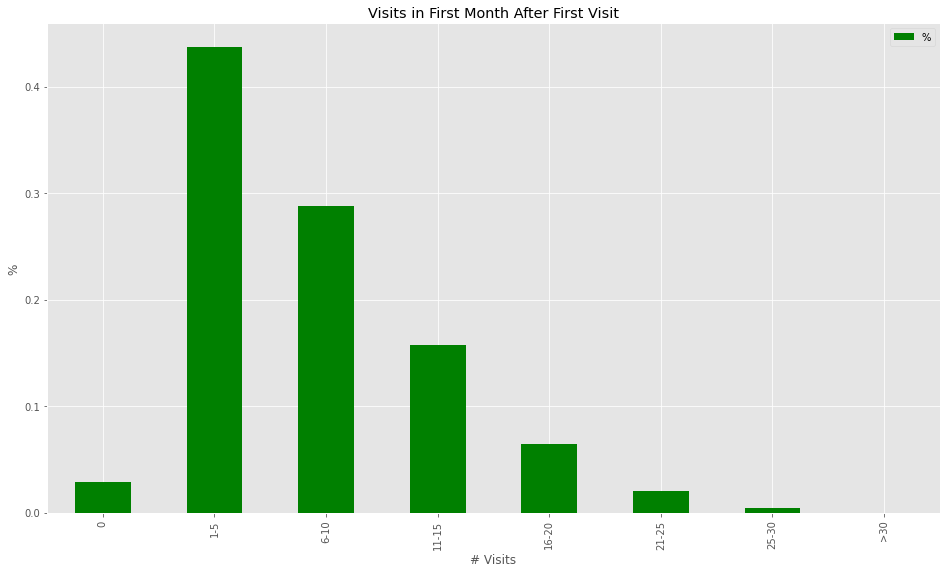

In [351]:
visits_0 = 0
visits_1_5 = 0
visits_6_10 = 0
visits_11_15 = 0
visits_16_20 = 0
visits_21_25 = 0
visits_26_30 = 0
visits_30_plus = 0

for x in VISITS_1_MT:
    if x == 0:
        visits_0 += 1
    if x > 0 and x <= 5:
        visits_1_5 += 1
    if x > 5 and x <= 10:
        visits_6_10 += 1
    if x > 10 and x <= 15:
        visits_11_15 += 1
    if x > 15 and x <= 20:
        visits_16_20 += 1
    if x > 20 and x <= 25:
        visits_21_25 += 1
    if x > 25 and x <= 30:
        visits_26_30 += 1
    if x > 30:
        visits_30_plus += 1
    
print(f"visits_0: {visits_0} / {len(VISITS_1_MT)} == {visits_0 / len(VISITS_1_MT)}")
print(f"visits_1_5: {visits_1_5} / {len(VISITS_1_MT)} == {visits_1_5 / len(VISITS_1_MT)}")
print(f"visits_6_10: {visits_6_10} / {len(VISITS_1_MT)} == {visits_6_10 / len(VISITS_1_MT)}")
print(f"visits_11_15: {visits_11_15} / {len(VISITS_1_MT)} == {visits_11_15 / len(VISITS_1_MT)}")
print(f"visits_16_20: {visits_16_20} / {len(VISITS_1_MT)} == {visits_16_20 / len(VISITS_1_MT)}")
print(f"visits_21_25: {visits_21_25} / {len(VISITS_1_MT)} == {visits_21_25 / len(VISITS_1_MT)}")
print(f"visits_26_30: {visits_26_30} / {len(VISITS_1_MT)} == {visits_26_30 / len(VISITS_1_MT)}")
print(f"visits_30_plus: {visits_30_plus} / {len(VISITS_1_MT)} == {visits_30_plus / len(VISITS_1_MT)}")

GRAPH_DATA = pd.DataFrame({
   '# Visits' : ["0","1-5","6-10","11-15","16-20","21-25","25-30",">30"],
    '%': [
            visits_0 / len(VISITS_1_MT),
            visits_1_5 / len(VISITS_1_MT),
            visits_6_10 / len(VISITS_1_MT),
            visits_11_15 / len(VISITS_1_MT),
            visits_16_20 / len(VISITS_1_MT),
            visits_21_25 / len(VISITS_1_MT),
            visits_26_30 / len(VISITS_1_MT),
            visits_30_plus / len(VISITS_1_MT),
        ],
})

# GRAPH_DATA

GRAPH_DATA.plot(x="# Visits", y=["%"], kind="bar", figsize=(16,9), title='Visits in First Month After First Visit', ylabel='%',color='green')


visits_0: 374 / 32907 == 0.01136536299267633
visits_1_5: 8734 / 32907 == 0.26541465341720605
visits_6_10: 5587 / 32907 == 0.16978150545476647
visits_11_15: 4519 / 32907 == 0.13732640471632176
visits_16_20: 3673 / 32907 == 0.11161758896283465
visits_21_25: 2820 / 32907 == 0.08569605251162367
visits_26_30: 2161 / 32907 == 0.06566991825447473
visits_31_35: 1624 / 32907 == 0.04935120187194214
visits_36_40: 1117 / 32907 == 0.033944145622511926
visits_40_plus: 2298 / 32907 == 0.06983316619564227


<AxesSubplot:title={'center':'Visits in First 3 Months After First Visit'}, xlabel='# Visits', ylabel='%'>

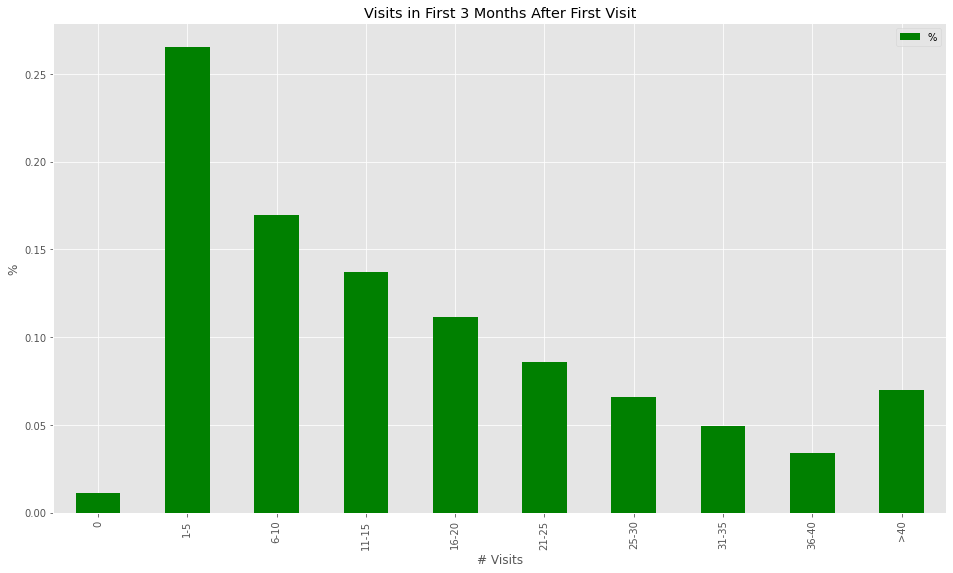

In [357]:
visits_0 = 0
visits_1_5 = 0
visits_6_10 = 0
visits_11_15 = 0
visits_16_20 = 0
visits_21_25 = 0
visits_26_30 = 0
visits_31_35 = 0
visits_36_40 = 0
visits_40_plus = 0

for x in VISITS_3_MT:
    if x == 0:
        visits_0 += 1
    if x > 0 and x <= 5:
        visits_1_5 += 1
    if x > 5 and x <= 10:
        visits_6_10 += 1
    if x > 10 and x <= 15:
        visits_11_15 += 1
    if x > 15 and x <= 20:
        visits_16_20 += 1
    if x > 20 and x <= 25:
        visits_21_25 += 1
    if x > 25 and x <= 30:
        visits_26_30 += 1
    if x > 30 and x <= 35:
        visits_31_35 += 1
    if x > 35 and x <= 40:
        visits_36_40 += 1
    if x > 40:
        visits_40_plus += 1
    
print(f"visits_0: {visits_0} / {len(VISITS_3_MT)} == {visits_0 / len(VISITS_3_MT)}")
print(f"visits_1_5: {visits_1_5} / {len(VISITS_3_MT)} == {visits_1_5 / len(VISITS_3_MT)}")
print(f"visits_6_10: {visits_6_10} / {len(VISITS_3_MT)} == {visits_6_10 / len(VISITS_3_MT)}")
print(f"visits_11_15: {visits_11_15} / {len(VISITS_3_MT)} == {visits_11_15 / len(VISITS_3_MT)}")
print(f"visits_16_20: {visits_16_20} / {len(VISITS_3_MT)} == {visits_16_20 / len(VISITS_3_MT)}")
print(f"visits_21_25: {visits_21_25} / {len(VISITS_3_MT)} == {visits_21_25 / len(VISITS_3_MT)}")
print(f"visits_26_30: {visits_26_30} / {len(VISITS_3_MT)} == {visits_26_30 / len(VISITS_3_MT)}")
print(f"visits_31_35: {visits_31_35} / {len(VISITS_3_MT)} == {visits_31_35 / len(VISITS_3_MT)}")
print(f"visits_36_40: {visits_36_40} / {len(VISITS_3_MT)} == {visits_36_40 / len(VISITS_3_MT)}")
print(f"visits_40_plus: {visits_40_plus} / {len(VISITS_3_MT)} == {visits_40_plus / len(VISITS_3_MT)}")

GRAPH_DATA = pd.DataFrame({
   '# Visits' : ["0","1-5","6-10","11-15","16-20","21-25","25-30","31-35","36-40",">40"],
    '%': [
            visits_0 / len(VISITS_3_MT),
            visits_1_5 / len(VISITS_3_MT),
            visits_6_10 / len(VISITS_3_MT),
            visits_11_15 / len(VISITS_3_MT),
            visits_16_20 / len(VISITS_3_MT),
            visits_21_25 / len(VISITS_3_MT),
            visits_26_30 / len(VISITS_3_MT),
            visits_31_35 / len(VISITS_3_MT),
            visits_36_40 / len(VISITS_3_MT),
            visits_40_plus / len(VISITS_3_MT),
        ],
})

# GRAPH_DATA

GRAPH_DATA.plot(x="# Visits", y=["%"], kind="bar", figsize=(16,9), title='Visits in First 3 Months After First Visit', ylabel='%',color='green')


visits_0: 206 / 32907 == 0.006260066247303005
visits_1_5: 7186 / 32907 == 0.2183729905491233
visits_6_10: 4014 / 32907 == 0.12198012580909837
visits_11_15: 3131 / 32907 == 0.095146929224785
visits_16_20: 2641 / 32907 == 0.0802564803841128
visits_21_25: 2251 / 32907 == 0.06840489865378187
visits_26_30: 2051 / 32907 == 0.06232716443309934
visits_31_35: 1758 / 32907 == 0.05342328379979944
visits_36_40: 1565 / 32907 == 0.04755827027684079
visits_41_45: 1421 / 32907 == 0.04318230163794937
visits_46_50: 1115 / 32907 == 0.0338833682803051
visits_50_plus: 5568 / 32907 == 0.1692041207038016


<AxesSubplot:title={'center':'Visits in First 6 Months After First Visit'}, xlabel='# Visits', ylabel='%'>

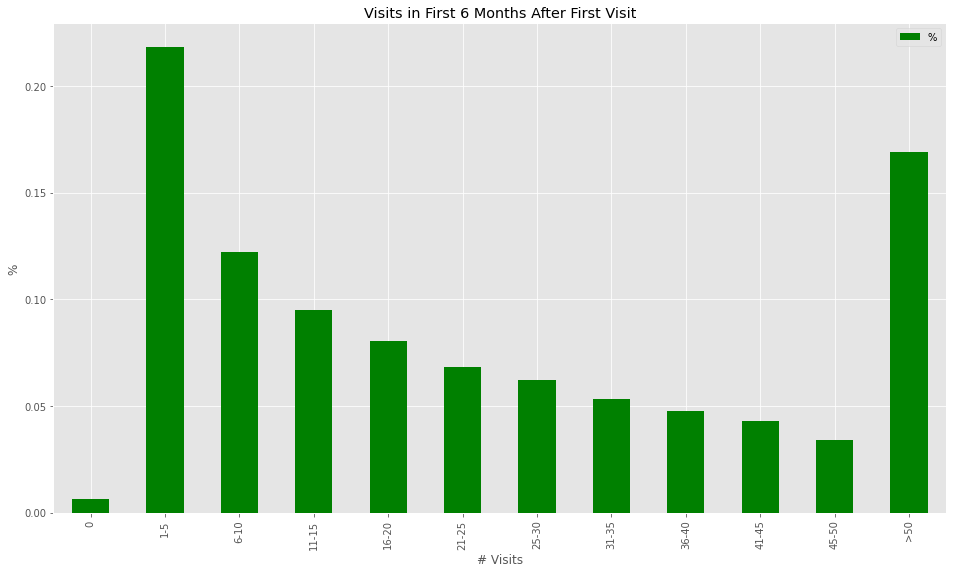

In [358]:
visits_0 = 0
visits_1_5 = 0
visits_6_10 = 0
visits_11_15 = 0
visits_16_20 = 0
visits_21_25 = 0
visits_26_30 = 0
visits_31_35 = 0
visits_36_40 = 0
visits_41_45 = 0
visits_46_50 = 0
visits_50_plus = 0

for x in VISITS_6_MT:
    if x == 0:
        visits_0 += 1
    if x > 0 and x <= 5:
        visits_1_5 += 1
    if x > 5 and x <= 10:
        visits_6_10 += 1
    if x > 10 and x <= 15:
        visits_11_15 += 1
    if x > 15 and x <= 20:
        visits_16_20 += 1
    if x > 20 and x <= 25:
        visits_21_25 += 1
    if x > 25 and x <= 30:
        visits_26_30 += 1
    if x > 30 and x <= 35:
        visits_31_35 += 1
    if x > 35 and x <= 40:
        visits_36_40 += 1
    if x > 40 and x <= 45:
        visits_41_45 += 1
    if x > 45 and x <= 50:
        visits_46_50 += 1
    if x > 50:
        visits_50_plus += 1
    
print(f"visits_0: {visits_0} / {len(VISITS_6_MT)} == {visits_0 / len(VISITS_6_MT)}")
print(f"visits_1_5: {visits_1_5} / {len(VISITS_6_MT)} == {visits_1_5 / len(VISITS_6_MT)}")
print(f"visits_6_10: {visits_6_10} / {len(VISITS_6_MT)} == {visits_6_10 / len(VISITS_6_MT)}")
print(f"visits_11_15: {visits_11_15} / {len(VISITS_6_MT)} == {visits_11_15 / len(VISITS_6_MT)}")
print(f"visits_16_20: {visits_16_20} / {len(VISITS_6_MT)} == {visits_16_20 / len(VISITS_6_MT)}")
print(f"visits_21_25: {visits_21_25} / {len(VISITS_6_MT)} == {visits_21_25 / len(VISITS_6_MT)}")
print(f"visits_26_30: {visits_26_30} / {len(VISITS_6_MT)} == {visits_26_30 / len(VISITS_6_MT)}")
print(f"visits_31_35: {visits_31_35} / {len(VISITS_6_MT)} == {visits_31_35 / len(VISITS_6_MT)}")
print(f"visits_36_40: {visits_36_40} / {len(VISITS_6_MT)} == {visits_36_40 / len(VISITS_6_MT)}")
print(f"visits_41_45: {visits_41_45} / {len(VISITS_6_MT)} == {visits_41_45 / len(VISITS_6_MT)}")
print(f"visits_46_50: {visits_46_50} / {len(VISITS_6_MT)} == {visits_46_50 / len(VISITS_6_MT)}")
print(f"visits_50_plus: {visits_50_plus} / {len(VISITS_6_MT)} == {visits_50_plus / len(VISITS_6_MT)}")

GRAPH_DATA = pd.DataFrame({
   '# Visits' : ["0","1-5","6-10","11-15","16-20","21-25","25-30","31-35","36-40","41-45","45-50",">50"],
    '%': [
            visits_0 / len(VISITS_6_MT),
            visits_1_5 / len(VISITS_6_MT),
            visits_6_10 / len(VISITS_6_MT),
            visits_11_15 / len(VISITS_6_MT),
            visits_16_20 / len(VISITS_6_MT),
            visits_21_25 / len(VISITS_6_MT),
            visits_26_30 / len(VISITS_6_MT),
            visits_31_35 / len(VISITS_6_MT),
            visits_36_40 / len(VISITS_6_MT),
            visits_41_45 / len(VISITS_6_MT),
            visits_46_50 / len(VISITS_6_MT),
            visits_50_plus / len(VISITS_6_MT),
        ],
})

# GRAPH_DATA

GRAPH_DATA.plot(x="# Visits", y=["%"], kind="bar", figsize=(16,9), title='Visits in First 6 Months After First Visit', ylabel='%',color='green')


visits_0: 128 / 32907 == 0.0038897499012368188
visits_1_5: 6652 / 32907 == 0.20214544017990094
visits_6_10: 3555 / 32907 == 0.10803172577263197
visits_11_15: 2685 / 32907 == 0.08159358191266296
visits_16_20: 2091 / 32907 == 0.06354271127723585
visits_21_25: 1719 / 32907 == 0.052238125626766344
visits_26_30: 1502 / 32907 == 0.0456437839973258
visits_31_35: 1418 / 32907 == 0.043091135624639135
visits_36_40: 1215 / 32907 == 0.03692223539064637
visits_41_45: 1131 / 32907 == 0.0343695870179597
visits_46_50: 957 / 32907 == 0.029081958245965905
visits_51_55: 882 / 32907 == 0.026802807913209957
visits_56_60: 823 / 32907 == 0.02500987631810861
visits_60_plus: 8149 / 32907 == 0.24763728082170966


<AxesSubplot:title={'center':'Visits in First 12 Months After First Visit'}, xlabel='# Visits', ylabel='%'>

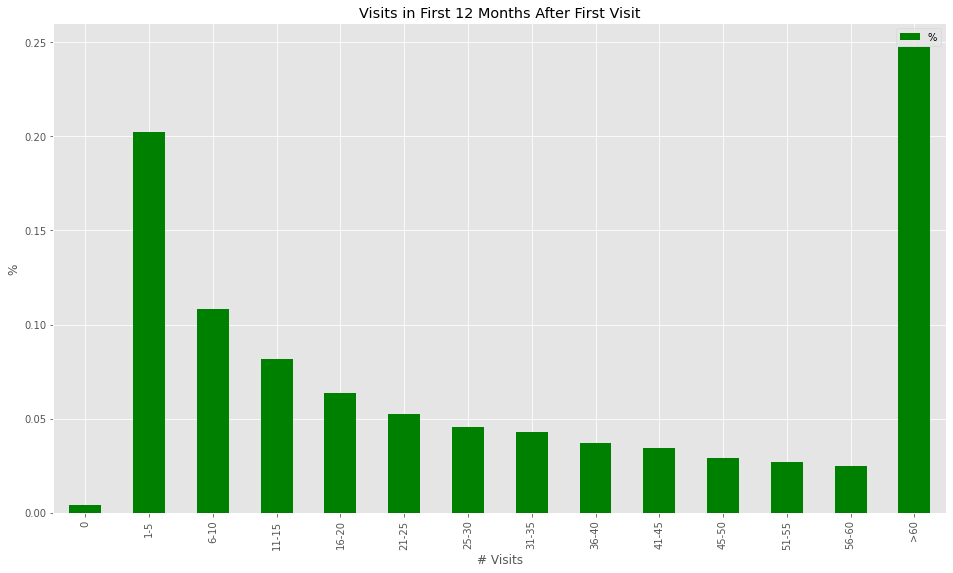

In [360]:
visits_0 = 0
visits_1_5 = 0
visits_6_10 = 0
visits_11_15 = 0
visits_16_20 = 0
visits_21_25 = 0
visits_26_30 = 0
visits_31_35 = 0
visits_36_40 = 0
visits_41_45 = 0
visits_46_50 = 0
visits_51_55 = 0
visits_56_60 = 0
visits_60_plus = 0

for x in VISITS_12_MT:
    if x == 0:
        visits_0 += 1
    if x > 0 and x <= 5:
        visits_1_5 += 1
    if x > 5 and x <= 10:
        visits_6_10 += 1
    if x > 10 and x <= 15:
        visits_11_15 += 1
    if x > 15 and x <= 20:
        visits_16_20 += 1
    if x > 20 and x <= 25:
        visits_21_25 += 1
    if x > 25 and x <= 30:
        visits_26_30 += 1
    if x > 30 and x <= 35:
        visits_31_35 += 1
    if x > 35 and x <= 40:
        visits_36_40 += 1
    if x > 40 and x <= 45:
        visits_41_45 += 1
    if x > 45 and x <= 50:
        visits_46_50 += 1
    if x > 50 and x <= 55:
        visits_51_55 += 1
    if x > 55 and x <= 60:
        visits_56_60 += 1
    if x > 60:
        visits_60_plus += 1
    
print(f"visits_0: {visits_0} / {len(VISITS_12_MT)} == {visits_0 / len(VISITS_12_MT)}")
print(f"visits_1_5: {visits_1_5} / {len(VISITS_12_MT)} == {visits_1_5 / len(VISITS_12_MT)}")
print(f"visits_6_10: {visits_6_10} / {len(VISITS_12_MT)} == {visits_6_10 / len(VISITS_12_MT)}")
print(f"visits_11_15: {visits_11_15} / {len(VISITS_12_MT)} == {visits_11_15 / len(VISITS_12_MT)}")
print(f"visits_16_20: {visits_16_20} / {len(VISITS_12_MT)} == {visits_16_20 / len(VISITS_12_MT)}")
print(f"visits_21_25: {visits_21_25} / {len(VISITS_12_MT)} == {visits_21_25 / len(VISITS_12_MT)}")
print(f"visits_26_30: {visits_26_30} / {len(VISITS_12_MT)} == {visits_26_30 / len(VISITS_12_MT)}")
print(f"visits_31_35: {visits_31_35} / {len(VISITS_12_MT)} == {visits_31_35 / len(VISITS_12_MT)}")
print(f"visits_36_40: {visits_36_40} / {len(VISITS_12_MT)} == {visits_36_40 / len(VISITS_12_MT)}")
print(f"visits_41_45: {visits_41_45} / {len(VISITS_12_MT)} == {visits_41_45 / len(VISITS_12_MT)}")
print(f"visits_46_50: {visits_46_50} / {len(VISITS_12_MT)} == {visits_46_50 / len(VISITS_12_MT)}")
print(f"visits_51_55: {visits_51_55} / {len(VISITS_12_MT)} == {visits_51_55 / len(VISITS_12_MT)}")
print(f"visits_56_60: {visits_56_60} / {len(VISITS_12_MT)} == {visits_56_60 / len(VISITS_12_MT)}")
print(f"visits_60_plus: {visits_60_plus} / {len(VISITS_12_MT)} == {visits_60_plus / len(VISITS_12_MT)}")

GRAPH_DATA = pd.DataFrame({
   '# Visits' : ["0","1-5","6-10","11-15","16-20","21-25","25-30","31-35","36-40","41-45","45-50","51-55","56-60",">60"],
    '%': [
            visits_0 / len(VISITS_12_MT),
            visits_1_5 / len(VISITS_12_MT),
            visits_6_10 / len(VISITS_12_MT),
            visits_11_15 / len(VISITS_12_MT),
            visits_16_20 / len(VISITS_12_MT),
            visits_21_25 / len(VISITS_12_MT),
            visits_26_30 / len(VISITS_12_MT),
            visits_31_35 / len(VISITS_12_MT),
            visits_36_40 / len(VISITS_12_MT),
            visits_41_45 / len(VISITS_12_MT),
            visits_46_50 / len(VISITS_12_MT),
            visits_51_55 / len(VISITS_12_MT),
            visits_56_60 / len(VISITS_12_MT),
            visits_60_plus / len(VISITS_12_MT),
        ],
})

# GRAPH_DATA

GRAPH_DATA.plot(x="# Visits", y=["%"], kind="bar", figsize=(16,9), title='Visits in First 12 Months After First Visit', ylabel='%',color='green')


In [312]:
gate_events[gate_events['m_tpuniqueid'] == '100024573']


,id,l_id,l_name,l_tpid,l_panelname,d_name,d_type,a_timestamp,a_result,m_tpuniqueid,m_cardid,m_vuid,m_firstname,m_lastname,m_email,m_status,m_type,status,type,d_id,m_tpcardid,m_cardshortcode,m_fullcard,m_balance
0,1,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE ENTRY (3) [VI],IN,2018-10-26 12:08:58,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
220,222,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE EXIT (4) [VO],OUT,2018-10-26 13:05:31,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
21897,21899,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE ENTRY (3) [VI],IN,2018-10-30 14:31:08,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
22030,22032,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE EXIT (4) [VO],OUT,2018-10-30 15:13:14,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
60660,60662,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,ENTRY DOOR (2),NA,2018-11-05 21:20:14,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
60663,60665,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE ENTRY (3) [VI],IN,2018-11-05 21:20:25,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
60814,60816,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE EXIT (4) [VO],OUT,2018-11-05 22:01:06,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,,COMPLETE,None,None,None,None,None,NaN
102711,102713,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE ENTRY,IN,2018-11-13 08:00:54,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,STANDARD,COMPLETE,None,None,None,None,None,NaN
102715,102717,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE EXIT,OUT,2018-11-13 08:01:25,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,STANDARD,COMPLETE,None,None,None,None,None,NaN
102839,102841,ba99a699-6182-4b47-89c9-c898a37cf068,Marrickville Fitness Playground,3,MAR,GATE ENTRY,IN,2018-11-13 08:17:41,0,100024573,18276,786f93b1-7800-4a05-9a25-808990c11ba5,Michelle,Bennett,,Active,STANDARD,COMPLETE,None,None,None,None,None,NaN


In [328]:
gate_events['m_type'].unique()

['STANDARD','BUNKER','DISABLED', 'STANDARD-U18', 'BUNKER-U18','Member','Bunker','Member Underage', 'No Access', 'Bunker Underage','Flex Access']

array(['', None, 'STANDARD', 'FULLACCESS', 'TRAINER', 'BUNKER',
       'DISABLED', 'STAFF', 'STANDARD-U18', 'TRADE', 'BUNKER-U18',
       'DARWIN', 'DARWIN-U18', 'Installer', 'Member', 'Trade', 'Bunker',
       'Trainers', 'Staff', 'Member Underage', 'No Access', 'Full Access',
       'Cleaners', 'Bunker Underage', 'OWNER', 'SYD Staff', 'PAL Staff',
       'Department Head', 'Gym Manager', 'Flex Access'], dtype=object)

In [ ]:
date = None
    for g_index, g_row in g.iterrows():

        if not has_mbo_unique_id:
            mbo_unique_ids.append(g_row['m_tpuniqueid'])
            mbo_unique_id = g_row['m_tpuniqueid']
            has_mbo_unique_id = True

        if date is None or pd.to_datetime(g_row['a_timestamp']).date() != date:
            date = pd.to_datetime(g_row['a_timestamp']).date()

In [314]:
pd.to_datetime('2018-10-26 12:08:58') + relativedelta(months=+1)

Timestamp('2018-11-26 12:08:58')

In [315]:
data[100]

{'id': 118,
 'gymName': 'Marrickville',
 'memberContracts': '187,120',
 'createDate': '2019-10-14 16:37:49',
 'locationId': None,
 'phone': '+61490784928',
 'firstName': 'Spencer',
 'lastName': 'Wilson',
 'email': 'preferredcarpentry@yahoo.com',
 'postcode': None,
 'dob': '1973-05-19',
 'gender': 'male',
 'howDidYouHearAboutUs': 'other',
 'numberOneGoal': 'feelBetter',
 'paymentType': 'bankAccount',
 'gymOrPlay': 'gym',
 'ddOrPif': 'dd',
 'noCommitment': '12Month',
 'startDate': '2019-10-14',
 'trainingStarterPack': 'fitnessGuru',
 'numberSessionsPerWeek': '',
 'daysFree': '14DaysFree',
 'accessKeyDiscount': 'Key30',
 'freePTPack': '',
 'staffMember': None,
 'accessKeyNumber': '42307',
 'injuries': True,
 'medical': True,
 'trainingAvailability': 'any',
 'timeAvailability': 'afterWork',
 'mboUniqueId': '100058826',
 'preExId': None,
 'age': 46.0,
 'free time visits': 0,
 '7 day visits': 1,
 '14 day visits': 3,
 '21 day visits': 6,
 '28 day visits': 8,
 '35 day visits': 8,
 '42 day visi